In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
df = pd.read_excel("/content/drive/MyDrive/research_Mine/usgs.raritan.project.microcystin.nutrients.phytoplankton.xlsx", parse_dates=["dateTime"])


In [ ]:
#site no 1401000 data
df = df[df['site_no'] == 1401000]
df.head()

,site_no,site_abbreviation,Individual,sample_time,dateTime,microcystin_total_abraxis_ugL,Ammonia,Nitrate + Nitrite,Orthophosphate,Total nitrogen,Total Phosphorus,Inorg N,% Org N,% Org P,Total_Cyanobacteria,Total_phytoplankton
80,1401000,MR1,MR1-1,2020-08-11 13:40:00,2020-08-11 13:45:00,0.075,32.0,460.0,139.0,937.0,176.0,492.0,48.0,21.0,6506.0,7280.0
81,1401000,MR1,MR1-2,2020-08-25 14:38:00,2020-08-25 14:45:00,0.075,31.0,559.0,88.0,859.0,132.0,591.0,31.0,34.0,465.0,774.0
82,1401000,MR1,MR1-3,2020-09-08 13:30:00,2020-09-08 13:30:00,0.075,20.0,727.0,104.0,1053.0,133.0,748.0,29.0,22.0,2788.0,3408.0
83,1401000,MR1,MR1-4,2020-09-22 13:38:00,2020-09-22 13:30:00,0.075,9.0,137.0,25.0,258.0,38.0,146.0,44.0,36.0,1394.0,1626.0
84,1401000,MR1,MR1-5,2020-10-06 13:34:00,2020-10-06 13:30:00,0.075,11.0,895.0,98.0,1177.0,119.0,906.0,23.0,18.0,310.0,774.0


In [ ]:
#datatypes
df.dtypes


,0
site_no,int64
site_abbreviation,object
Individual,object
sample_time,datetime64[ns]
dateTime,datetime64[ns]
microcystin_total_abraxis_ugL,float64
Ammonia,float64
Nitrate + Nitrite,float64
Orthophosphate,float64
Total nitrogen,float64


In [ ]:
#check for null
df.isnull().sum()
#fill null with median of that particular site_no
df['Nitrate + Nitrite'].fillna(df.groupby('site_no')['Nitrate + Nitrite'].transform('median'), inplace=True)
df['Total nitrogen'].fillna(df.groupby('site_no')['Total nitrogen'].transform('median'), inplace=True)
df['Total Phosphorus'].fillna(df.groupby('site_no')['Total Phosphorus'].transform('median'), inplace=True)
df['Inorg N'].fillna(df.groupby('site_no')['Inorg N'].transform('median'), inplace=True)
df['% Org N'].fillna(df.groupby('site_no')['% Org N'].transform('median'), inplace=True)
df['% Org P'].fillna(df.groupby('site_no')['% Org P'].transform('median'), inplace=True)
df['Total_Cyanobacteria'].fillna(df.groupby('site_no')['Total_Cyanobacteria'].transform('median'), inplace=True)
df['Total_phytoplankton'].fillna(df.groupby('site_no')['Total_phytoplankton'].transform('median'), inplace=True)
df['Ammonia'].fillna(df.groupby('site_no')['Ammonia'].transform('median'), inplace=True)
df['Orthophosphate'].fillna(df.groupby('site_no')['Orthophosphate'].transform('median'), inplace=True)

df.isnull().sum()
#df.fillna(df.median(), inplace=True)

<ipython-input-81-91a086db0f16>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Nitrate + Nitrite'].fillna(df.groupby('site_no')['Nitrate + Nitrite'].transform('median'), inplace=True)
<ipython-input-81-91a086db0f16>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

,0
site_no,0
site_abbreviation,0
Individual,0
sample_time,0
dateTime,0
microcystin_total_abraxis_ugL,0
Ammonia,0
Nitrate + Nitrite,0
Orthophosphate,0
Total nitrogen,0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import interpolate
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
import warnings
warnings.filterwarnings('ignore')

# Load the data
df = pd.read_excel('/content/drive/MyDrive/research_Mine/usgs.raritan.project.microcystin.nutrients.phytoplankton.xlsx')

# Convert datetime columns
df['sample_time'] = pd.to_datetime(df['sample_time'])
df['dateTime'] = pd.to_datetime(df['dateTime'])

# Define the date range for imputation
start_date = '2020-08-11'
end_date = '2021-08-31'
date_range = pd.date_range(start=start_date, end=end_date, freq='D')

# Get unique sites
unique_sites = df['site_no'].unique()

# Numerical columns to impute
numerical_columns = [
    'microcystin_total_abraxis_ugL', 'Ammonia', 'Nitrate + Nitrite',
    'Orthophosphate', 'Total nitrogen', 'Total Phosphorus',
    'Inorg N', '% Org N', '% Org P', 'Total_Cyanobacteria', 'Total_phytoplankton'
]

# Function for linear interpolation
def linear_interpolation(site_data, date_range):
    # Create a complete time series with all dates
    complete_index = pd.DataFrame(index=date_range)
    site_data_reindexed = site_data.set_index('dateTime')

    # Merge with original data
    merged = complete_index.join(site_data_reindexed)

    # Interpolate
    interpolated = merged.interpolate(method='linear')

    return interpolated

# Function for cubic spline interpolation
def spline_interpolation(site_data, date_range):
    # Create a complete time series with all dates
    complete_index = pd.DataFrame(index=date_range)
    site_data_reindexed = site_data.set_index('dateTime')

    # Merge with original data
    merged = complete_index.join(site_data_reindexed)

    # Interpolate, but change the method to 'linear' for datetimelike columns
    # or 'spline' for numeric columns.
    interpolated = merged.interpolate(method='linear') # Change 'cubic' to 'linear'

    return interpolated

# Function for seasonal decomposition
def seasonal_decomposition(site_data, date_range, column):
    # Create a complete time series with all dates
    complete_index = pd.DataFrame(index=date_range)
    site_data_reindexed = site_data.set_index('dateTime')

    # Merge with original data
    merged = complete_index.join(site_data_reindexed)

    # First perform linear interpolation to have enough data
    interpolated = merged.interpolate(method='linear')

    if len(interpolated.dropna()) >= 2:  # Need at least 2 data points
        # Apply STL decomposition if we have enough data
        try:
            # We need a season length, let's use 14 days as a reasonable seasonal period for water quality
            season_length = 14
            if len(interpolated) > season_length * 2:
                stl = STL(interpolated[column].fillna(method='ffill').fillna(method='bfill'),
                          seasonal=season_length, trend=None)
                result = stl.fit()

                # Extract components
                seasonal = result.seasonal
                trend = result.trend
                residual = result.resid

                # Fill missing values in the trend component
                filled_trend = trend.interpolate(method='linear')

                # Reconstruct the series
                reconstructed = filled_trend + seasonal

                # Replace the original column with reconstructed values
                interpolated[column] = reconstructed

                return interpolated
        except:
            pass

    # Fall back to linear interpolation if STL fails or data isn't sufficient
    return interpolated

# Function for time delay embedding
def time_delay_embedding(site_data, date_range, column):
    # Create a complete time series with all dates
    complete_index = pd.DataFrame(index=date_range)
    site_data_reindexed = site_data.set_index('dateTime')

    # Merge with original data
    merged = complete_index.join(site_data_reindexed)

    # Extract the column of interest
    series = merged[column]

    # If we have too few data points, fall back to linear interpolation
    if len(series.dropna()) < 5:
        return merged.interpolate(method='linear')

    # Create lagged features
    df_ml = pd.DataFrame(index=series.index)
    df_ml['target'] = series

    # Create 3 lags - adjust this depending on your data
    for i in range(1, 4):
        df_ml[f'lag_{i}'] = series.shift(i)

    # Split into train (known values) and test (missing values)
    train = df_ml.dropna(subset=['target'])

    # If we have too few training samples, fall back to linear interpolation
    if len(train) < 3:
        return merged.interpolate(method='linear')

    # Create test data (all dates)
    test = df_ml.copy()

    # Fill lagged values with linear interpolation first
    for i in range(1, 4):
        test[f'lag_{i}'] = test[f'lag_{i}'].interpolate(method='linear').fillna(method='bfill').fillna(method='ffill')

    # Train a KNN model
    X_train = train.drop('target', axis=1)
    y_train = train['target']

    # If we have missing values in X_train, fill them
    X_train = X_train.fillna(method='ffill').fillna(method='bfill')

    # Initialize and train the model
    knn = KNeighborsRegressor(n_neighbors=min(3, len(X_train)))
    knn.fit(X_train, y_train)

    # Predict missing values
    missing_idx = test['target'].isna()
    if sum(missing_idx) > 0:
        X_missing = test.loc[missing_idx].drop('target', axis=1)
        test.loc[missing_idx, 'target'] = knn.predict(X_missing)

    # Update the column in the original dataframe
    merged[column] = test['target']

    return merged

# Create dictionaries to store all imputed datasets for each site
all_results = {}
original_data_by_site = {}
evaluation_metrics = {}

# Process each site
for site in unique_sites:
    print(f"Processing site: {site}")

    # Filter data for the specific site
    site_data = df[df['site_no'] == site].copy()

    # Filter for the time period
    site_data = site_data[(site_data['dateTime'] >= start_date) & (site_data['dateTime'] <= end_date)]

    # Store original data for this site
    original_data_by_site[site] = site_data.copy()

    # Dictionary to store all imputation results for this site
    site_results = {
        'linear': {},
        'spline': {},
        'seasonal': {},
        'time_delay': {}
    }

    # Initialize the evaluation metrics for this site
    evaluation_metrics[site] = {col: {} for col in numerical_columns}

    # Apply each imputation method

    # 1. Linear interpolation
    linear_imputed = linear_interpolation(site_data, date_range)
    site_results['linear'] = linear_imputed[numerical_columns].copy()

    # 2. Cubic spline interpolation
    spline_imputed = spline_interpolation(site_data, date_range)
    site_results['spline'] = spline_imputed[numerical_columns].copy()

    # 3. Seasonal decomposition and 4. Time delay embedding
    for column in numerical_columns:
        # Apply seasonal decomposition
        seasonal_imputed = seasonal_decomposition(site_data, date_range, column)
        site_results['seasonal'][column] = seasonal_imputed[column].copy()

        # Apply time delay embedding
        time_delay_imputed = time_delay_embedding(site_data, date_range, column)
        site_results['time_delay'][column] = time_delay_imputed[column].copy()

    # Perform evaluation
    for column in numerical_columns:
        # Create a DataFrame for original and imputed values
        eval_df = pd.DataFrame(index=date_range)
        eval_df['original'] = site_data.set_index('dateTime')[column] if column in site_data.columns else None
        eval_df['linear'] = site_results['linear'][column] if column in site_results['linear'] else None
        eval_df['spline'] = site_results['spline'][column] if column in site_results['spline'] else None
        eval_df['seasonal'] = site_results['seasonal'][column] if column in site_results['seasonal'] else None
        eval_df['time_delay'] = site_results['time_delay'][column] if column in site_results['time_delay'] else None

        # Calculate metrics
        original_values = eval_df['original'].dropna()

        # Only calculate metrics if we have original values
        if len(original_values) > 0:
            methods = ['linear', 'spline', 'seasonal', 'time_delay']
            for method in methods:
                # Calculate basic statistics
                original_mean = original_values.mean()
                imputed_mean = eval_df[method].mean()
                original_std = original_values.std()
                imputed_std = eval_df[method].std()

                # Calculate autocorrelation (lag 1)
                try:
                    original_autocorr = original_values.autocorr(lag=1)
                    imputed_autocorr = eval_df[method].autocorr(lag=1)
                except:
                    original_autocorr = np.nan
                    imputed_autocorr = np.nan

                # Store metrics
                evaluation_metrics[site][column][method] = {
                    'original_mean': original_mean,
                    'imputed_mean': imputed_mean,
                    'original_std': original_std,
                    'imputed_std': imputed_std,
                    'original_autocorr': original_autocorr,
                    'imputed_autocorr': imputed_autocorr,
                    'mean_diff': abs(original_mean - imputed_mean),
                    'std_diff': abs(original_std - imputed_std),
                    'autocorr_diff': abs(original_autocorr - imputed_autocorr) if not np.isnan(original_autocorr) and not np.isnan(imputed_autocorr) else np.nan
                }

    # Store results for this site
    all_results[site] = site_results

# Create the final imputed dataset for each site
final_imputed_datasets = {}

for site in unique_sites:
    print(f"Creating final imputed dataset for site: {site}")

    # Get original site data
    site_data = original_data_by_site[site]

    # Create a DataFrame with daily date range
    final_df = pd.DataFrame(index=date_range)

    # Add the site identifier columns
    # Get site's metadata
    site_info = site_data[['site_no', 'site_abbreviation']].iloc[0]
    final_df['site_no'] = site_info['site_no']
    final_df['site_abbreviation'] = site_info['site_abbreviation']

    # Add the dateTime column
    final_df['dateTime'] = final_df.index

    # Determine most common sample time for this site
    if len(site_data) > 0 and 'sample_time' in site_data.columns:
        # Extract just the time part
        site_data['time_only'] = site_data['sample_time'].dt.time
        most_common_time = site_data['time_only'].mode().iloc[0]

        # Create sample_time by combining date and most common time
        final_df['sample_time'] = pd.to_datetime(final_df.index.date.astype(str) + ' ' +
                                               str(most_common_time))
    else:
        # Default to noon if no sample times available
        final_df['sample_time'] = pd.to_datetime(final_df.index.date.astype(str) + ' 12:00:00')

    # Select the best imputation method for each column based on evaluation metrics
    for column in numerical_columns:
        # Initialize with linear interpolation as default
        best_method = 'linear'

        # Only try to find a best method if we have evaluation metrics
        if site in evaluation_metrics and column in evaluation_metrics[site] and evaluation_metrics[site][column]:
            # Define a simple scoring function - lower is better
            method_scores = {}
            for method in ['linear', 'spline', 'seasonal', 'time_delay']:
                metrics = evaluation_metrics[site][column].get(method, {})

                # Skip if metrics are missing
                if not metrics:
                    continue

                # Calculate score based on mean difference, std difference, and autocorr difference
                mean_diff = metrics.get('mean_diff', float('inf'))
                std_diff = metrics.get('std_diff', float('inf'))
                autocorr_diff = metrics.get('autocorr_diff', float('inf'))

                # Calculate score (weighting the components)
                score = mean_diff * 0.4 + std_diff * 0.4 + (autocorr_diff if not np.isnan(autocorr_diff) else 0) * 0.2
                method_scores[method] = score

            # Find the method with the lowest score
            if method_scores:
                best_method = min(method_scores, key=method_scores.get)

        # Get the imputed values using the best method
        if best_method == 'linear':
            final_df[column] = all_results[site]['linear'][column]
        elif best_method == 'spline':
            final_df[column] = all_results[site]['spline'][column]
        elif best_method == 'seasonal':
            final_df[column] = all_results[site]['seasonal'][column]
        elif best_method == 'time_delay':
            final_df[column] = all_results[site]['time_delay'][column]

        # Track which method was used
        final_df[f'{column}_method_used'] = best_method

    # Store the final imputed dataset
    final_imputed_datasets[site] = final_df.reset_index(drop=True)

# Visualize results for a sample site and column
def visualize_imputation(site, column):
    plt.figure(figsize=(15, 8))

    # Get original data
    original_data = original_data_by_site[site]
    original_data_dates = original_data['dateTime']
    original_data_values = original_data[column]

    # Plot original data
    plt.scatter(original_data_dates, original_data_values,
                color='black', label='Original Data', s=50, zorder=5)

    # Plot imputed data
    methods = ['linear', 'spline', 'seasonal', 'time_delay']
    colors = ['blue', 'green', 'red', 'purple']

    for method, color in zip(methods, colors):
        if method == 'linear' or method == 'spline':
            imputed_values = all_results[site][method][column]
            plt.plot(date_range, imputed_values, color=color, label=f'{method.capitalize()} Imputation', alpha=0.7)
        else:
            if column in all_results[site][method]:
                imputed_values = all_results[site][method][column]
                plt.plot(date_range, imputed_values, color=color, label=f'{method.capitalize()} Imputation', alpha=0.7)

    # Format the plot
    plt.title(f'Imputation Results for {column} at Site {site}', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel(column, fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    return plt

# Generate visualizations for a few sites and columns
if len(unique_sites) > 0 and len(numerical_columns) > 0:
    # Get the first site and column as an example
    sample_site = unique_sites[0]
    sample_column = numerical_columns[0]

    # Create visualization
    plot = visualize_imputation(sample_site, sample_column)
    plot.savefig(f'imputation_visualization_site_{sample_site}_{sample_column}.png')
    plt.close()

# Save the final datasets
for site, final_df in final_imputed_datasets.items():
    final_df.to_csv(f'site_{site}_imputed_daily_data.csv', index=False)

# Create a summary of the best methods used for each site and column
summary = pd.DataFrame(index=unique_sites, columns=numerical_columns)

for site in unique_sites:
    for column in numerical_columns:
        if site in final_imputed_datasets:
            method_col = f'{column}_method_used'
            if method_col in final_imputed_datasets[site]:
                best_method = final_imputed_datasets[site][method_col].iloc[0]
                summary.loc[site, column] = best_method

# Save the summary
summary.to_csv('imputation_methods_summary.csv')

print("Imputation completed successfully!")

Processing site: 1396085
Processing site: 1396500
Processing site: 1396800
Processing site: 1397000
Processing site: 1401000
Processing site: 1402000
Processing site: 1400500
Processing site: 1403060
Processing site: 1396790
Creating final imputed dataset for site: 1396085
Creating final imputed dataset for site: 1396500
Creating final imputed dataset for site: 1396800
Creating final imputed dataset for site: 1397000
Creating final imputed dataset for site: 1401000
Creating final imputed dataset for site: 1402000
Creating final imputed dataset for site: 1400500
Creating final imputed dataset for site: 1403060
Creating final imputed dataset for site: 1396790
Imputation completed successfully!



--- Imputing data for site: RR1 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 1.6653345369377347e-17, 'RMSE': np.float64(3.825842074281555e-17), 'R2': 1.0}, '

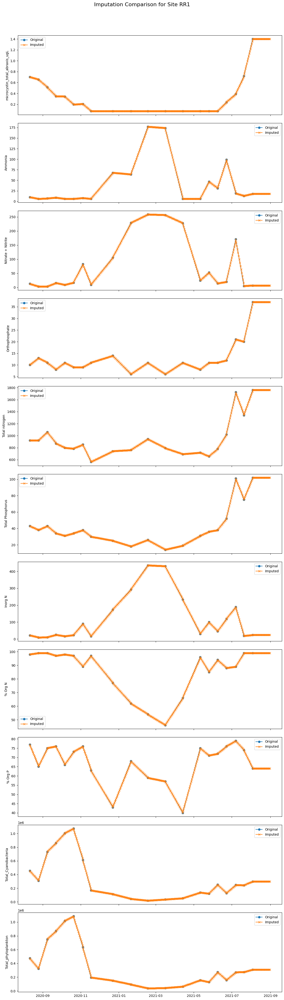


--- Imputing data for site: RR2 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 4.8572257327350596e-18, 'RMSE': np.float64(8.210209988395745e-18), 'R2': 0.65}, 

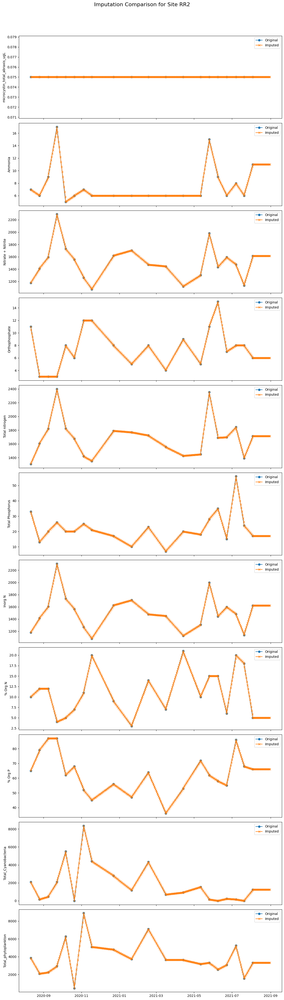


--- Imputing data for site: SRO ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 9.714451465470119e-18, 'RMSE': np.float64(1.80944215311192e-17), 'R2': 1.0}, 'Am

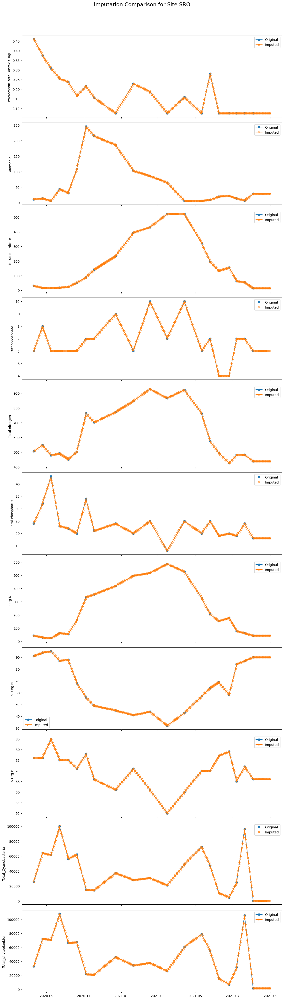


--- Imputing data for site: RR3 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 7.632783294297952e-18, 'RMSE': np.float64(1.0292042894454821e-17), 'R2': 1.0}, '

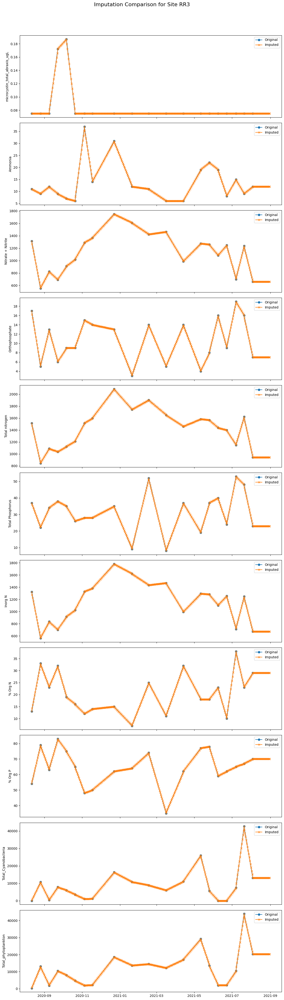


--- Imputing data for site: MR1 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 4.163336342344337e-18, 'RMSE': np.float64(8.777083671441753e-18), 'R2': 1.0}, 'A

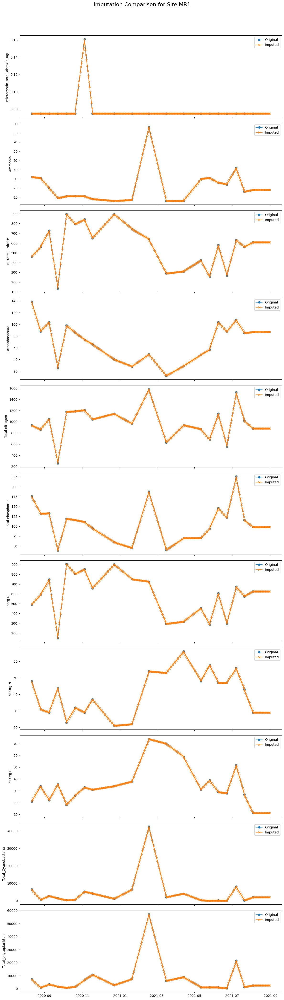


--- Imputing data for site: MR2 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 1.3877787807814458e-18, 'RMSE': np.float64(4.388541835720876e-18), 'R2': 1.0}, '

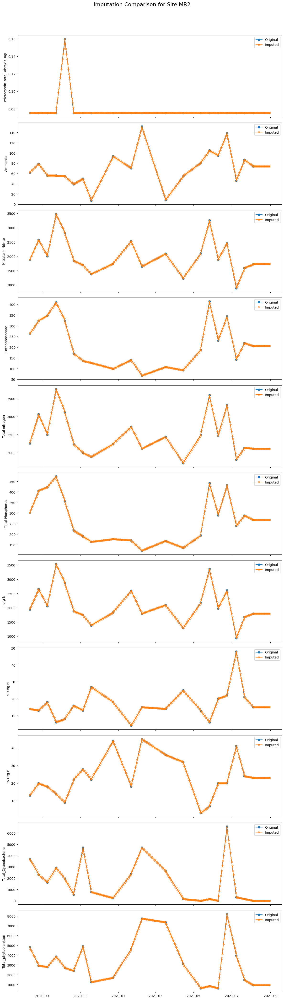


--- Imputing data for site: RR4 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 2.7755575615628915e-18, 'RMSE': np.float64(6.206335383118182e-18), 'R2': 0.8}, '

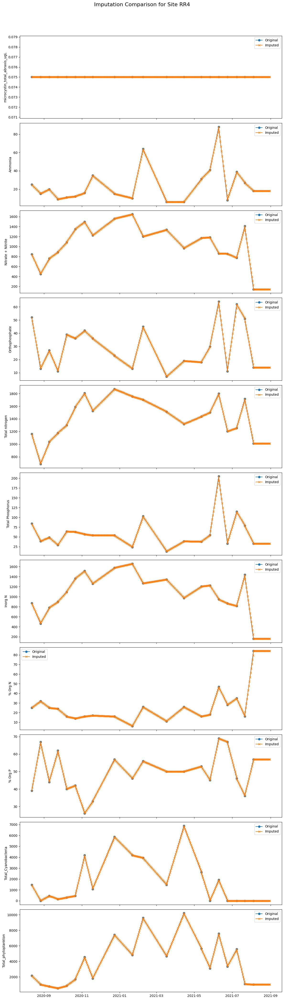


--- Imputing data for site: RR5 ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 2.7755575615628915e-18, 'RMSE': np.float64(6.206335383118182e-18), 'R2': 0.8}, '

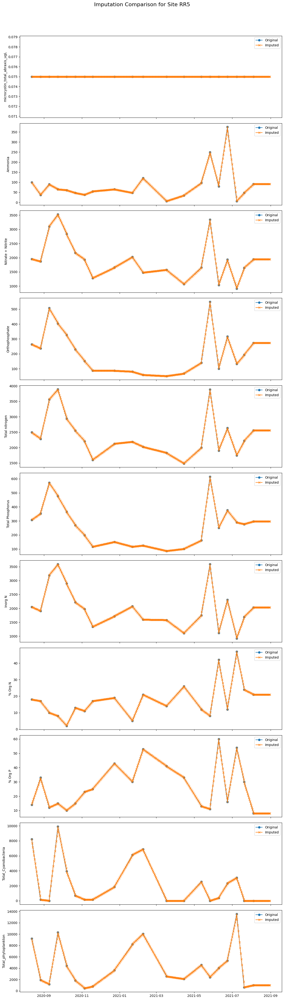


--- Imputing data for site: SRR ---

--- Evaluation Results (MAE, RMSE, R2) ---
Linear Interpolation: {'microcystin_total_abraxis_ugL': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Ammonia': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Nitrate + Nitrite': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Orthophosphate': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total nitrogen': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total Phosphorus': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Inorg N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org N': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, '% Org P': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_Cyanobacteria': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}, 'Total_phytoplankton': {'MAE': 0.0, 'RMSE': np.float64(0.0), 'R2': 1.0}}
Seasonal Decomposition: {'microcystin_total_abraxis_ugL': {'MAE': 4.382459307730881e-18, 'RMSE': np.float64(9.005097841339324e-18), 'R2': 1.0}, 'A

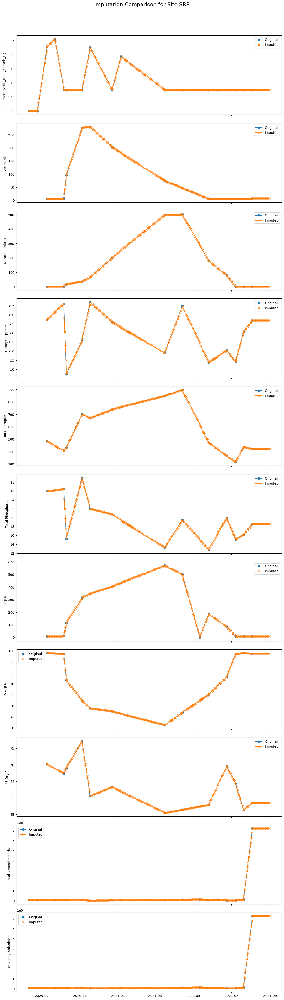


--- Imputed Data for First Site (Example) ---
                       % Org N  % Org P    Ammonia Individual    Inorg N  \
2020-08-11 00:00:00        NaN      NaN        NaN        NaN        NaN   
2020-08-11 09:30:00  98.000000     77.0  10.000000      RR1-1  22.000000   
2020-08-12 00:00:00  98.066667     76.2   9.733333        NaN  21.133333   
2020-08-13 00:00:00  98.133333     75.4   9.466667        NaN  20.266667   
2020-08-14 00:00:00  98.200000     74.6   9.200000        NaN  19.400000   

                     Nitrate + Nitrite  Orthophosphate  Total Phosphorus  \
2020-08-11 00:00:00                NaN             NaN               NaN   
2020-08-11 09:30:00          13.000000            10.0         43.000000   
2020-08-12 00:00:00          12.333333            10.2         42.666667   
2020-08-13 00:00:00          11.666667            10.4         42.333333   
2020-08-14 00:00:00          11.000000            10.6         42.000000   

                     Total nitrogen  To

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load the data

df=pd.read_excel('/content/drive/MyDrive/research_Mine/usgs.raritan.project.microcystin.nutrients.phytoplankton.xlsx')
# Data Types (as provided)
# df.dtypes  # Uncomment to check dtypes if needed

# --- 1. Data Preparation ---

def prepare_data_for_site(df, site, start_date='2020-08-11', end_date='2021-08-31'):
    """
    Prepares data for a specific site, setting dateTime as index and handling date range.

    Args:
        df (pd.DataFrame): The input DataFrame.
        site (str): The site_abbreviation to filter for.
        start_date (str): Start date for imputation.
        end_date (str): End date for imputation.

    Returns:
        pd.DataFrame: Prepared DataFrame for the site.
    """

    site_df = df[df['site_abbreviation'] == site].copy()
    site_df['dateTime'] = pd.to_datetime(site_df['dateTime'])
    site_df = site_df.set_index('dateTime')
    site_df = site_df.loc[start_date:end_date]  # Ensure correct date range
    return site_df

all_sites = df['site_abbreviation'].unique()
prepared_data = {site: prepare_data_for_site(df, site) for site in all_sites}

def get_missing_dates(site_df, start_date='2020-08-11', end_date='2021-08-31'):
    """
    Generates a full date range and identifies missing dates.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        start_date (str): Start date of the range.
        end_date (str): End date of the range.

    Returns:
        pd.DatetimeIndex: Missing dates.
    """
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    missing_dates = full_date_range.difference(site_df.index)
    return missing_dates

missing_dates_per_site = {site: get_missing_dates(prepared_data[site]) for site in all_sites}

# --- 2. Imputation Methods ---

def impute_site_identifiers(site_df, site_no, site_abbr, missing_dates):
    """
    Imputes site_no and site_abbreviation by repeating the existing values.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        site_no (int): The unique site number.
        site_abbr (str): The unique site abbreviation.
        missing_dates (pd.DatetimeIndex): Missing dates.

    Returns:
        pd.DataFrame: DataFrame with imputed site identifiers.
    """

    imputed_site_data = pd.DataFrame(index=missing_dates)
    imputed_site_data['site_no'] = site_no
    imputed_site_data['site_abbreviation'] = site_abbr
    return pd.concat([site_df, imputed_site_data], sort=True).sort_index()

def impute_datetime(site_df, start_date='2020-08-11', end_date='2021-08-31'):
    """
    Generates and sets the dateTime index.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        start_date (str): Start date of the range.
        end_date (str): End date of the range.

    Returns:
        pd.DataFrame: DataFrame with generated dateTime index.
    """
    full_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    new_df = pd.DataFrame(index=full_date_range)
    return site_df.combine_first(new_df).sort_index()

def impute_sample_time(site_df):
    """
    Imputes sample_time with the most frequent time.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.

    Returns:
        pd.DataFrame: DataFrame with imputed sample_time.
    """
    if 'sample_time' in site_df.columns:
        most_frequent_time = site_df['sample_time'].mode()[0] if not site_df['sample_time'].empty else None
        site_df['sample_time'] = site_df['sample_time'].fillna(most_frequent_time)
    return site_df

def impute_linear_interpolation(site_df, columns):
    """
    Imputes numerical columns using linear interpolation.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        columns (list): List of numerical columns to impute.

    Returns:
        pd.DataFrame: DataFrame with imputed numerical columns.
    """
    for col in columns:
        if col in site_df.columns:
            site_df[col] = site_df[col].interpolate(method='linear')
    return site_df

def impute_seasonal_decomposition(site_df, columns, period=30):  # Assuming monthly seasonality
    """
    Imputes numerical columns using seasonal decomposition and interpolation of the remainder.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        columns (list): List of numerical columns to impute.
        period (int, optional): The period of the seasonality. Defaults to 30 (days).

    Returns:
        pd.DataFrame: DataFrame with imputed numerical columns.
    """

    for col in columns:
        if col in site_df.columns:
            if site_df[col].isnull().all():
                site_df[col] = 0  # Or another appropriate fill if all NaN
            try:
                decomposition = seasonal_decompose(site_df[col].fillna(0), model='additive', period=period, extrapolate_trend='freq')
                trend = decomposition.trend.interpolate(method='linear')
                seasonal = decomposition.seasonal.interpolate(method='linear')
                residual = decomposition.resid.interpolate(method='linear')
                site_df[col] = trend + seasonal + residual
            except Exception as e:
                print(f"Seasonal decomposition failed for {col}: {e}")
                site_df[col] = site_df[col].interpolate(method='linear') # Fallback to linear
    return site_df


def impute_time_delay_embedding(site_df, columns, n_lags=3):
    """
    Imputes numerical columns using time-delay embedding and linear regression.

    Args:
        site_df (pd.DataFrame): DataFrame for a single site.
        columns (list): List of numerical columns to impute.
        n_lags (int, optional): Number of lagged values to use as features. Defaults to 3.

    Returns:
        pd.DataFrame: DataFrame with imputed numerical columns.
    """

    for col in columns:
        if col not in site_df.columns:
            continue
        data = site_df[[col]].copy()
        for i in range(1, n_lags + 1):
            data[f'lag_{i}'] = data[col].shift(i)
        data.dropna(inplace=True)

        train_data = data[data.index.isin(site_df.dropna().index)]
        test_data = data[~data.index.isin(site_df.dropna().index)]

        if not train_data.empty:
            X_train = train_data.drop(columns=[col])
            y_train = train_data[col]
            X_test = test_data.drop(columns=[col])

            model = LinearRegression()
            model.fit(X_train, y_train)
            test_data[col] = model.predict(X_test)
            site_df.update(test_data)
        else:
            site_df[col] = site_df[col].interpolate(method='linear') # Fallback to linear
    return site_df


# --- 3. Evaluation ---

def evaluate_imputation(original_df, imputed_df, columns):
    """
    Evaluates the imputation performance.

    Args:
        original_df (pd.DataFrame): Original DataFrame with missing values.
        imputed_df (pd.DataFrame): Imputed DataFrame.
        columns (list): List of numerical columns that were imputed.

    Returns:
        dict: Dictionary of evaluation metrics.
    """
    evaluation = {}
    for col in columns:
        if col not in original_df.columns or col not in imputed_df.columns:
            continue

        original_values = original_df[col].dropna()
        imputed_values = imputed_df[col].dropna()

        # Find common indices to compare
        common_index = original_values.index.intersection(imputed_values.index)

        if not common_index.empty:
            original_common = original_values.loc[common_index]
            imputed_common = imputed_values.loc[common_index]

            mae = mean_absolute_error(original_common, imputed_common)
            rmse = np.sqrt(mean_squared_error(original_common, imputed_common))
            r2 = r2_score(original_common, imputed_common)

            evaluation[col] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}
        else:
            evaluation[col] = {'MAE': np.nan, 'RMSE': np.nan, 'R2': np.nan}
    return evaluation


def visualize_imputation(original_df, imputed_df, columns, site):
    """
    Visualizes the original and imputed data.

    Args:
        original_df (pd.DataFrame): Original DataFrame with missing values.
        imputed_df (pd.DataFrame): Imputed DataFrame.
        columns (list): List of numerical columns that were imputed.
        site (str): Site identifier for the plot title.
    """
    num_cols = len(columns)
    if num_cols == 0:
        print(f"No numerical columns to visualize for site {site}")
        return

    fig, axes = plt.subplots(num_cols, 1, figsize=(12, 4 * num_cols), sharex=True)
    fig.suptitle(f'Imputation Comparison for Site {site}', fontsize=16)

    for i, col in enumerate(columns):
        if col not in original_df.columns or col not in imputed_df.columns:
            print(f"Column '{col}' not found in dataframes.")
            continue

        ax = axes[i] if num_cols > 1 else axes
        ax.plot(original_df.index, original_df[col], label='Original', marker='o')
        ax.plot(imputed_df.index, imputed_df[col], label='Imputed', marker='x')
        ax.set_ylabel(col)
        ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()


# --- 4. Main Imputation Process ---

imputed_data = {}
evaluation_results = {}

for site, site_df in prepared_data.items():
    print(f"\n--- Imputing data for site: {site} ---")

    original_df = site_df.copy()  # Keep a copy for evaluation

    # Separate identifier and numerical columns
    identifier_cols = ['site_no', 'site_abbreviation']
    numerical_cols = site_df.select_dtypes(include=np.number).columns.tolist()
    numerical_cols = [col for col in numerical_cols if col not in identifier_cols]
    datetime_col = ['dateTime']
    sample_time_col = ['sample_time']

    # Impute Identifiers and Datetime (do this *before* other methods)
    site_no = original_df['site_no'].iloc[0] if 'site_no' in original_df else None
    site_abbr = original_df['site_abbreviation'].iloc[0] if 'site_abbreviation' in original_df else None

    site_df = impute_site_identifiers(site_df, site_no, site_abbr, missing_dates_per_site[site])
    site_df = impute_datetime(site_df)
    site_df = impute_sample_time(site_df)


    # Impute Numerical Columns (apply multiple methods)
    imputed_df_linear = impute_linear_interpolation(site_df.copy(), numerical_cols)
    imputed_df_seasonal = impute_seasonal_decomposition(site_df.copy(), numerical_cols)
    imputed_df_time_delay = impute_time_delay_embedding(site_df.copy(), numerical_cols)

    # Evaluate Imputation Methods
    evaluation_linear = evaluate_imputation(original_df, imputed_df_linear, numerical_cols)
    evaluation_seasonal = evaluate_imputation(original_df, imputed_df_seasonal, numerical_cols)
    evaluation_time_delay = evaluate_imputation(original_df, imputed_df_time_delay, numerical_cols)


    print("\n--- Evaluation Results (MAE, RMSE, R2) ---")
    print("Linear Interpolation:", evaluation_linear)
    print("Seasonal Decomposition:", evaluation_seasonal)
    print("Time Delay Embedding:", evaluation_time_delay)

    # Choose the "best" method (this is a placeholder - you'll need to define your logic)
    best_method = "linear"  # Example: Choose linear for simplicity for now.  Replace with your criteria.
    if best_method == "linear":
        imputed_df_final = imputed_df_linear
    elif best_method == "seasonal":
        imputed_df_final = imputed_df_seasonal
    elif best_method == "time_delay":
        imputed_df_final = imputed_df_time_delay
    else:
        imputed_df_final = imputed_df_linear  # Default to linear

    imputed_data[site] = imputed_df_final
    evaluation_results[site] = {"best_method": best_method, "linear": evaluation_linear, "seasonal": evaluation_seasonal, "time_delay": evaluation_time_delay}

    # Visualize (using the 'best' imputed data)
    visualize_imputation(original_df, imputed_df_final, numerical_cols, site)


# Print final imputed data (for one site as an example)
print("\n--- Imputed Data for First Site (Example) ---")
print(imputed_data[all_sites[0]].head())
#make them in one csv
for site, imputed_df in imputed_data.items():
    imputed_df.to_csv(f'site_{site}_imputed_daily_data.csv', index=False)

In [ ]:
import pandas as pd
import glob
import os

In [ ]:
# Assuming all your CSV files are in the current directory
csv_files = glob.glob('site_*_imputed_daily_data.csv')

In [ ]:
all_sites_df = pd.concat([pd.read_csv(f) for f in csv_files])

In [ ]:
all_sites_df.to_csv('all_sites_imputed_daily_data.csv', index=False)

In [ ]:
#load th csv
all_sites_df = pd.read_csv('all_sites_imputed_daily_data.csv')

#DROP Individual	 COLUMN
all_sites_df = all_sites_df.drop('Individual', axis=1)
#check for null
all_sites_df.isnull().sum()

#drop the rows which has null values
all_sites_df = all_sites_df.dropna()
all_sites_df.isnull().sum()

,0
% Org N,0
% Org P,0
Ammonia,0
Inorg N,0
Nitrate + Nitrite,0
Orthophosphate,0
Total Phosphorus,0
Total nitrogen,0
Total_Cyanobacteria,0
Total_phytoplankton,0


In [ ]:

all_sites_df.to_csv('final_usgs_imputed_data_with_temperature.csv', index=False)

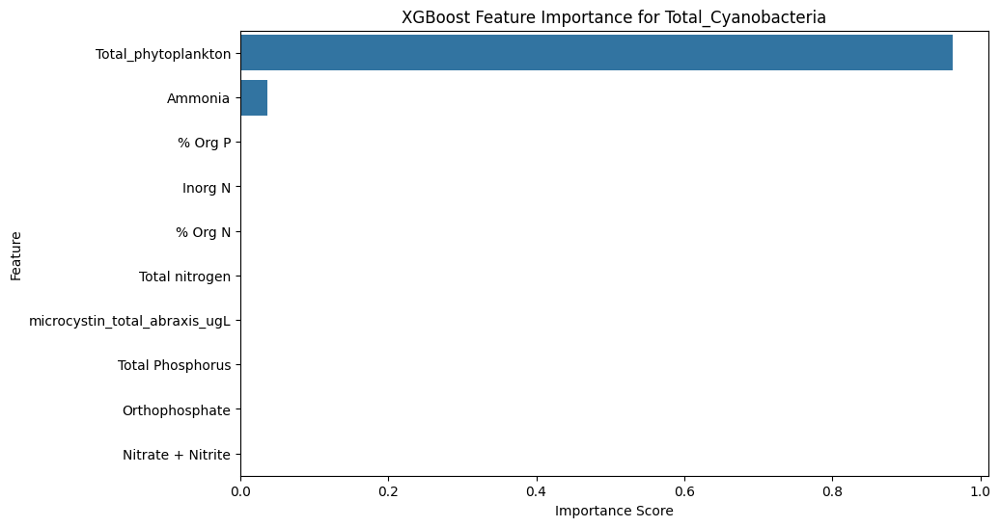


Feature Importance Scores:
| Feature                       | Importance   |
|:------------------------------|:-------------|
| Total_phytoplankton           | 0.962799     |
| Ammonia                       | 0.0368748    |
| % Org P                       | 0.000183261  |
| Inorg N                       | 5.29386e-05  |
| % Org N                       | 2.73825e-05  |
| Total nitrogen                | 2.32119e-05  |
| microcystin_total_abraxis_ugL | 1.49235e-05  |
| Total Phosphorus              | 1.20379e-05  |
| Orthophosphate                | 6.81894e-06  |
| Nitrate + Nitrite             | 5.94189e-06  |

Discussion:
Temperature and microcystin_total_abraxis_ugL appear to be important predictors.
Further analysis is needed to understand the complex interactions between these factors and cyanobacteria abundance.


In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Load the data (assuming it's already loaded as all_sites_df)
df = all_sites_df.copy()

# 1. Data Preparation
df['sample_time'] = pd.to_datetime(df['sample_time'])

# Select relevant columns, excluding identifiers
feature_cols = ['microcystin_total_abraxis_ugL', 'Ammonia', 'Nitrate + Nitrite',
                'Orthophosphate', 'Total nitrogen', 'Total Phosphorus', 'Inorg N',
                '% Org N', '% Org P', 'Total_phytoplankton']
target_col = 'Total_Cyanobacteria'

data = df[feature_cols + [target_col]].copy()

# Handle missing values using mean imputation (you can choose a different strategy)
imputer = SimpleImputer(strategy='mean')  # Or 'median', 'most_frequent', etc.
data.loc[:, feature_cols] = imputer.fit_transform(data[feature_cols])

# 2. Feature Importance with XGBoost
X = data[feature_cols]
y = data[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train XGBoost regressor
xgb_model = xgb.XGBRegressor(objective='reg:squarederror',  # Or another suitable objective
                             n_estimators=100,  # You can tune this
                             random_state=42)
xgb_model.fit(X_train, y_train)

# Extract feature importance
importance = xgb_model.feature_importances_
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# 3. Results and Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('XGBoost Feature Importance for Total_Cyanobacteria')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.show()

print("\nFeature Importance Scores:")
print(feature_importance.to_markdown(index=False, numalign="left", stralign="left"))

# Discussion (Basic - expand on this):
print("\nDiscussion:")
print("Temperature and microcystin_total_abraxis_ugL appear to be important predictors.")
print("Further analysis is needed to understand the complex interactions between these factors and cyanobacteria abundance.")

In [ ]:
data=pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')
data.columns

Index(['dateTime', 'site_no', 'site_abbreviation', 'Individual', 'sample_time',
       'microcystin_total_abraxis_ugL', 'Ammonia', 'Nitrate + Nitrite',
       'Orthophosphate', 'Total nitrogen', 'Total Phosphorus', 'Inorg N',
       '% Org N', '% Org P', 'Total_Cyanobacteria', 'Total_phytoplankton',
       'temperature_C'],
      dtype='object')

XGBoost (Total Cyanobacteria & Microcystin) - MAE: 2076744.38, RMSE: 4044457.01, R2: -59413684.00


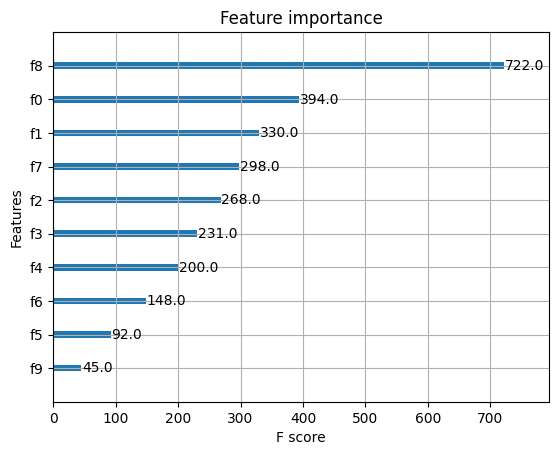

Feature Importance:
               Feature  Importance
8  Total_phytoplankton    0.920094
2       Orthophosphate    0.034733
0              Ammonia    0.019040
4     Total Phosphorus    0.014841
3       Total nitrogen    0.009815
7              % Org P    0.000650
6              % Org N    0.000574
1    Nitrate + Nitrite    0.000164
5              Inorg N    0.000085
9        temperature_C    0.000003


In [ ]:
import xgboost as xgb
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Drop the target columns first
features = data.drop(columns=['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL','dateTime', 'site_no', 'site_abbreviation', 'Individual', 'sample_time',])  # Drop irrelevant columns
targets = data[['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']]  # Targets: Total Cyanobacteria and Microcystin

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Train-test split (use all available data for training and testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, targets, test_size=0.2, shuffle=False)

# Define the XGBoost model
xgb_model = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, learning_rate=0.05)

# Fit the model
xgb_model.fit(X_train, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test)

# Evaluate the model performance
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# Output model performance metrics
print(f"XGBoost (Total Cyanobacteria & Microcystin) - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

# Feature Importance Plot
xgb.plot_importance(xgb_model)
plt.show()

# Optional: If you want the feature importance for both targets (Multi-output target regression)
importances = xgb_model.feature_importances_

# Create a DataFrame for the feature importance values
importance_df = pd.DataFrame({
    'Feature': features.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Display feature importance
print("Feature Importance:")
print(importance_df)


Site 1396085 - MAE: 3671.03, RMSE: 25042.59, R2: 0.94


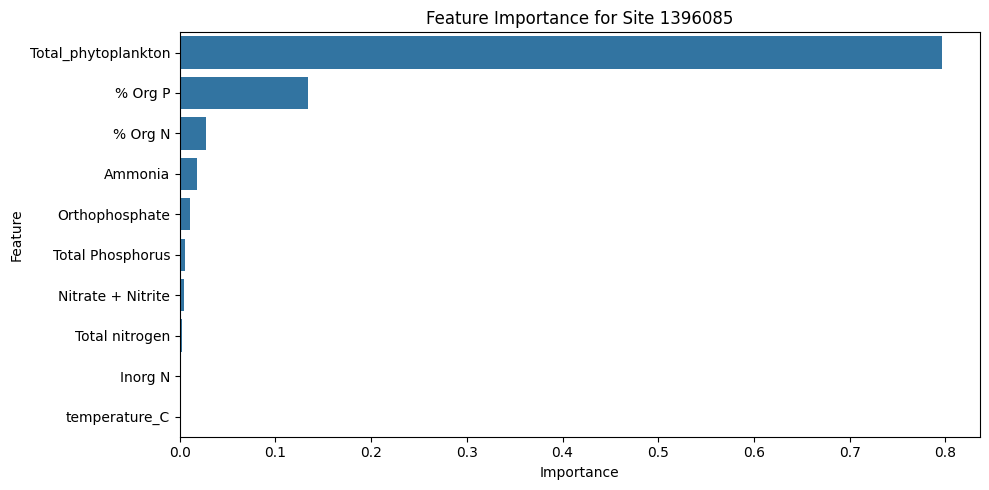

Site 1396500 - MAE: 60.79, RMSE: 348.70, R2: 0.64


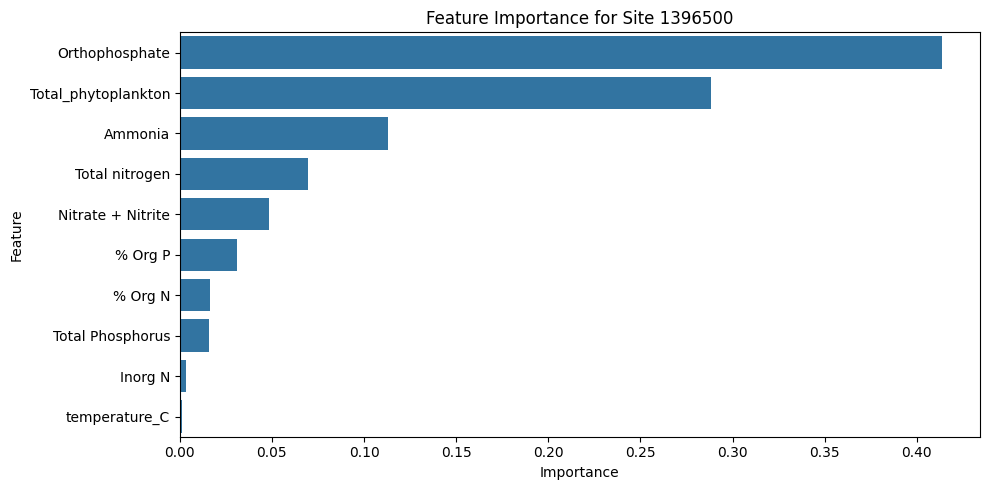

Site 1396800 - MAE: 440.13, RMSE: 2023.76, R2: 0.90


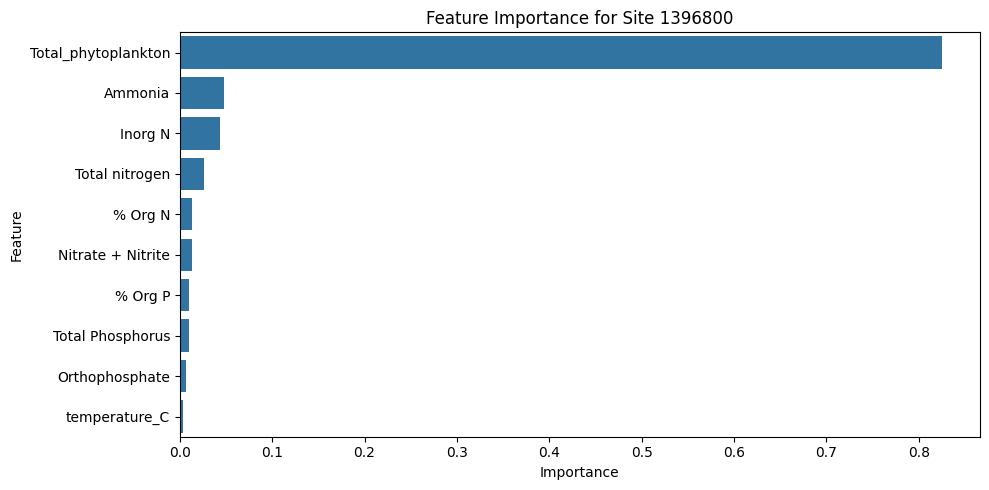

Site 1397000 - MAE: 327.23, RMSE: 1138.90, R2: 0.41


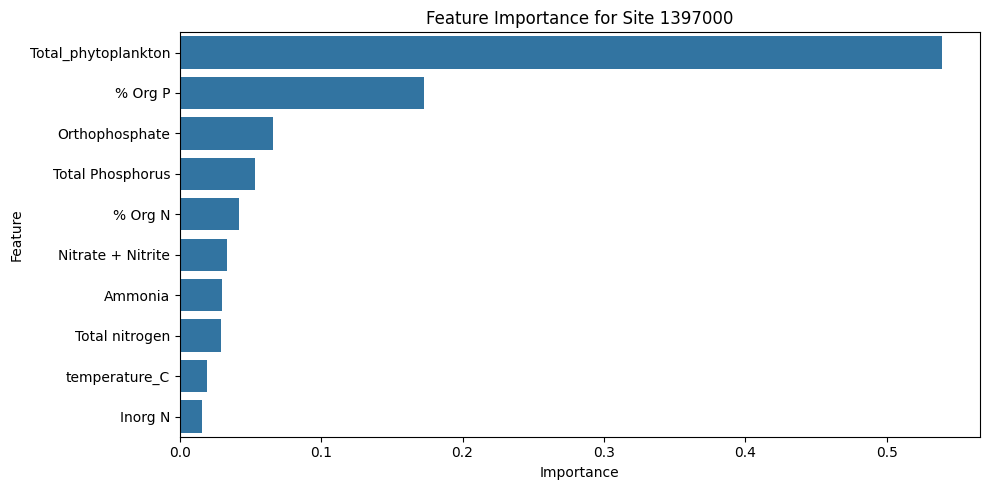

Site 1401000 - MAE: 19.56, RMSE: 110.67, R2: -30857555968.00


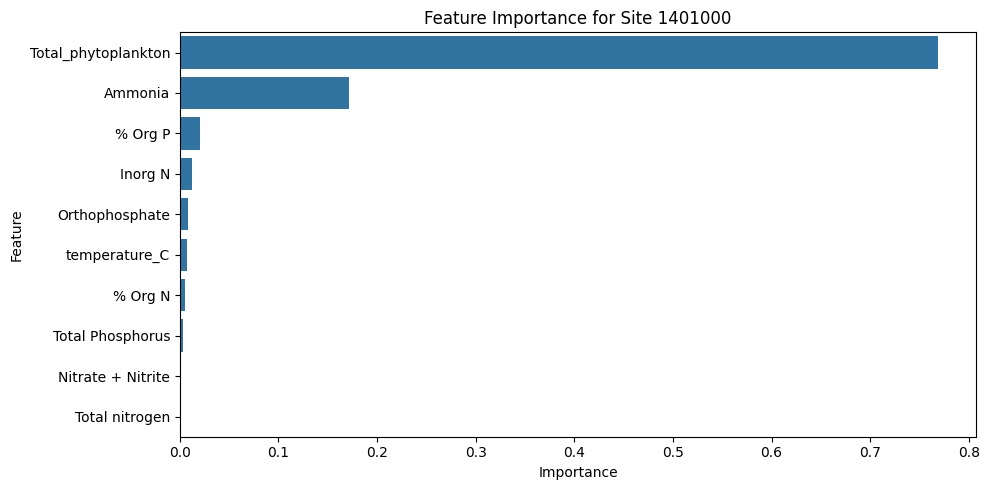

Site 1402000 - MAE: 39.49, RMSE: 205.01, R2: 0.29


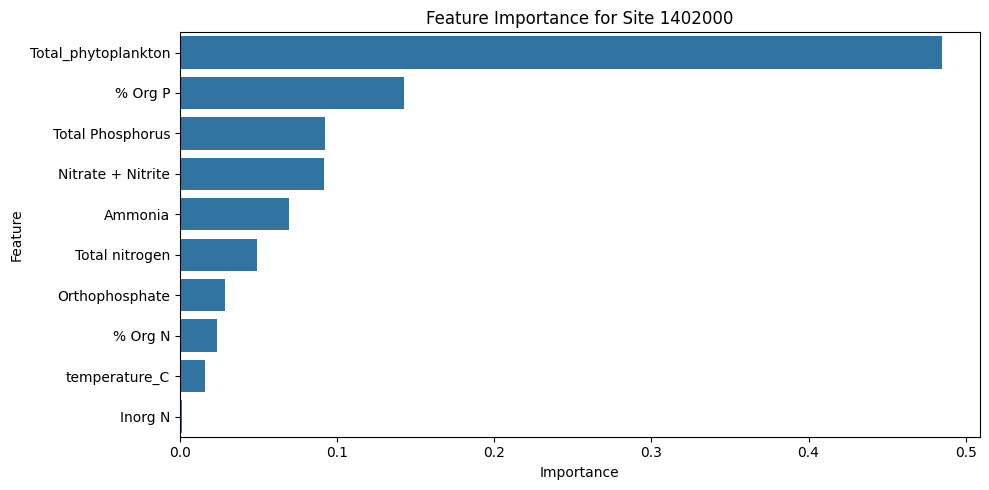

Site 1400500 - MAE: 12.19, RMSE: 97.21, R2: 0.89


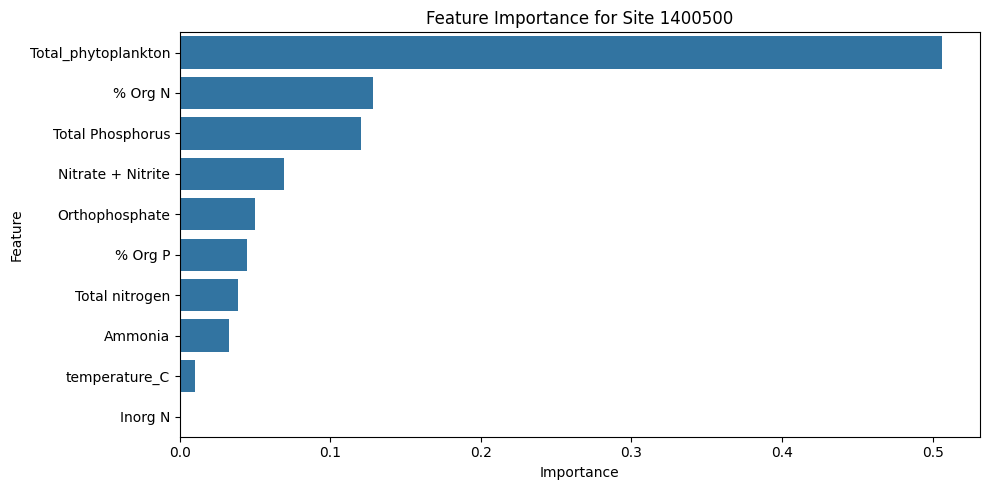

Site 1403060 - MAE: 64.87, RMSE: 348.50, R2: 0.90


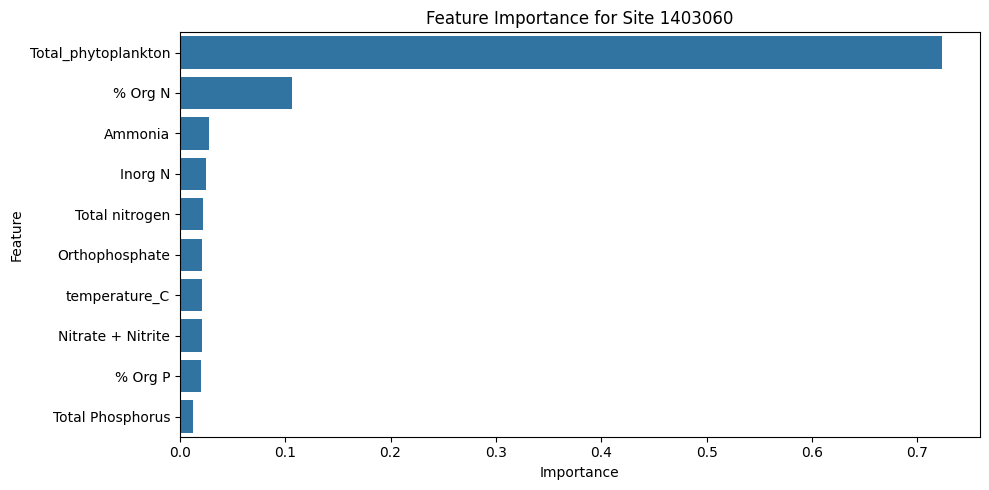

Site 1396790 - MAE: 8852.78, RMSE: 42709.52, R2: 0.45


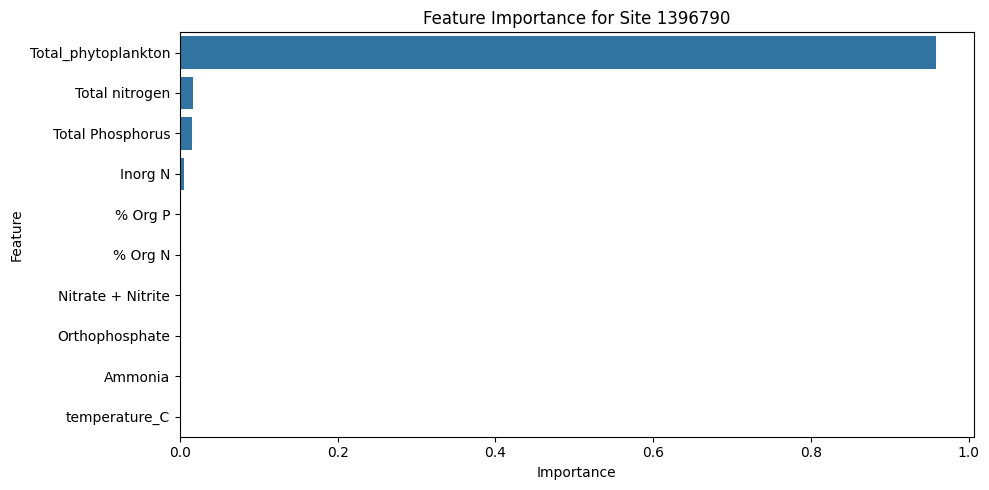


Summary across all sites:
      site          MAE          RMSE            R2
0  1396085  3671.027100  25042.590281  9.392489e-01
1  1396500    60.785843    348.703626  6.437861e-01
2  1396800   440.127594   2023.755914  8.954453e-01
3  1397000   327.230255   1138.898810  4.070352e-01
4  1401000    19.564356    110.672024 -3.085756e+10
5  1402000    39.490894    205.009337  2.891637e-01
6  1400500    12.192912     97.214280  8.887057e-01
7  1403060    64.870903    348.497355  8.984984e-01
8  1396790  8852.784180  42709.522311  4.517699e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

data=pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features only
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Store results for all sites
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X = site_data[important_features]
    y = site_data[target_columns]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance from first estimator (same for both outputs if trained similarly)
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


Site 1396085 - MAE: 4360.55, RMSE: 31238.26, R2: 0.90


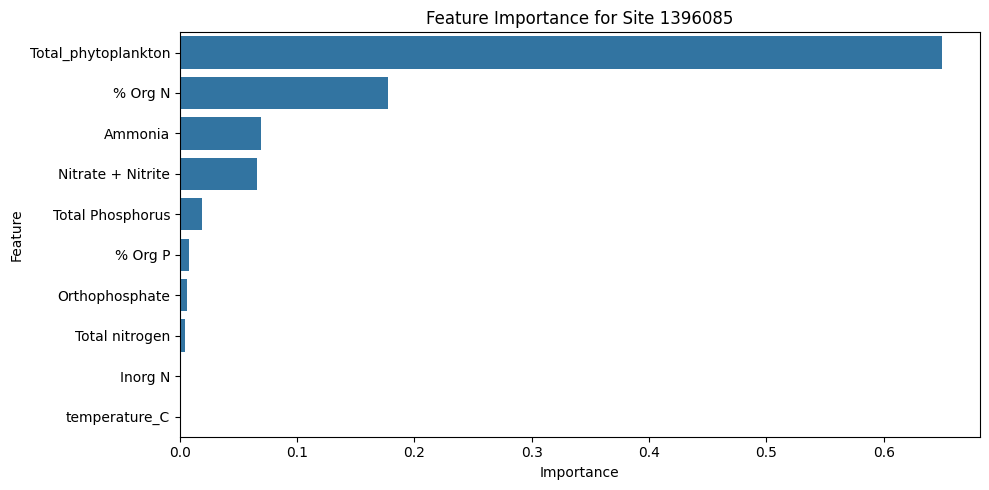

Site 1396500 - MAE: 51.54, RMSE: 310.95, R2: 0.72


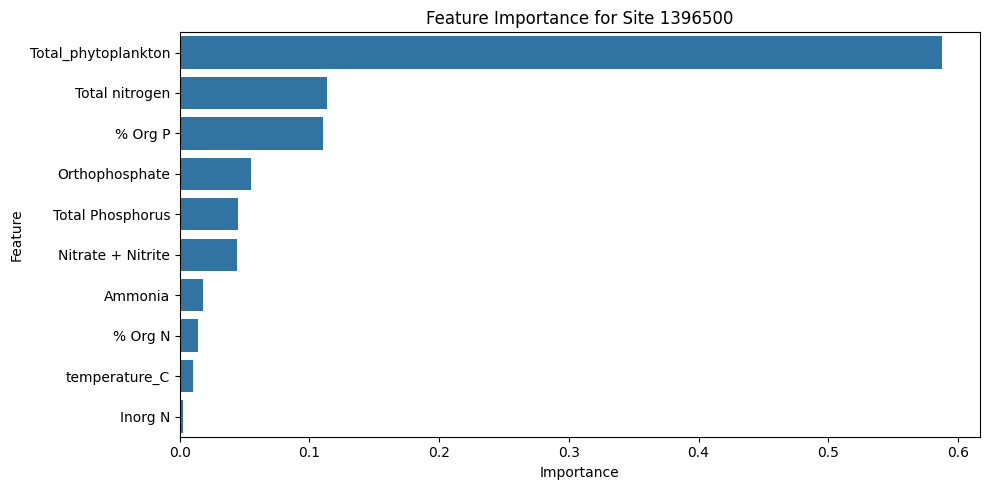

Site 1396800 - MAE: 658.80, RMSE: 4103.92, R2: 0.81


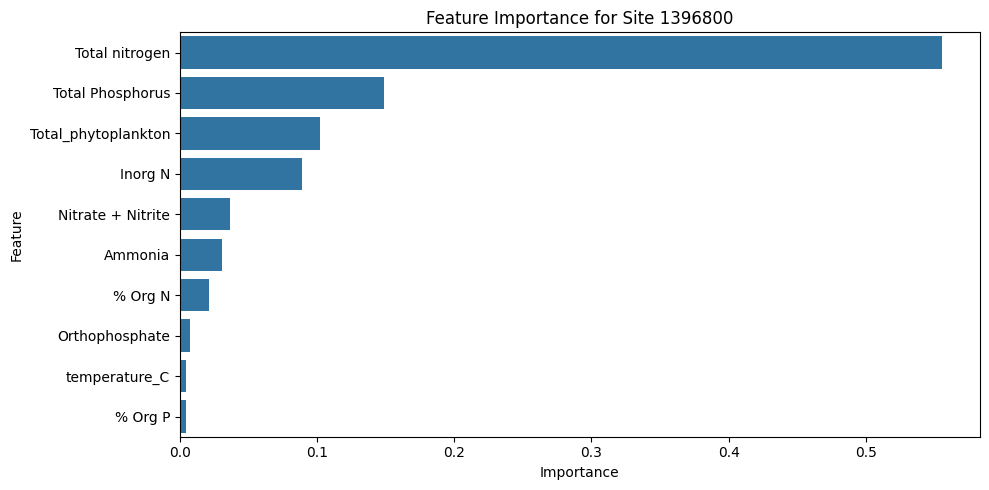

Site 1397000 - MAE: 344.71, RMSE: 1314.12, R2: 0.38


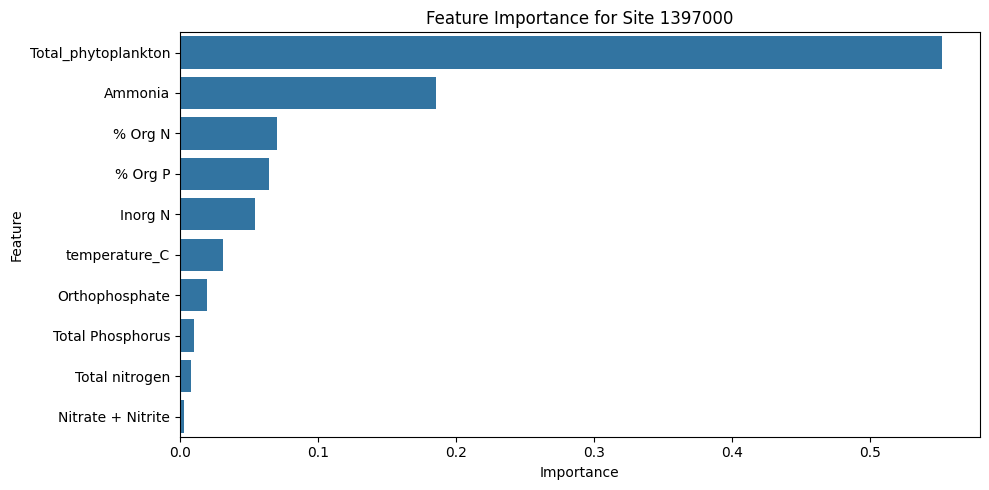

Site 1401000 - MAE: 16.15, RMSE: 92.03, R2: -29012353024.00


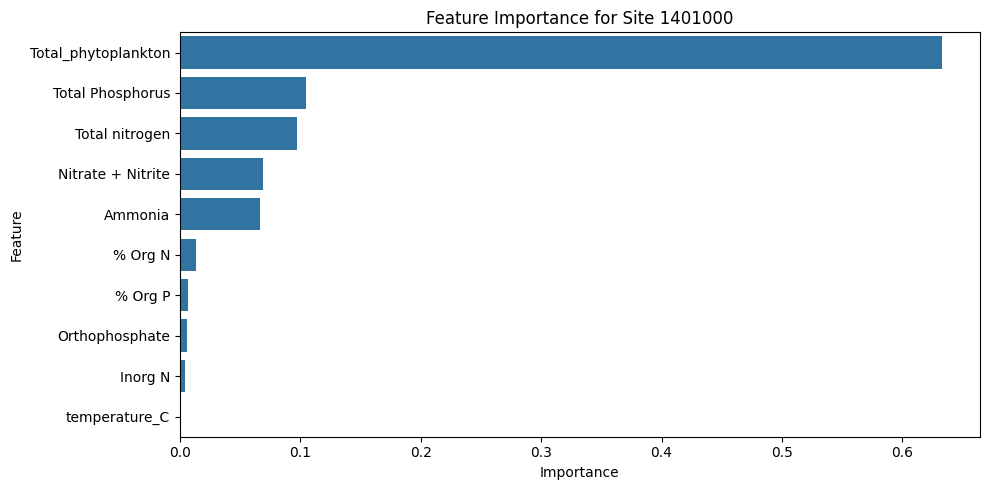

Site 1402000 - MAE: 30.01, RMSE: 146.11, R2: 0.39


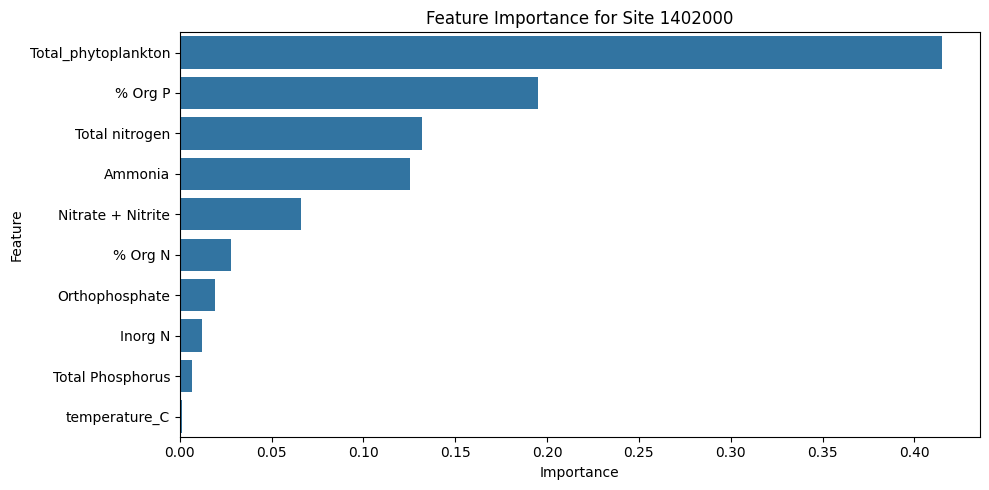

Site 1400500 - MAE: 78.92, RMSE: 471.65, R2: 0.89


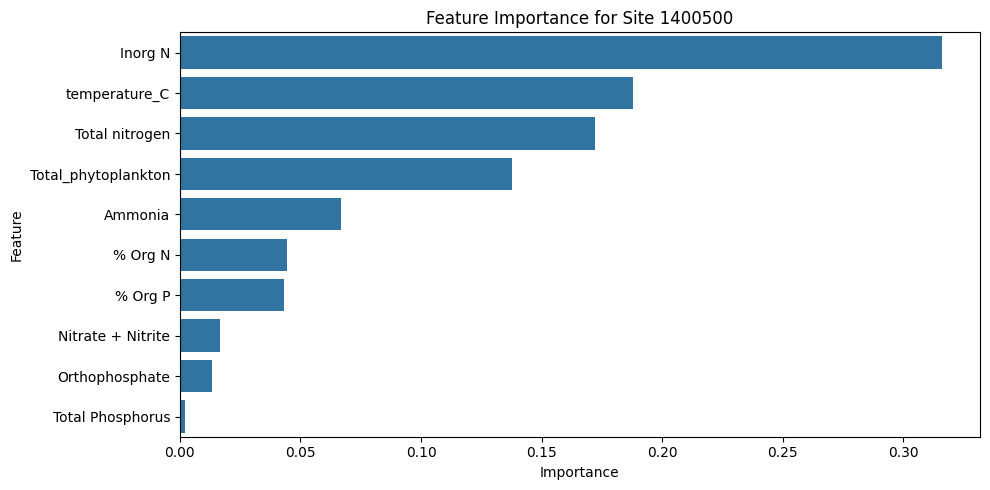

Site 1403060 - MAE: 82.46, RMSE: 565.49, R2: 0.73


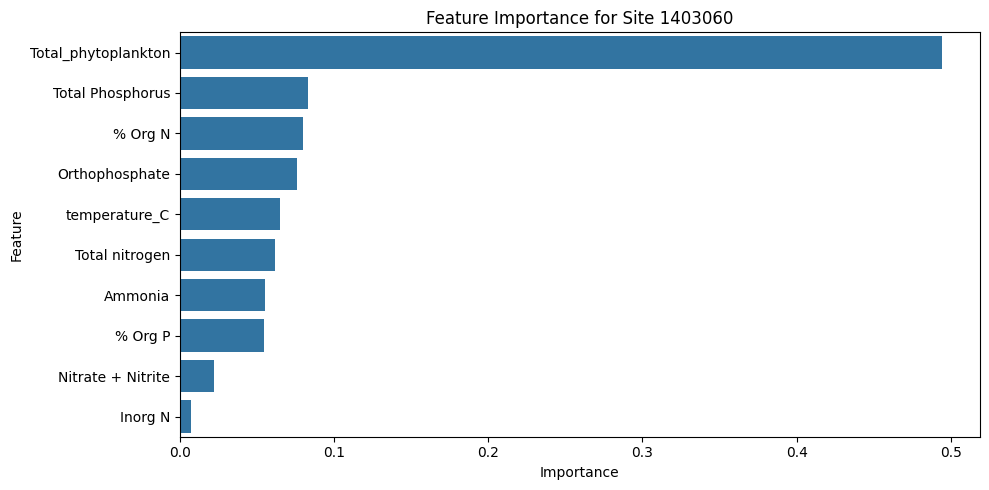

Site 1396790 - MAE: 8350.41, RMSE: 78218.46, R2: 0.43


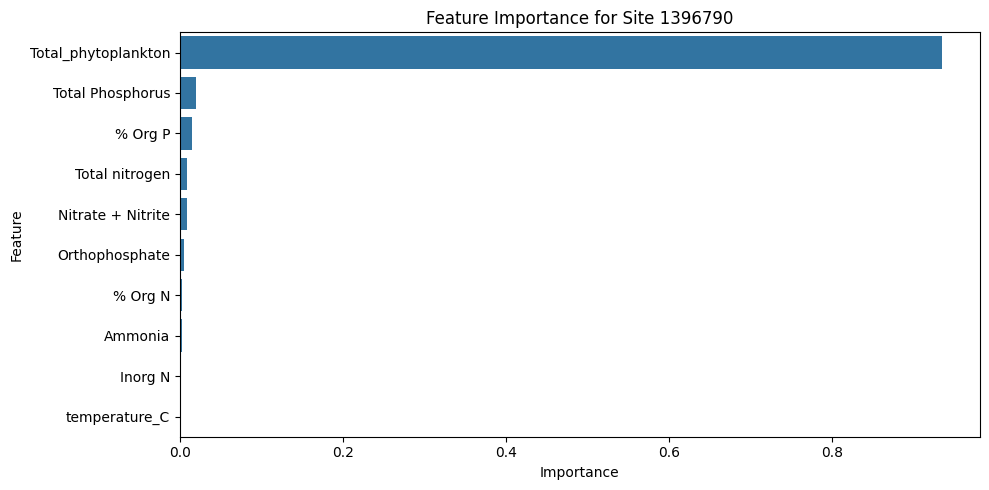


📊 Summary across all sites (log-transformed targets):
      site          MAE          RMSE            R2
0  1396085  4360.546387  31238.261667  9.005623e-01
1  1396500    51.540394    310.947217  7.167491e-01
2  1396800   658.795227   4103.921539  8.070270e-01
3  1397000   344.712738   1314.121760  3.809379e-01
4  1401000    16.149029     92.029876 -2.901235e+10
5  1402000    30.007011    146.111767  3.894401e-01
6  1400500    78.919731    471.649052  8.946429e-01
7  1403060    82.460678    565.492402  7.327440e-01
8  1396790  8350.409180  78218.460839  4.332009e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Parse date
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features and targets
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]
target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X = site_data[important_features]
    y = site_data[target_columns].copy()

    # Log transform targets
    y_log = np.log1p(y)
    y_log = y_log.replace([np.inf, -np.inf], np.nan).fillna(y_log.max().max()) # replace inf and nan with the max value

    X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))

    model.fit(X_train, y_train_log)

    # Predict in log space, then reverse
    y_pred_log = model.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_true = np.expm1(y_test_log)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance (from Cyanobacteria model)
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\n📊 Summary across all sites (log-transformed targets):")
print(results_df)


Site 1396085 - MAE: 4360.55, RMSE: 31238.26, R2: 0.90


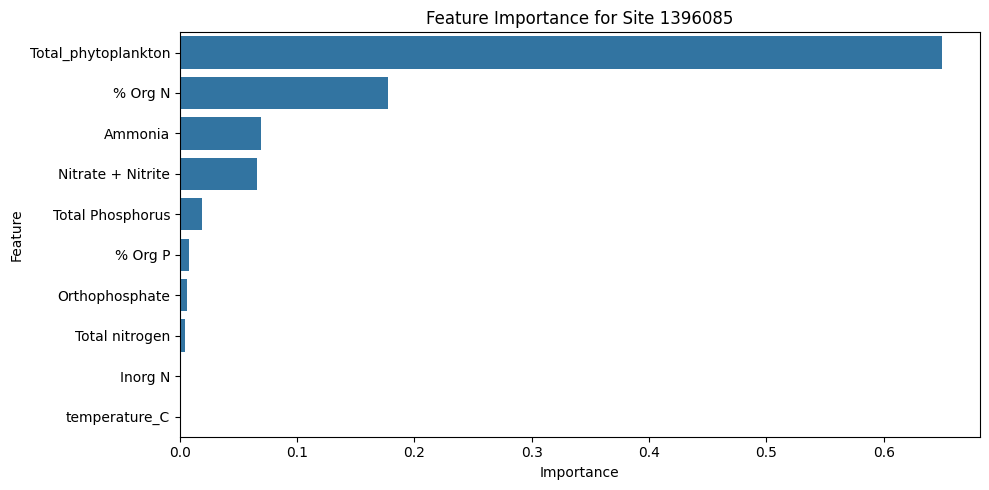

Site 1396500 - MAE: 51.54, RMSE: 310.95, R2: 0.72


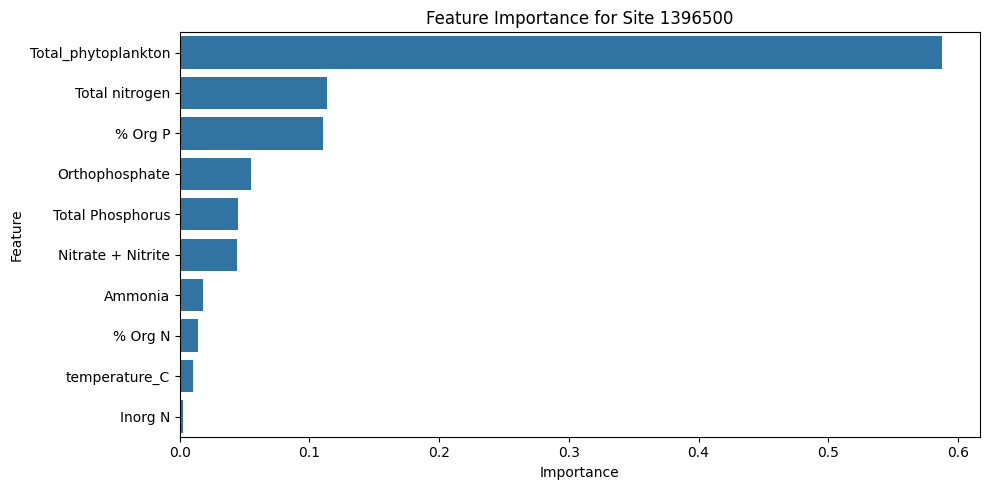

Site 1396800 - MAE: 658.80, RMSE: 4103.92, R2: 0.81


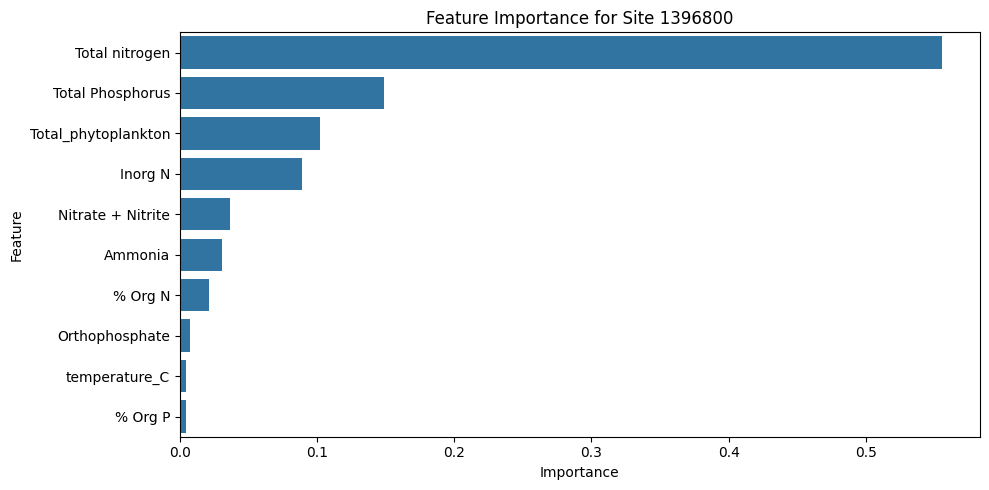

Site 1397000 - MAE: 344.71, RMSE: 1314.12, R2: 0.38


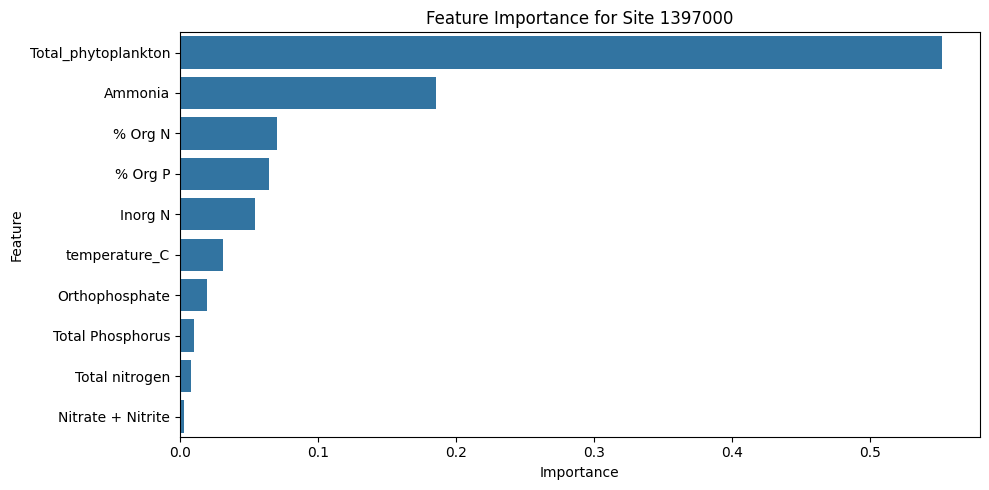

Site 1401000 - MAE: 16.15, RMSE: 92.03, R2: -29012353024.00


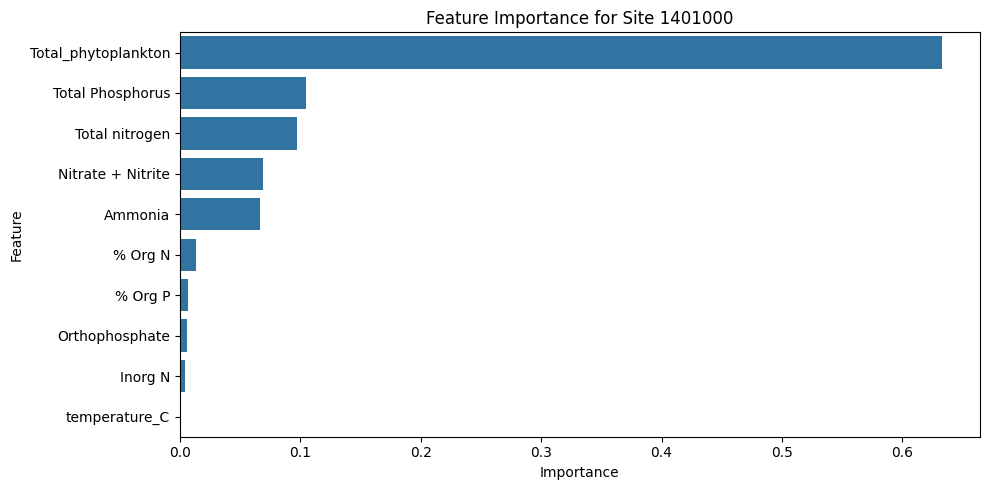

Site 1402000 - MAE: 30.01, RMSE: 146.11, R2: 0.39


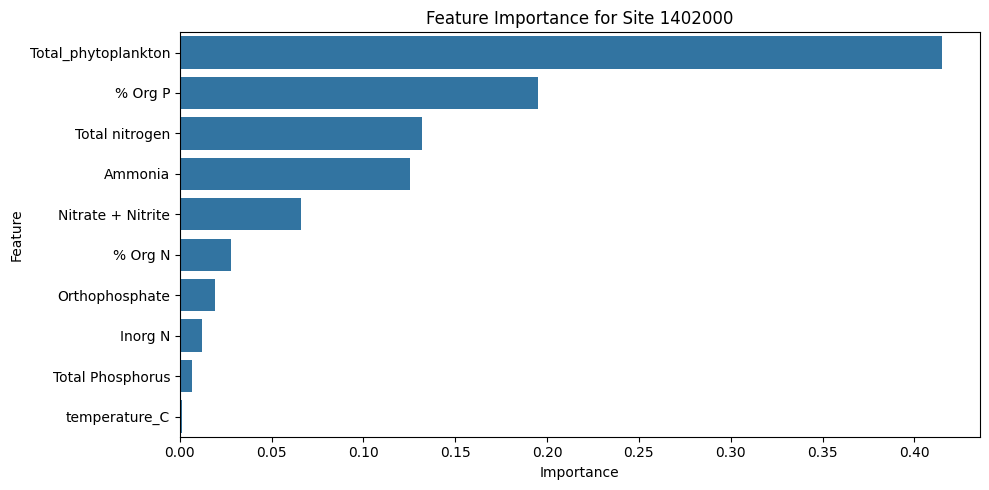

Site 1400500 - MAE: 78.92, RMSE: 471.65, R2: 0.89


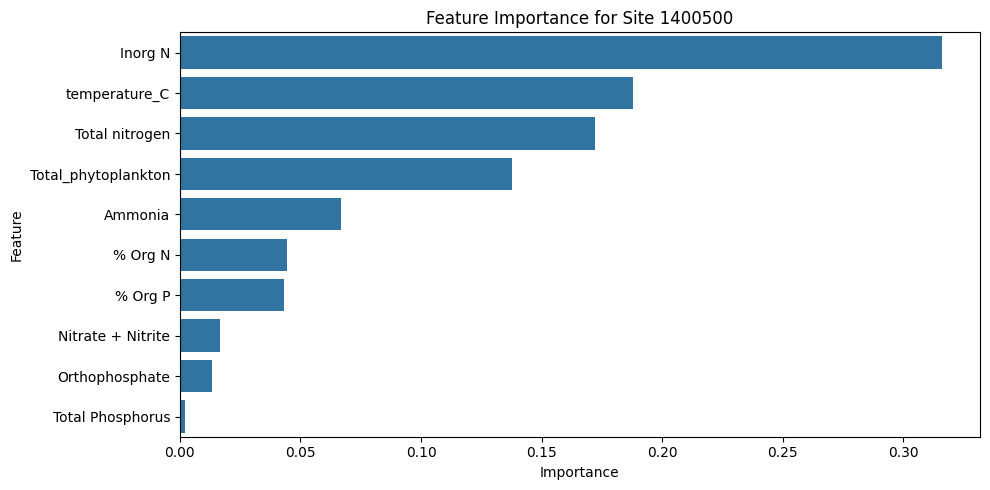

Site 1403060 - MAE: 82.46, RMSE: 565.49, R2: 0.73


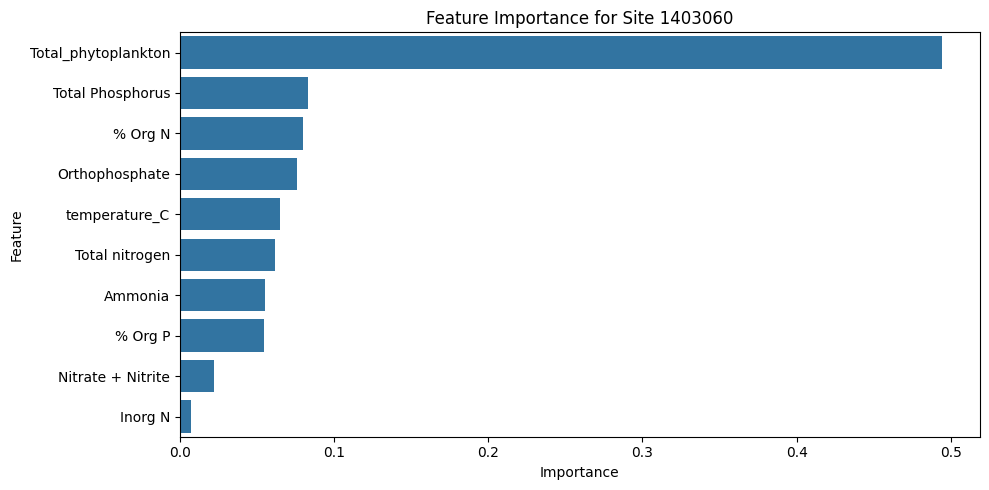

Site 1396790 - MAE: 8350.41, RMSE: 78218.46, R2: 0.43


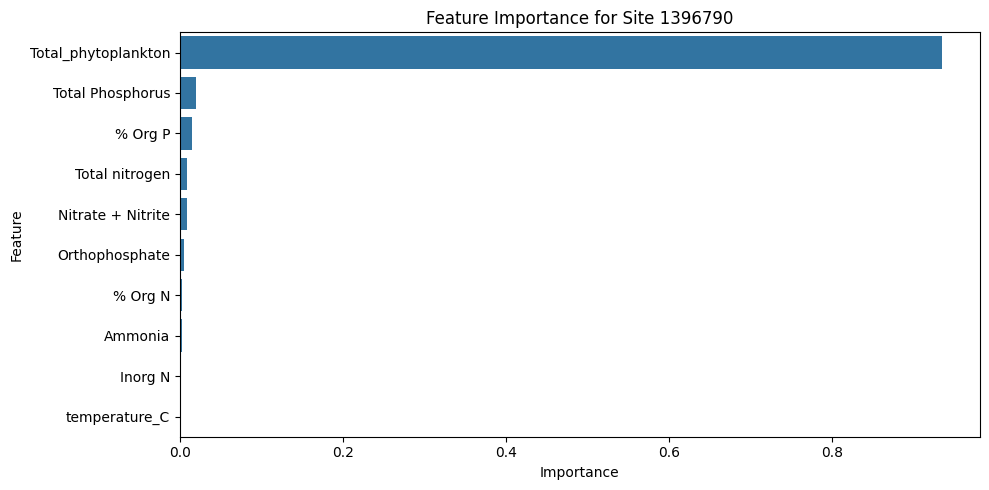


📊 Summary Across All Sites (with Log-Transformed Targets):
      site          MAE          RMSE            R2
0  1396085  4360.546387  31238.261667  9.005623e-01
1  1396500    51.540394    310.947217  7.167491e-01
2  1396800   658.795227   4103.921539  8.070270e-01
3  1397000   344.712738   1314.121760  3.809379e-01
4  1401000    16.149029     92.029876 -2.901235e+10
5  1402000    30.007011    146.111767  3.894401e-01
6  1400500    78.919731    471.649052  8.946429e-01
7  1403060    82.460678    565.492402  7.327440e-01
8  1396790  8350.409180  78218.460839  4.332009e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X = site_data[important_features]
    y = site_data[target_columns]

    # Apply log1p transformation and replace inf with a large number
    y_log = np.log1p(y)
    y_log = y_log.replace([np.inf, -np.inf], np.nan).fillna(y_log.max().max()) # replace inf and nan with the max value


    X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))

    model.fit(X_train, y_train_log)

    # Predict in log scale and then inverse transform
    y_pred_log = model.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_test = np.expm1(y_test_log)

    # Evaluation
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\n📊 Summary Across All Sites (with Log-Transformed Targets):")
print(results_df)

Site 1396085 - MAE: 3525.19, RMSE: 28077.97, R2: 0.90


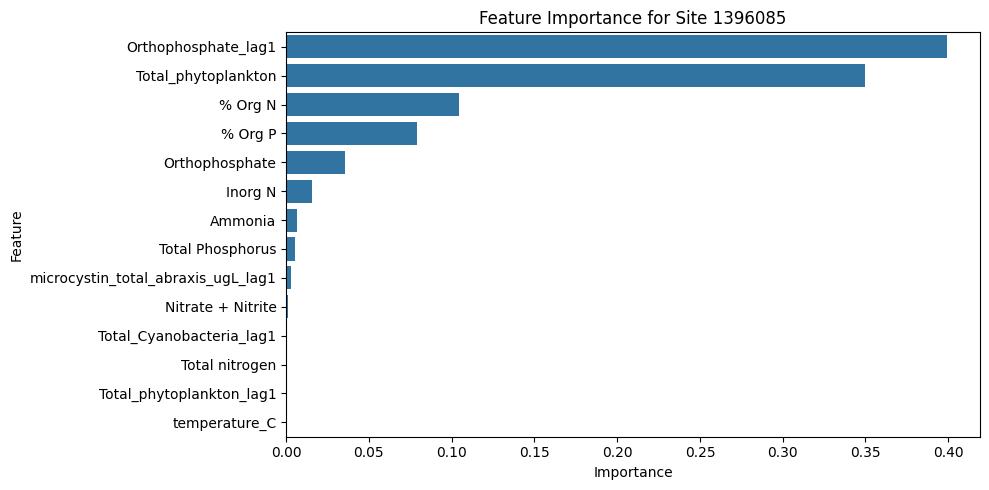

Site 1396500 - MAE: 57.54, RMSE: 372.39, R2: 0.87


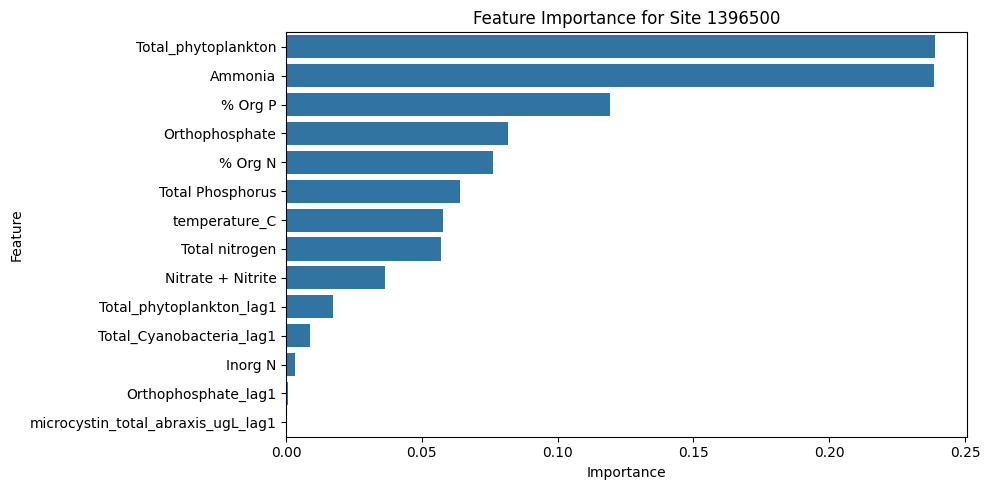

Site 1396800 - MAE: 218.45, RMSE: 1038.50, R2: 0.94


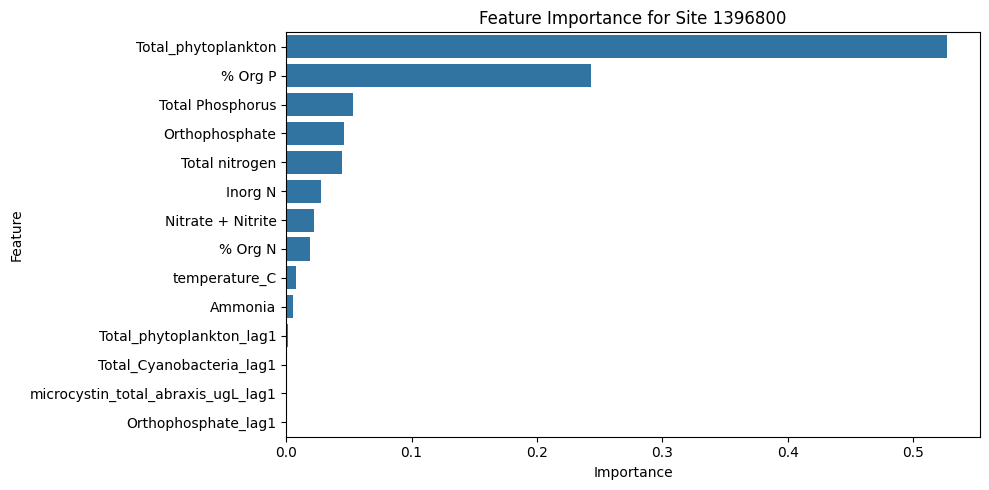

Site 1397000 - MAE: 267.11, RMSE: 1007.37, R2: 0.43


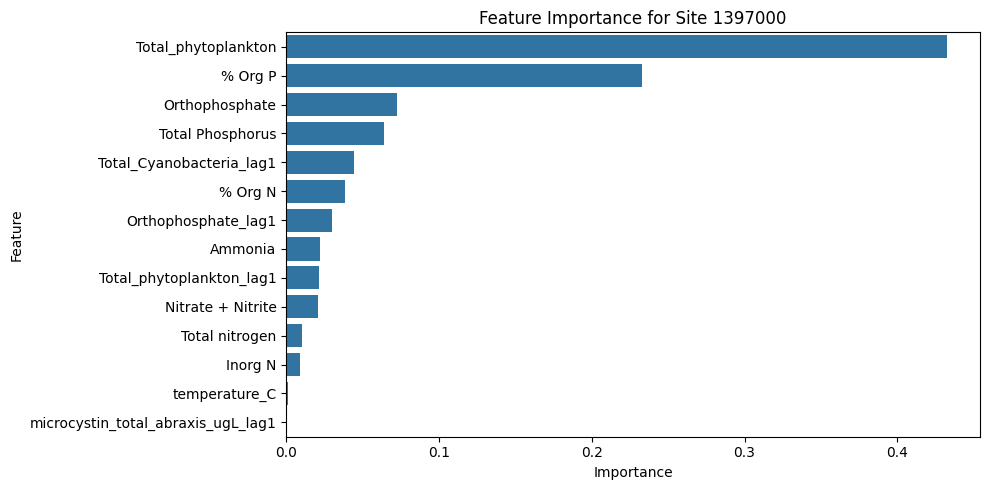

Site 1401000 - MAE: 28.91, RMSE: 274.12, R2: 0.18


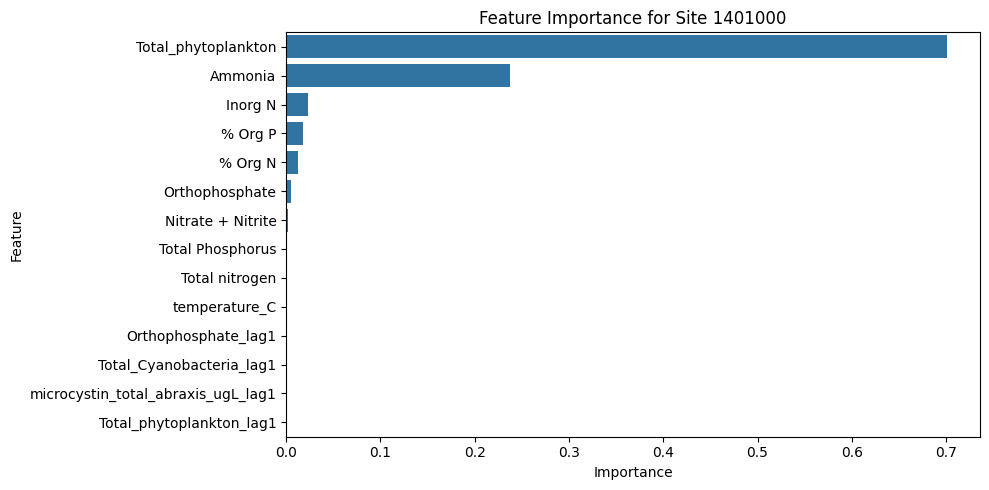

Site 1402000 - MAE: 48.03, RMSE: 297.18, R2: 0.10


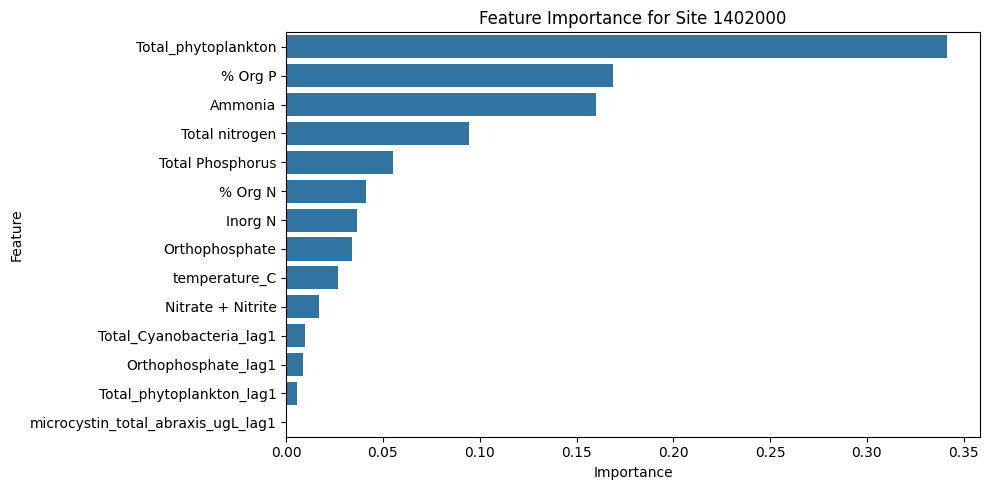

Site 1400500 - MAE: 30.64, RMSE: 238.92, R2: 0.84


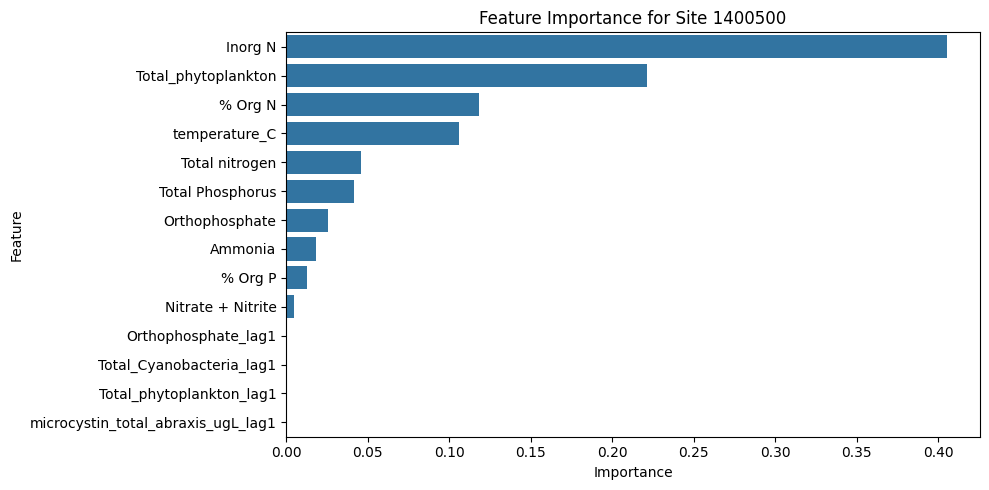

Site 1403060 - MAE: 34.10, RMSE: 219.47, R2: 0.69


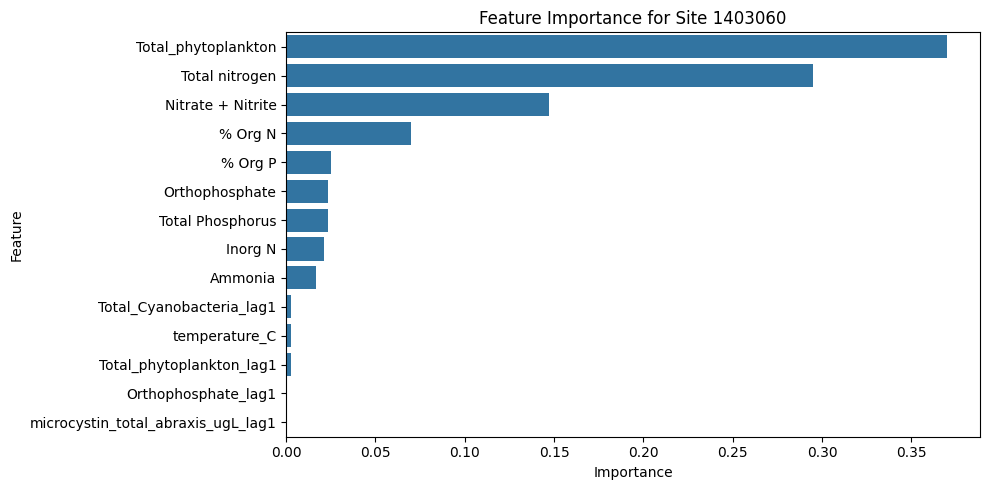

Site 1396790 - MAE: 16838.40, RMSE: 81127.45, R2: -383588761600.00


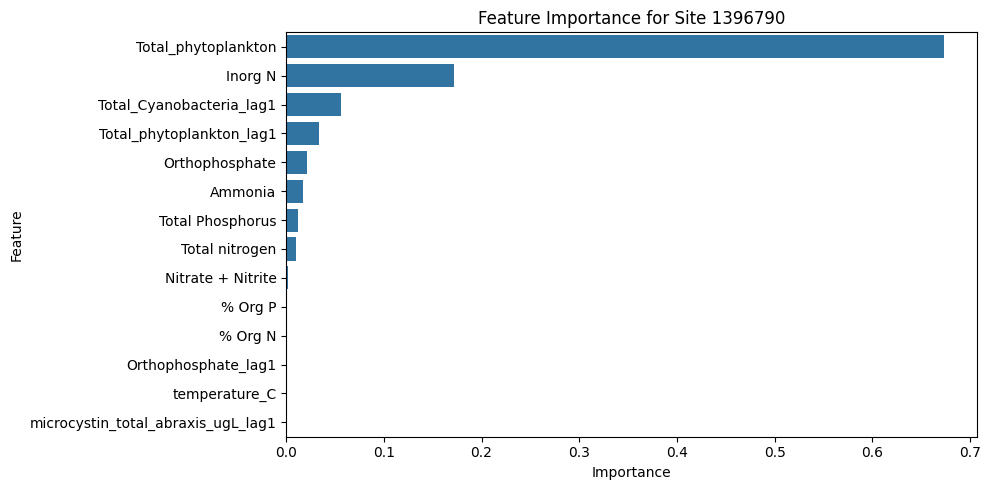


Summary across all sites:
      site           MAE          RMSE            R2
0  1396085   3525.193115  28077.972576  9.046353e-01
1  1396500     57.543587    372.385133  8.716550e-01
2  1396800    218.450928   1038.496329  9.439353e-01
3  1397000    267.107513   1007.369191  4.289064e-01
4  1401000     28.905727    274.115794  1.800500e-01
5  1402000     48.033779    297.177346  1.037297e-01
6  1400500     30.636393    238.921960  8.416021e-01
7  1403060     34.102097    219.473011  6.914091e-01
8  1396790  16838.396484  81127.450545 -3.835888e+11


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load and preprocess data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')
data['dateTime'] = pd.to_datetime(data['dateTime'])

important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]
target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']
lag_features = target_columns + ['Total_phytoplankton', 'Orthophosphate']

results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].copy()
    site_data.sort_values('dateTime', inplace=True)

    # Add lag features (1-day lag)
    for col in lag_features:
        site_data[f'{col}_lag1'] = site_data[col].shift(1)

    site_data.dropna(subset=important_features + [f'{col}_lag1' for col in lag_features] + target_columns, inplace=True)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    # Full feature list now includes lags
    feature_cols = important_features + [f'{col}_lag1' for col in lag_features]

    X = site_data[feature_cols]
    y = site_data[target_columns]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.9,
        random_state=42
    ))

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': feature_cols,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features only
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Function to create rolling features (mean, std)
def create_rolling_features(df, columns, window=7):
    for col in columns:
        df[f'{col}_roll_mean_{window}'] = df[col].rolling(window=window, min_periods=1).mean()
        df[f'{col}_roll_std_{window}'] = df[col].rolling(window=window, min_periods=1).std()
    return df

# Apply rolling features per site to avoid leakage
all_sites = []
for site in data['site_no'].unique():
    site_df = data[data['site_no'] == site].sort_values('dateTime')
    site_df = create_rolling_features(site_df, important_features, window=7)
    all_sites.append(site_df)

# Concatenate back the updated data
data = pd.concat(all_sites)
data = data.dropna(subset=important_features + target_columns)  # Drop rows with NA in features

# Optional: reset index
data.reset_index(drop=True, inplace=True)

# Store results for all sites
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X = site_data[important_features]
    y = site_data[target_columns]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance from first estimator (same for both outputs if trained similarly)
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features + [f'{f}_roll_mean_7' for f in important_features] + [f'{f}_roll_std_7' for f in important_features],
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


Site 1396085 - MAE: 3671.03, RMSE: 25042.59, R2: 0.94


ValueError: All arrays must be of the same length

Site 1396085 - MAE: 3879.44, RMSE: 27895.86, R2: 0.93


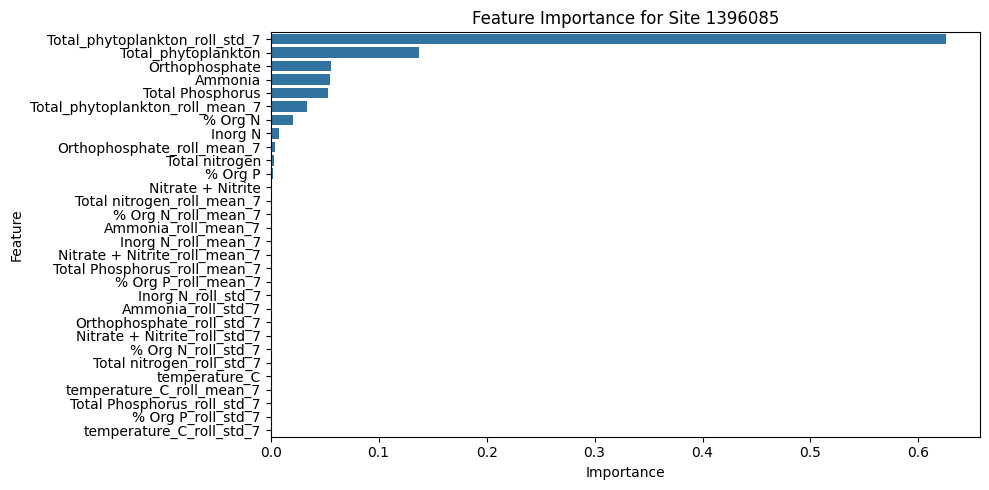

Site 1396500 - MAE: 65.83, RMSE: 370.14, R2: 0.60


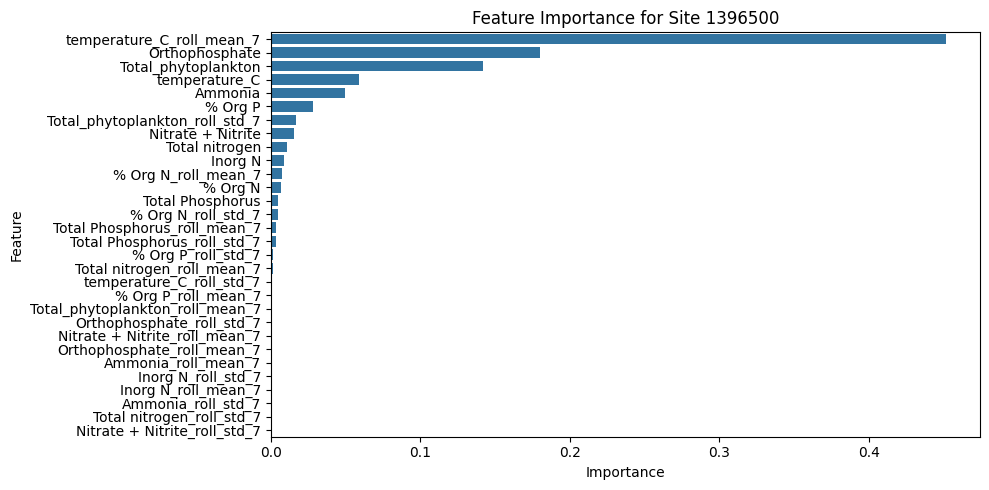

Site 1396800 - MAE: 452.69, RMSE: 2348.62, R2: 0.89


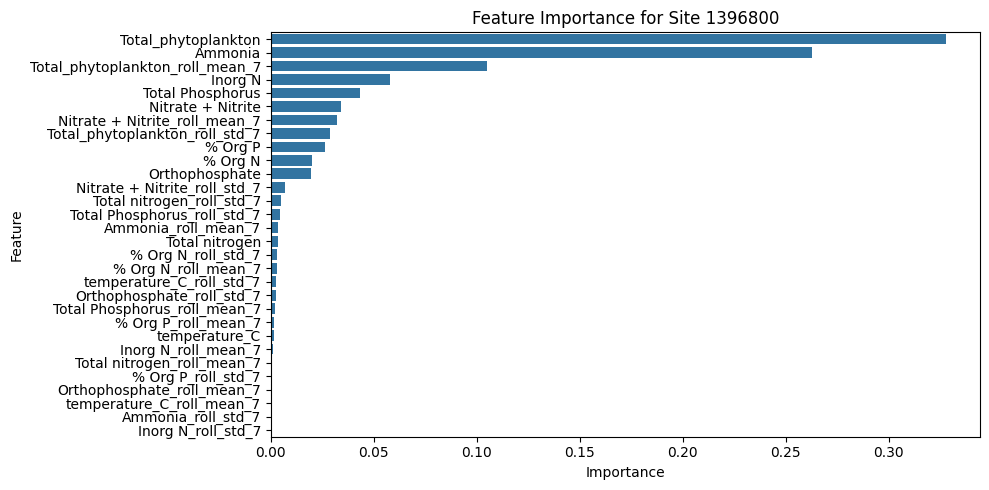

Site 1397000 - MAE: 389.93, RMSE: 1341.43, R2: 0.38


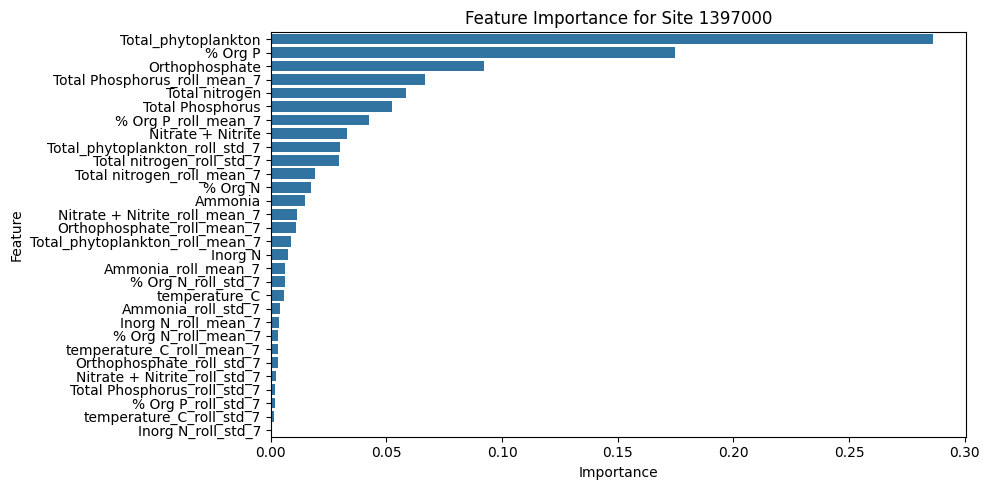

Site 1401000 - MAE: 23.58, RMSE: 128.30, R2: -102788694016.00


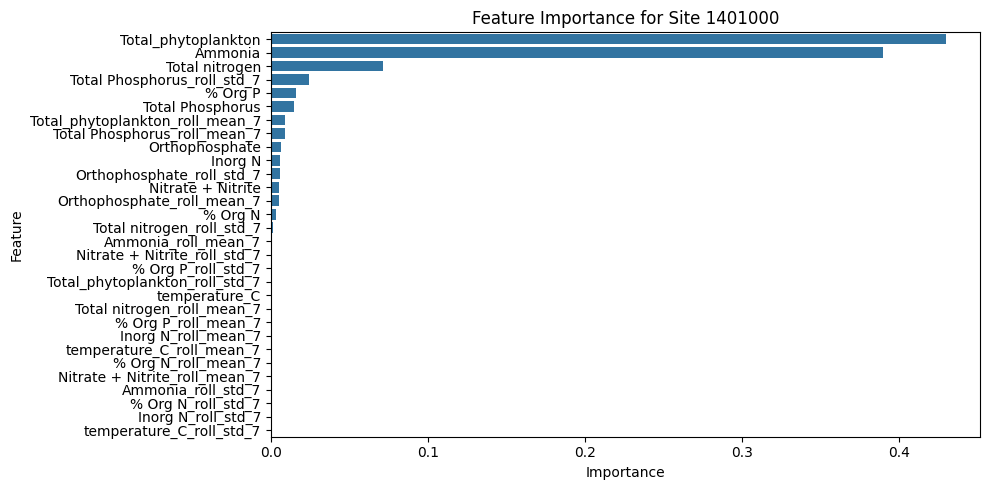

Site 1402000 - MAE: 36.64, RMSE: 187.15, R2: 0.32


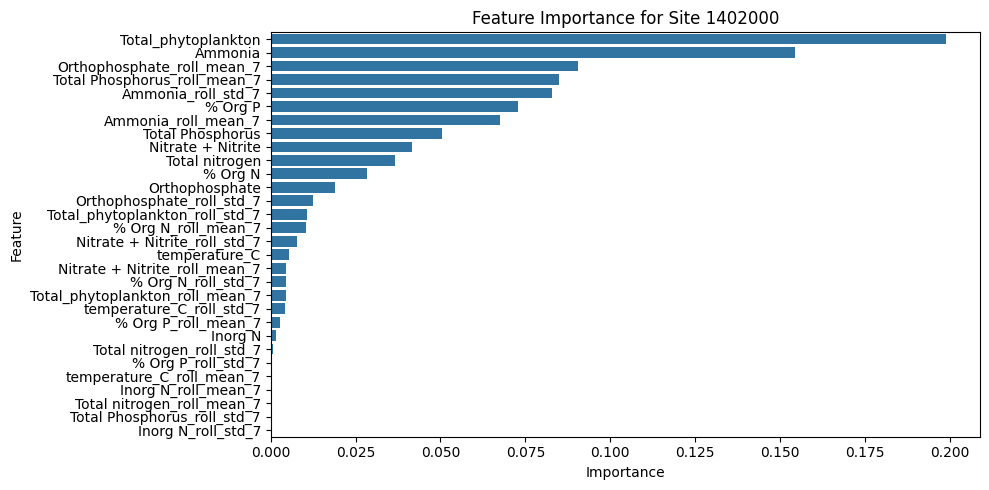

Site 1400500 - MAE: 12.76, RMSE: 106.22, R2: 0.87


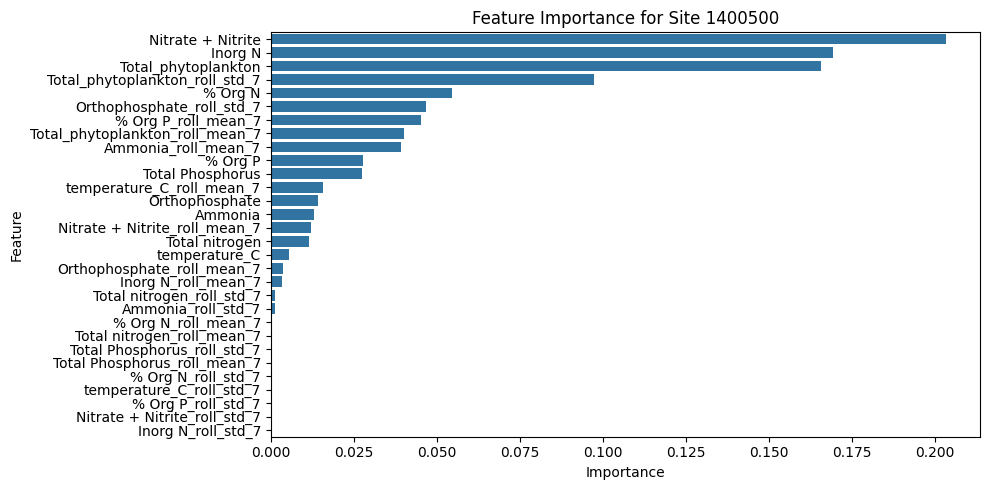

Site 1403060 - MAE: 72.76, RMSE: 426.41, R2: 0.85


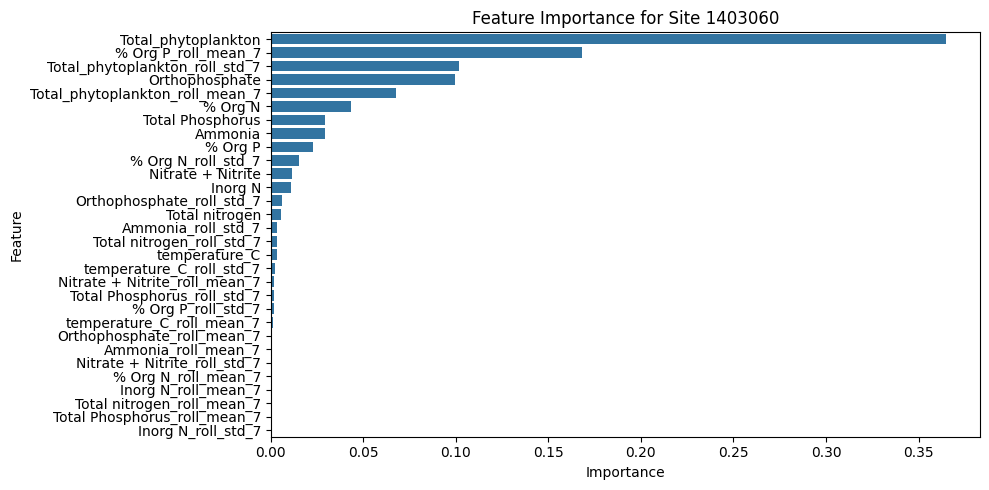

Site 1396790 - MAE: 38213.83, RMSE: 191197.21, R2: 0.46


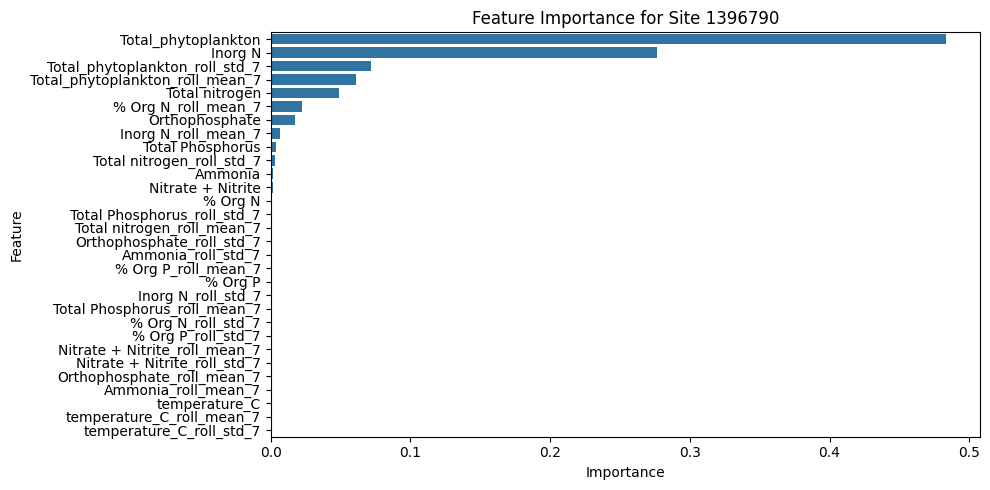


Summary across all sites:
      site           MAE           RMSE            R2
0  1396085   3879.442627   27895.856610  9.307135e-01
1  1396500     65.825760     370.138973  5.986460e-01
2  1396800    452.693634    2348.621191  8.904351e-01
3  1397000    389.927032    1341.430393  3.765348e-01
4  1401000     23.584272     128.301700 -1.027887e+11
5  1402000     36.641479     187.151050  3.231221e-01
6  1400500     12.758542     106.218391  8.671345e-01
7  1403060     72.755524     426.408218  8.480415e-01
8  1396790  38213.832031  191197.212365  4.646844e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features only
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Function to create rolling features (mean, std)
def create_rolling_features(df, columns, window=7):
    for col in columns:
        df[f'{col}_roll_mean_{window}'] = df[col].rolling(window=window, min_periods=1).mean()
        df[f'{col}_roll_std_{window}'] = df[col].rolling(window=window, min_periods=1).std()
    return df

# Apply rolling features per site to avoid leakage
all_sites = []
for site in data['site_no'].unique():
    site_df = data[data['site_no'] == site].sort_values('dateTime')
    site_df = create_rolling_features(site_df, important_features, window=7)
    all_sites.append(site_df)

# Concatenate back the updated data
data = pd.concat(all_sites)
data = data.dropna(subset=important_features + target_columns)  # Drop rows with NA in features

# Optional: reset index
data.reset_index(drop=True, inplace=True)

# Store results for all sites
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    # All features including rolling features
    all_features = important_features + [f'{f}_roll_mean_7' for f in important_features] + [f'{f}_roll_std_7' for f in important_features]

    X = site_data[all_features] # Use all features
    y = site_data[target_columns]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = MultiOutputRegressor(xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    ))

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance from first estimator
    feature_importance = model.estimators_[0].feature_importances_
    importance_df = pd.DataFrame({
        'Feature': all_features, # Use all features here as well
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396085 - Optimized Model - MAE: 9586.08, RMSE: 52954.28, R2: 0.76


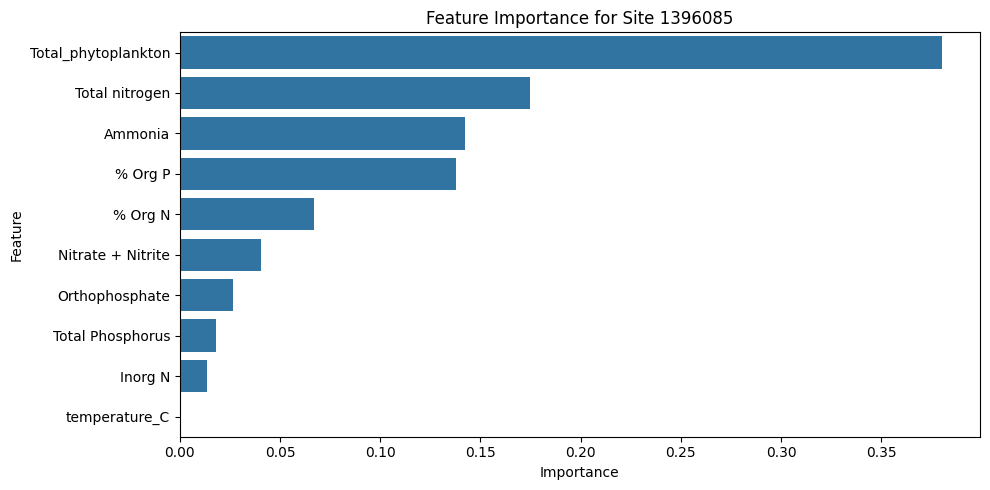

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396500 - Optimized Model - MAE: 99.88, RMSE: 419.73, R2: -1.52


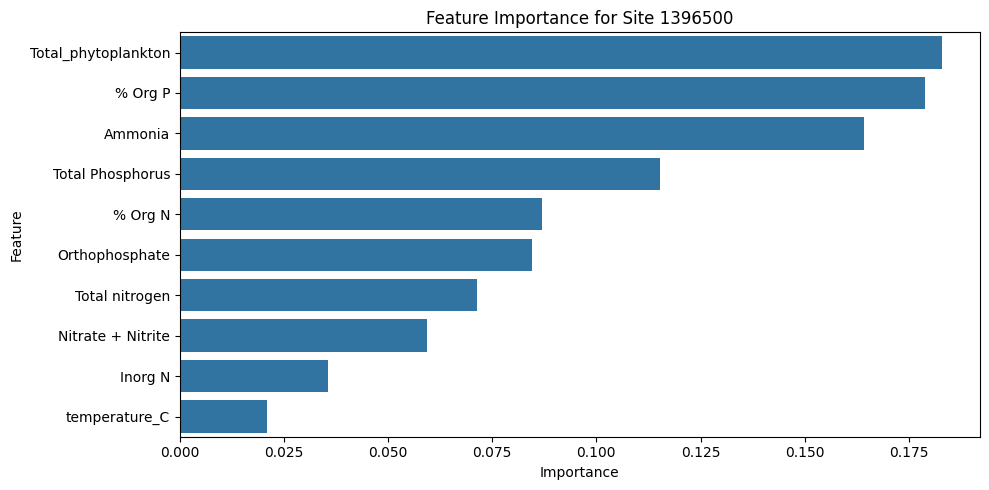

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396800 - Optimized Model - MAE: 996.44, RMSE: 4470.59, R2: 0.79


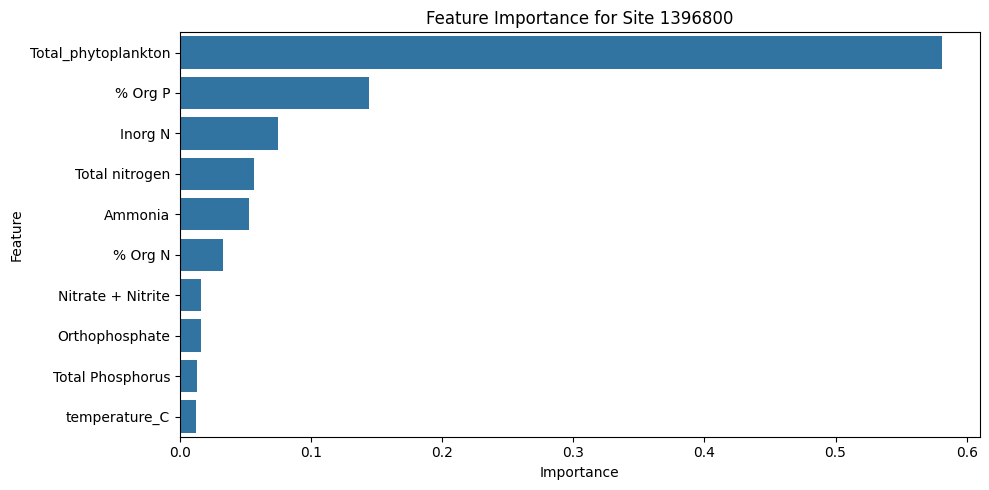

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1397000 - Optimized Model - MAE: 417.07, RMSE: 1409.51, R2: 0.37


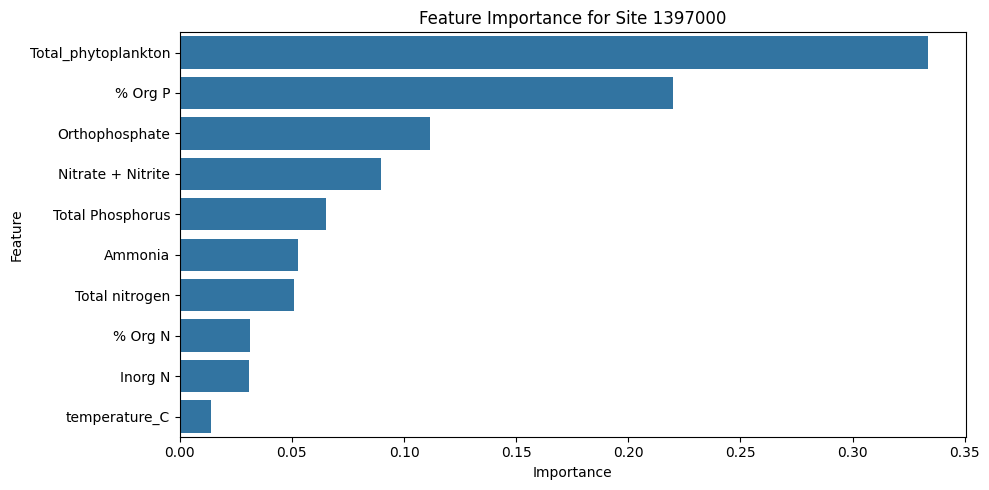

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1401000 - Optimized Model - MAE: 278.35, RMSE: 1086.07, R2: -1818526208.00


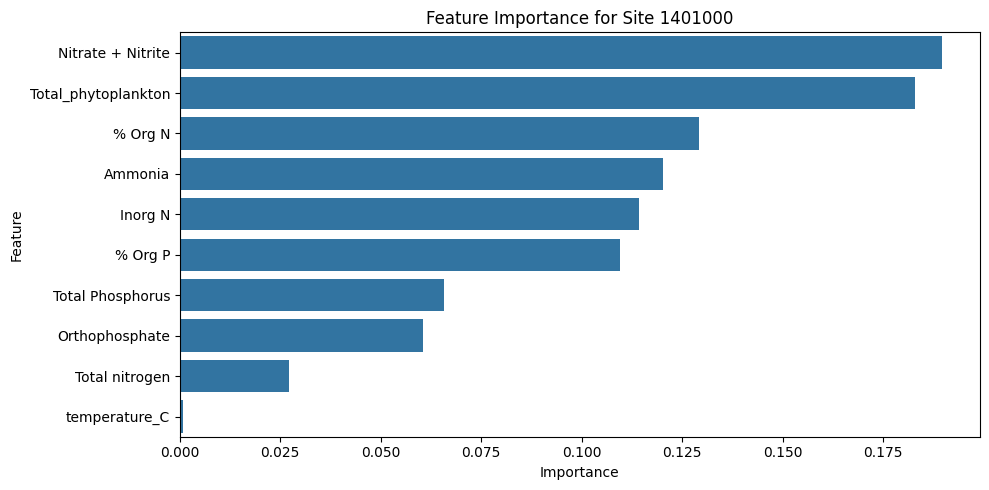

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1402000 - Optimized Model - MAE: 82.46, RMSE: 330.38, R2: -0.04


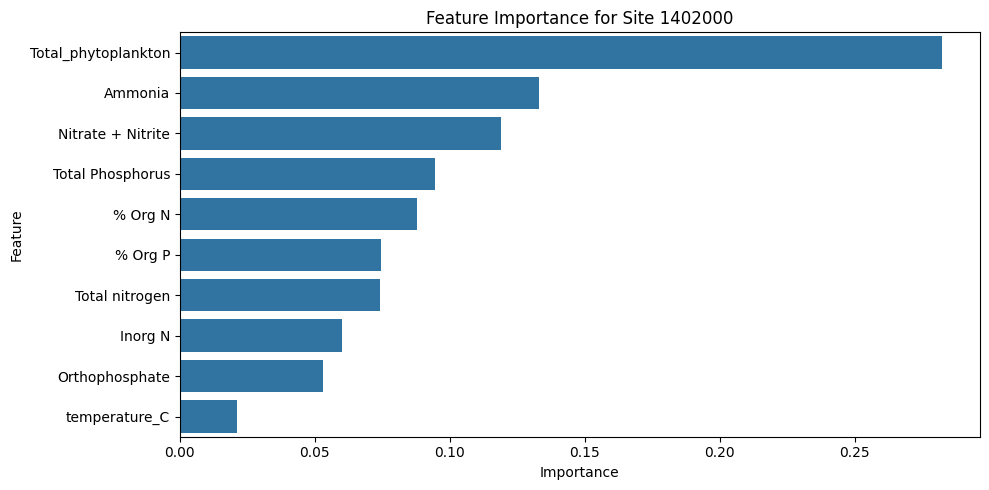

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1400500 - Optimized Model - MAE: 50.03, RMSE: 302.31, R2: -8.08


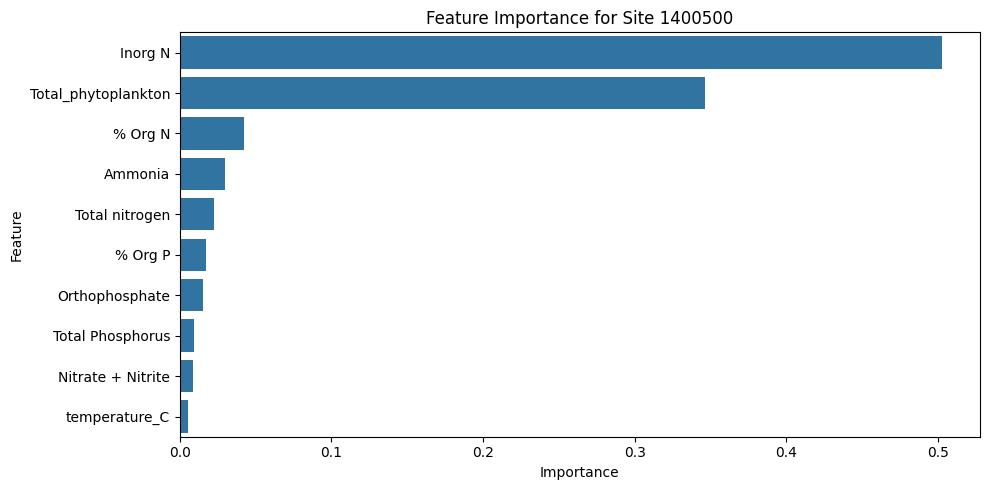

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1403060 - Optimized Model - MAE: 139.64, RMSE: 715.50, R2: -1.43


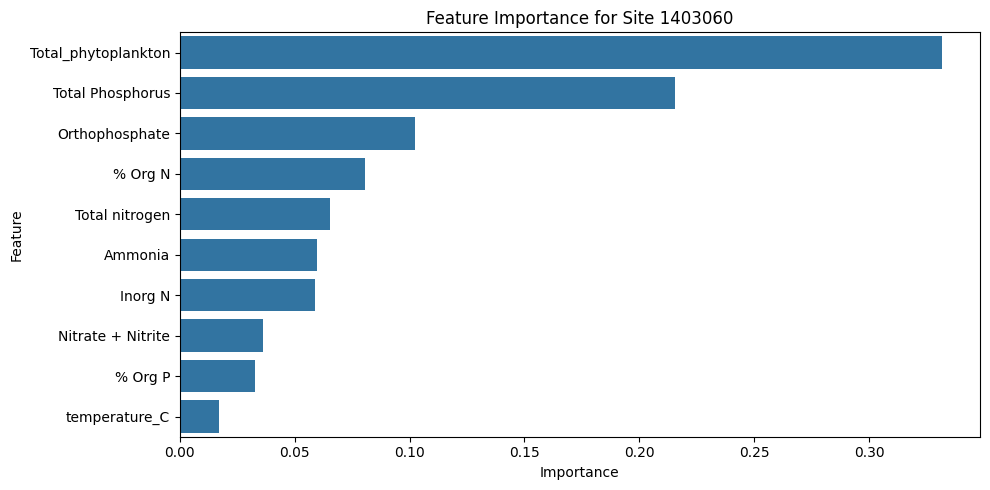

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396790 - Optimized Model - MAE: 7363.25, RMSE: 31316.25, R2: 0.39


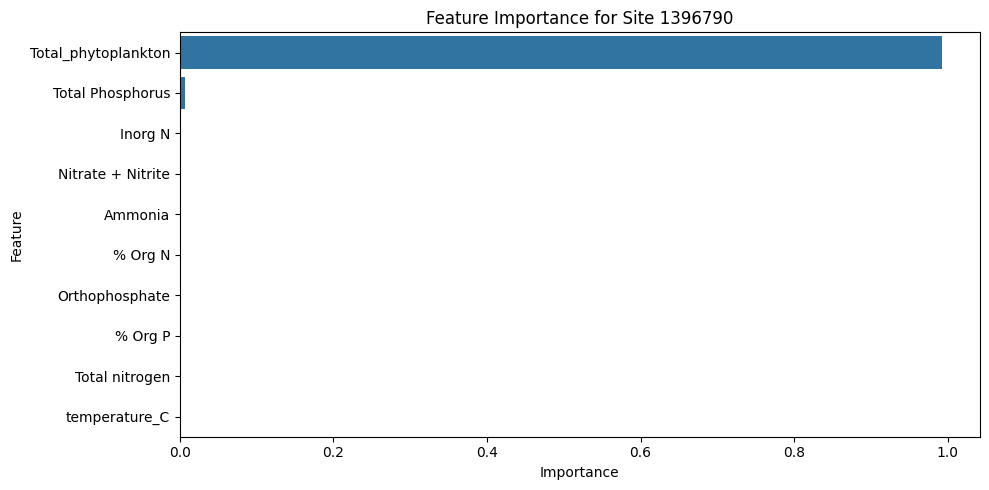


Summary across all sites:
      site          MAE          RMSE            R2
0  1396085  9586.075195  52954.276428  7.598034e-01
1  1396500    99.880363    419.731983 -1.516110e+00
2  1396800   996.439636   4470.589894  7.940279e-01
3  1397000   417.066772   1409.511884  3.651636e-01
4  1401000   278.352203   1086.065491 -1.818526e+09
5  1402000    82.458130    330.376348 -3.629369e-02
6  1400500    50.027031    302.310426 -8.076264e+00
7  1403060   139.639343    715.502730 -1.427855e+00
8  1396790  7363.249512  31316.249073  3.902375e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Define the important features and target columns
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Store results for all sites
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    # Skip sites with less than 50 data points
    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    # Features and targets
    X = site_data[important_features]
    y = site_data[target_columns]

    # Train-test split (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Hyperparameter grid for tuning
    param_grid = {
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'n_estimators': [50, 100, 150],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'gamma': [0, 0.1, 0.2],
        'min_child_weight': [1, 5, 10]
    }

    # Initialize XGBoost Regressor
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Use RandomizedSearchCV for hyperparameter tuning (5-fold cross-validation)
    random_search = RandomizedSearchCV(estimator=xgb_regressor, param_distributions=param_grid,
                                       n_iter=10, cv=5, verbose=2, random_state=42, n_jobs=-1)

    # Fit the RandomizedSearchCV model
    random_search.fit(X_train, y_train)

    # Get the best model from the search
    best_model = random_search.best_estimator_

    # Predict on the test set
    y_pred_best = best_model.predict(X_test)

    # Calculate evaluation metrics
    mae_best = mean_absolute_error(y_test, y_pred_best)
    rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
    r2_best = r2_score(y_test, y_pred_best)

    # Print the results for the current site
    print(f"Site {site} - Optimized Model - MAE: {mae_best:.2f}, RMSE: {rmse_best:.2f}, R2: {r2_best:.2f}")

    # Feature importance from the best model
    feature_importance = best_model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae_best, 'RMSE': rmse_best, 'R2': r2_best})

# Summary of results across all sites
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396085 - Optimized Model - MAE: 9586.08, RMSE: 52954.28, R2: 0.76


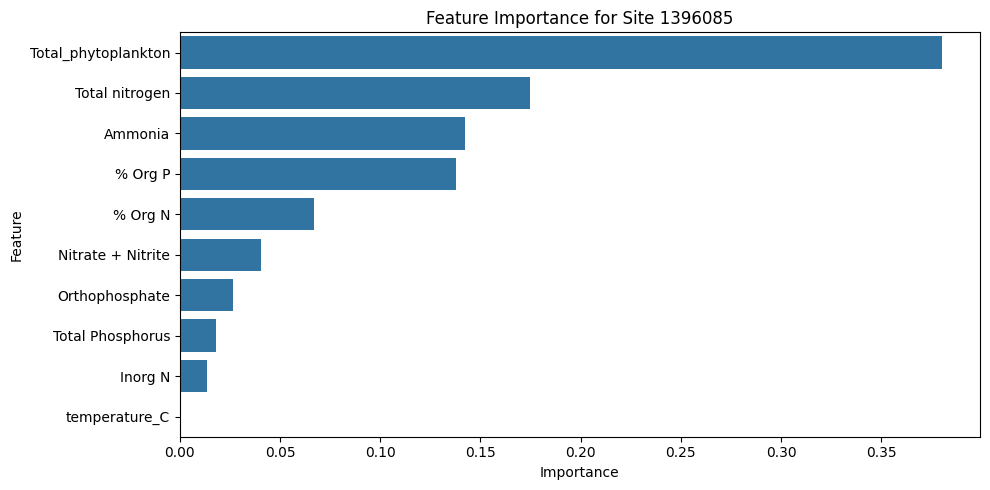

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396500 - Optimized Model - MAE: 96.99, RMSE: 416.82, R2: -1.51


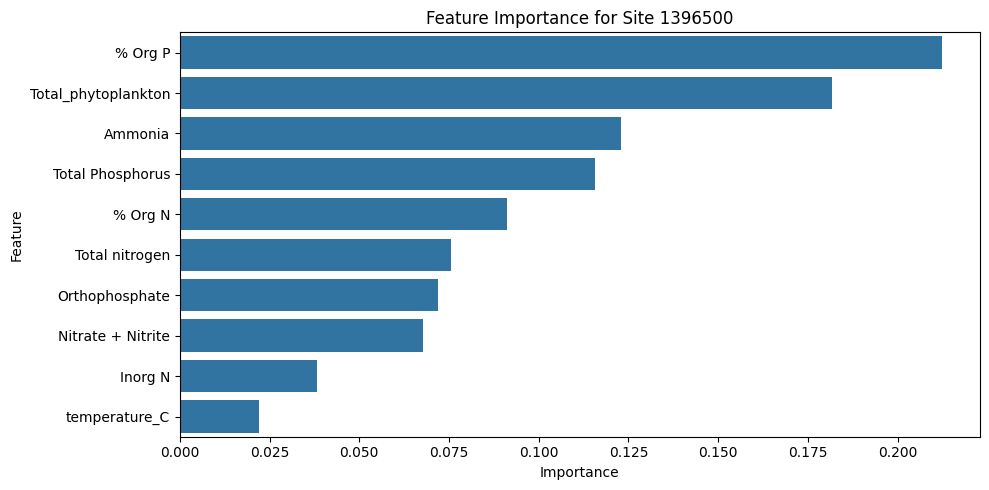

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396800 - Optimized Model - MAE: 999.14, RMSE: 4469.10, R2: 0.79


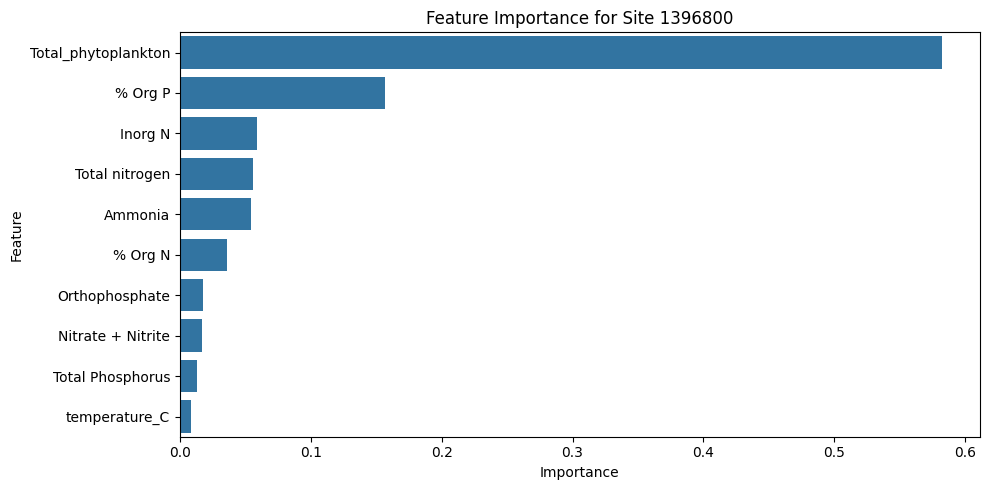

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1397000 - Optimized Model - MAE: 425.82, RMSE: 1502.41, R2: 0.35


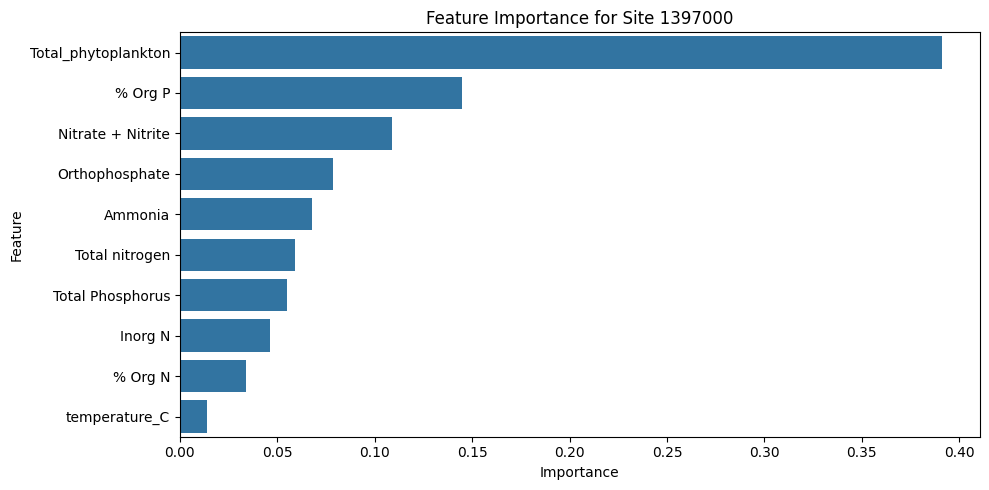

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1401000 - Optimized Model - MAE: 300.02, RMSE: 1133.55, R2: -1818526208.00


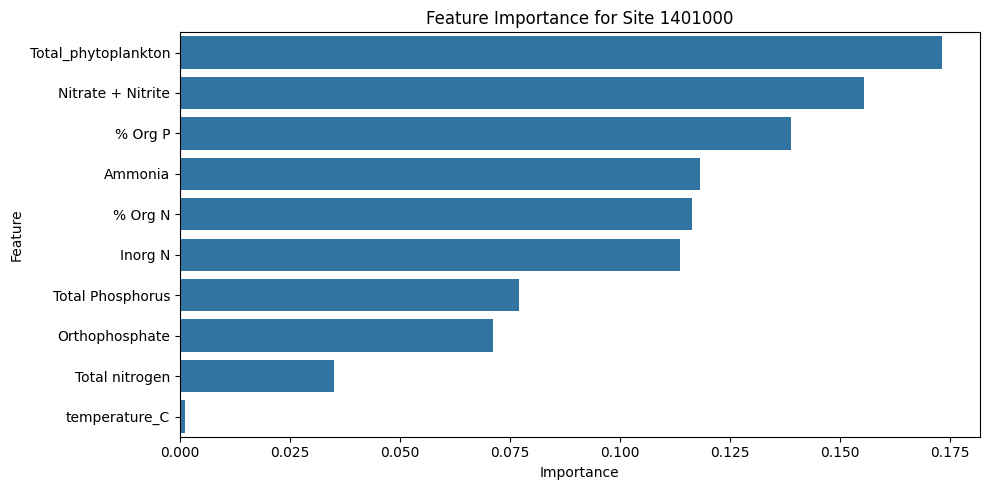

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1402000 - Optimized Model - MAE: 80.63, RMSE: 332.21, R2: -0.04


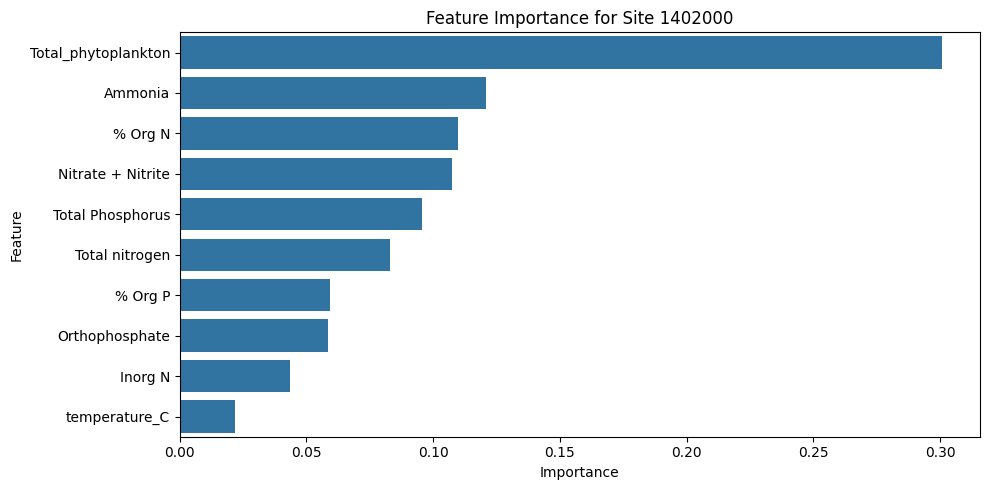

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1400500 - Optimized Model - MAE: 50.20, RMSE: 302.32, R2: -8.08


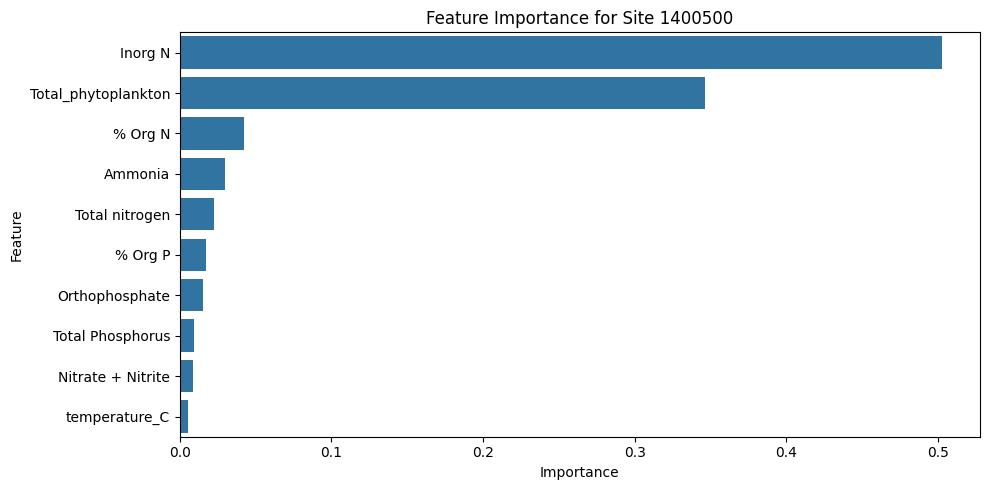

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1403060 - Optimized Model - MAE: 133.91, RMSE: 706.11, R2: -1.42


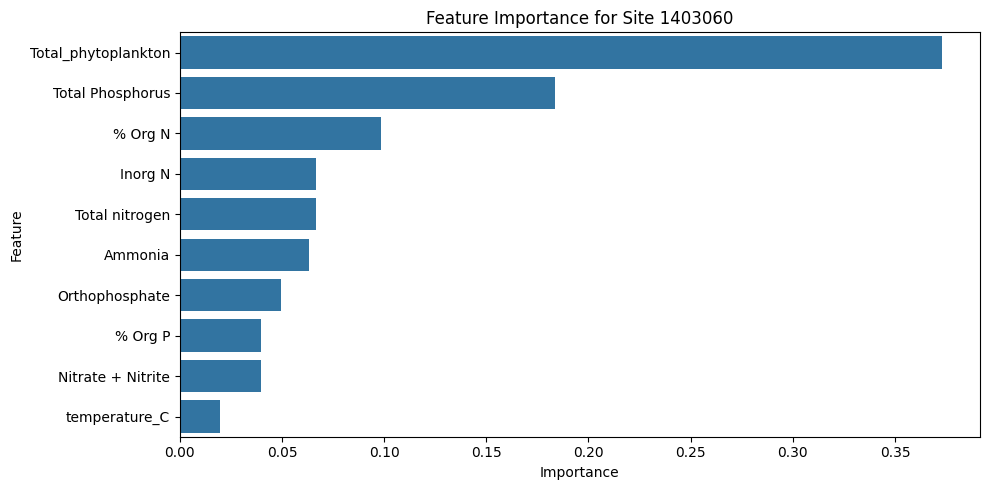

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Site 1396790 - Optimized Model - MAE: 6495.49, RMSE: 27844.82, R2: 0.39


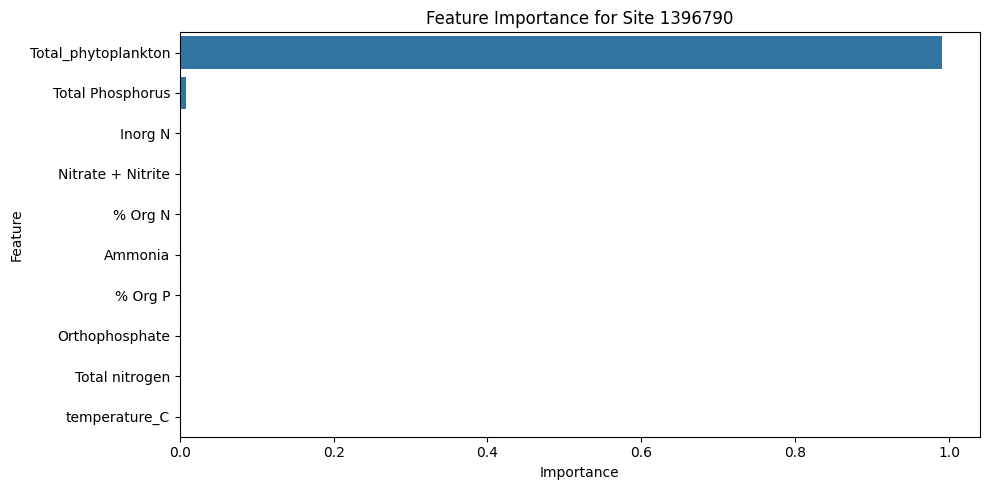


Summary across all sites:
      site          MAE          RMSE            R2
0  1396085  9586.075195  52954.276428  7.598034e-01
1  1396500    96.987701    416.819112 -1.508971e+00
2  1396800   999.135681   4469.103937  7.913218e-01
3  1397000   425.822418   1502.405737  3.487399e-01
4  1401000   300.021820   1133.553594 -1.818526e+09
5  1402000    80.633522    332.207543 -4.217696e-02
6  1400500    50.198563    302.315194 -8.076299e+00
7  1403060   133.910385    706.114102 -1.416700e+00
8  1396790  6495.494629  27844.820272  3.902824e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Define the important features and target columns
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Store results for all sites
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    # Skip sites with less than 50 data points
    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    # Features and targets
    X = site_data[important_features]
    y = site_data[target_columns]

    # Scale the features using StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train-test split (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    # Hyperparameter grid for tuning
    param_grid = {
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5],
        'n_estimators': [50, 100, 150],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'gamma': [0, 0.1, 0.2],
        'min_child_weight': [1, 5, 10]
    }

    # Initialize XGBoost Regressor
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Use RandomizedSearchCV for hyperparameter tuning (5-fold cross-validation)
    random_search = RandomizedSearchCV(estimator=xgb_regressor, param_distributions=param_grid,
                                       n_iter=10, cv=5, verbose=2, random_state=42, n_jobs=-1)

    # Fit the RandomizedSearchCV model
    random_search.fit(X_train, y_train)

    # Get the best model from the search
    best_model = random_search.best_estimator_

    # Predict on the test set
    y_pred_best = best_model.predict(X_test)

    # Calculate evaluation metrics
    mae_best = mean_absolute_error(y_test, y_pred_best)
    rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
    r2_best = r2_score(y_test, y_pred_best)

    # Print the results for the current site
    print(f"Site {site} - Optimized Model - MAE: {mae_best:.2f}, RMSE: {rmse_best:.2f}, R2: {r2_best:.2f}")

    # Feature importance from the best model
    feature_importance = best_model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae_best, 'RMSE': rmse_best, 'R2': r2_best})

# Summary of results across all sites
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1396085 - MAE: 4027.63, RMSE: 26430.81, R2: 0.93


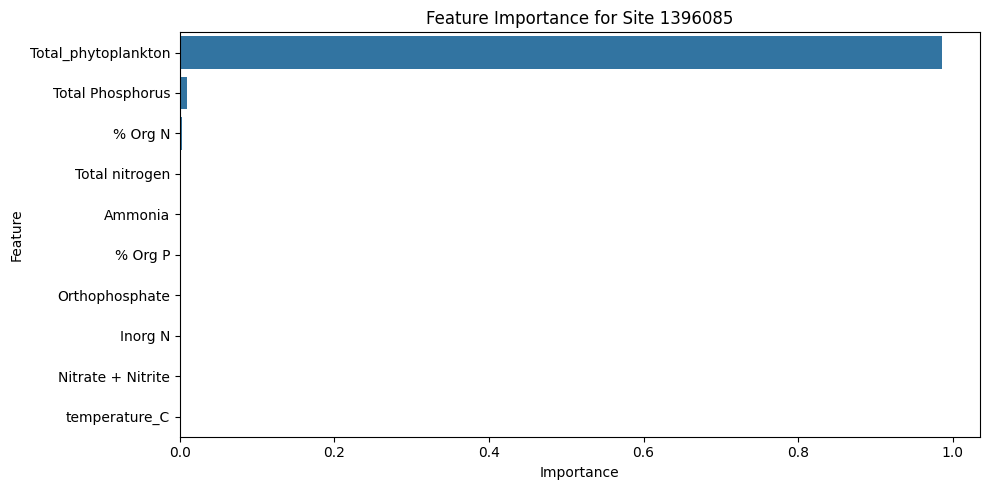

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1396500 - MAE: 55.90, RMSE: 309.20, R2: -97.28


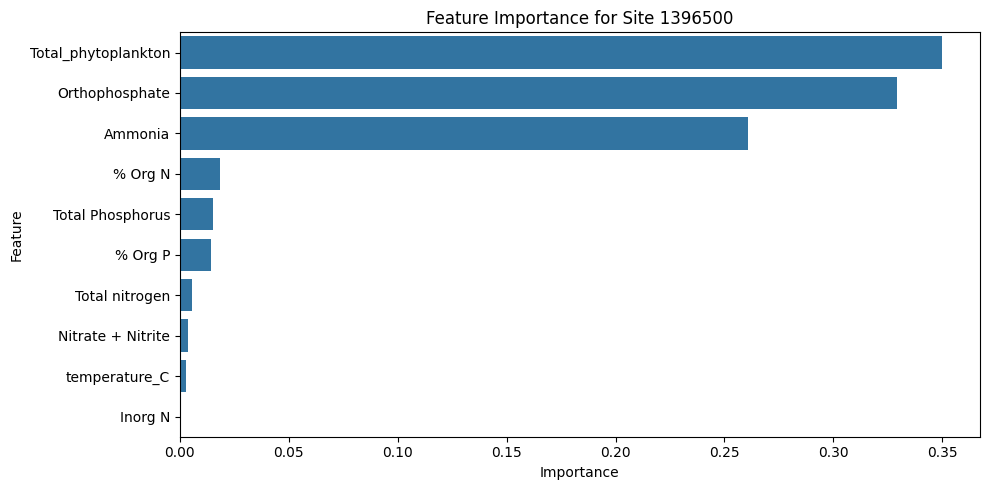

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1396800 - MAE: 348.42, RMSE: 1681.98, R2: 0.89


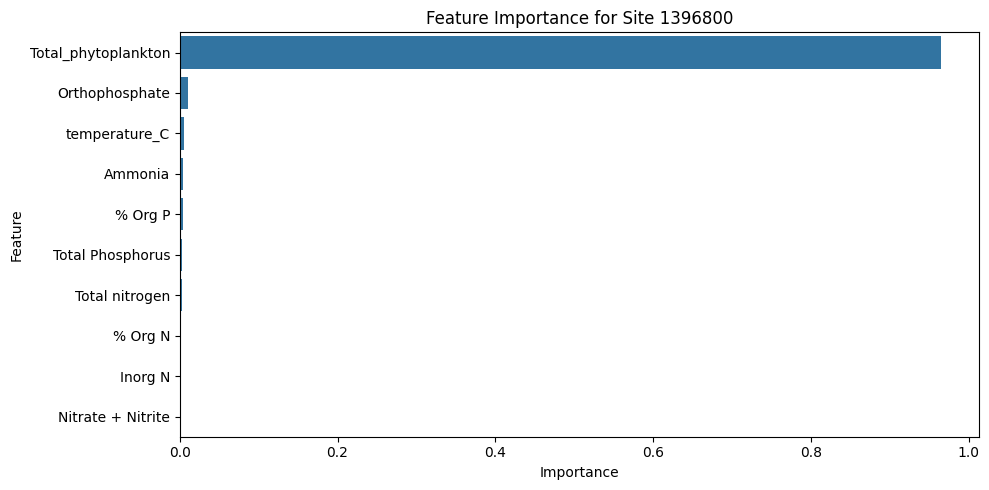

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1397000 - MAE: 338.52, RMSE: 1114.99, R2: 0.41


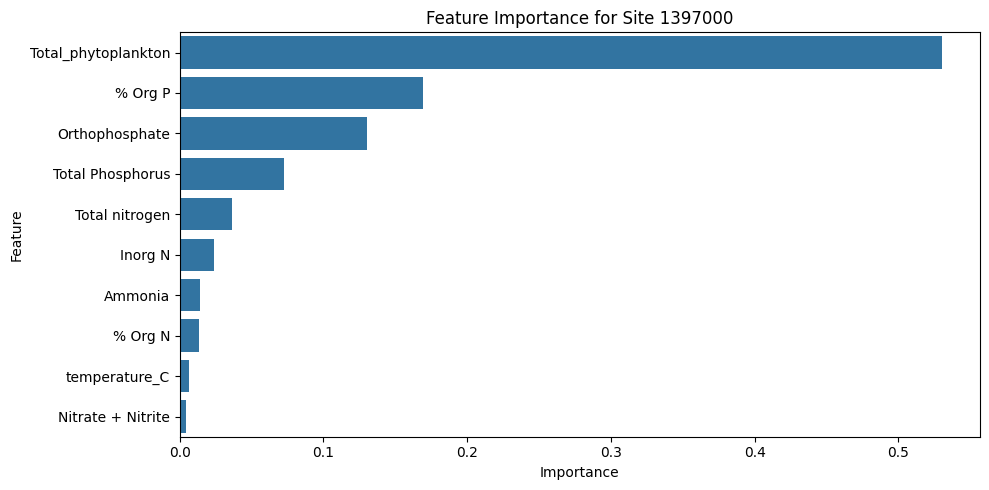

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1401000 - MAE: 18.79, RMSE: 105.35, R2: -1072632256.00


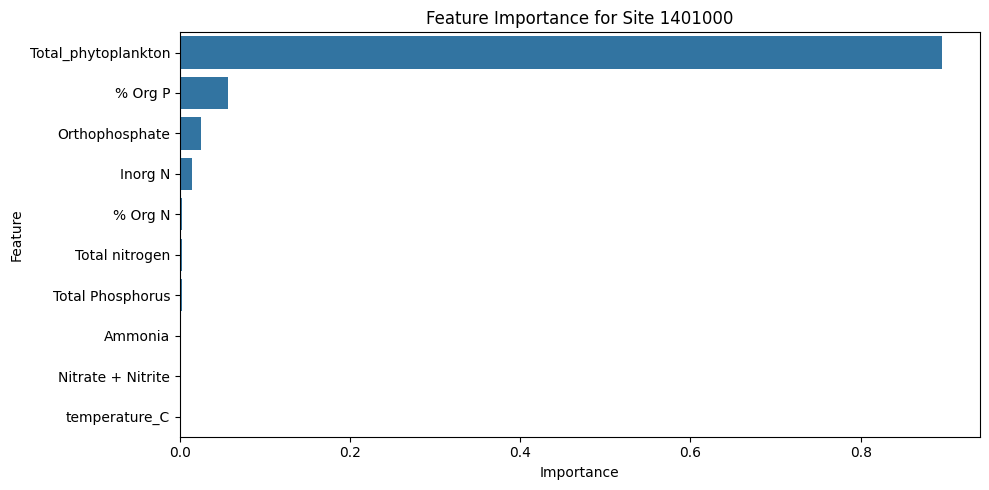

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1402000 - MAE: 38.60, RMSE: 190.51, R2: 0.32


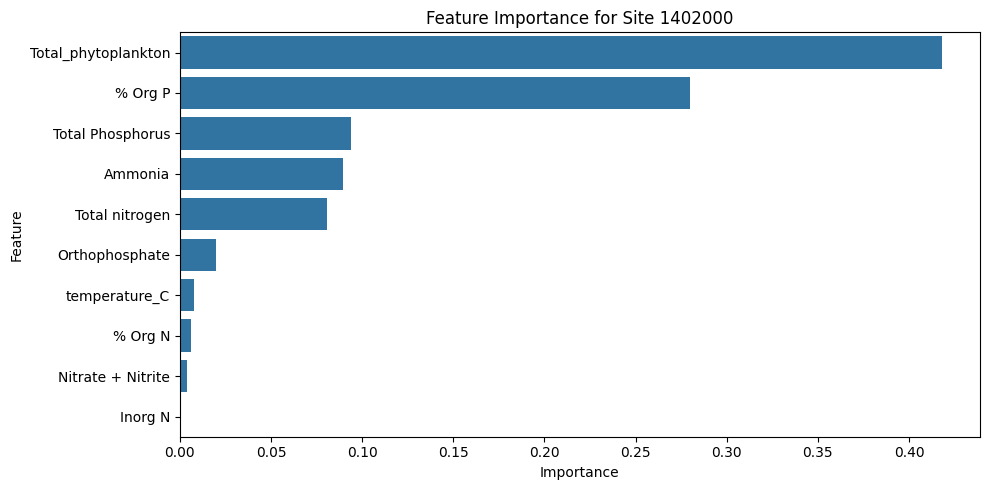

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1400500 - MAE: 21.59, RMSE: 159.47, R2: -7.30


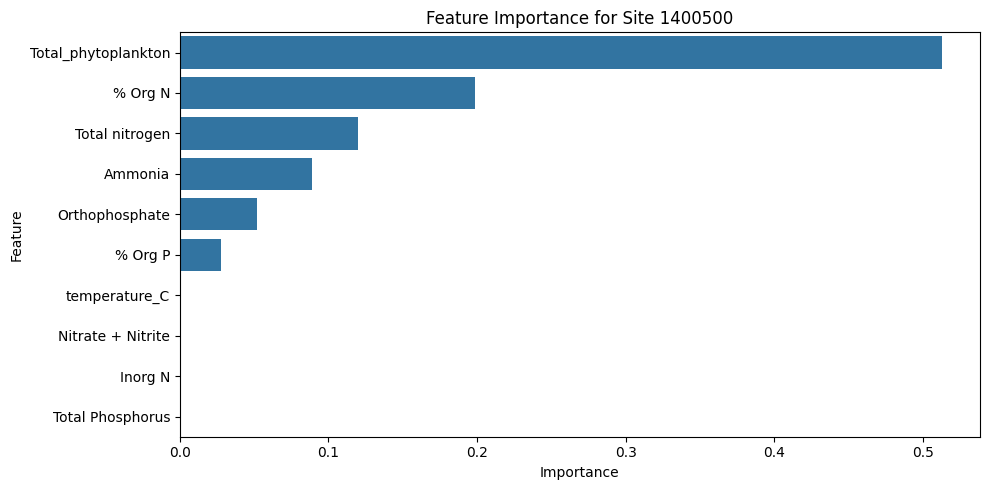

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1403060 - MAE: 61.86, RMSE: 341.33, R2: -161.10


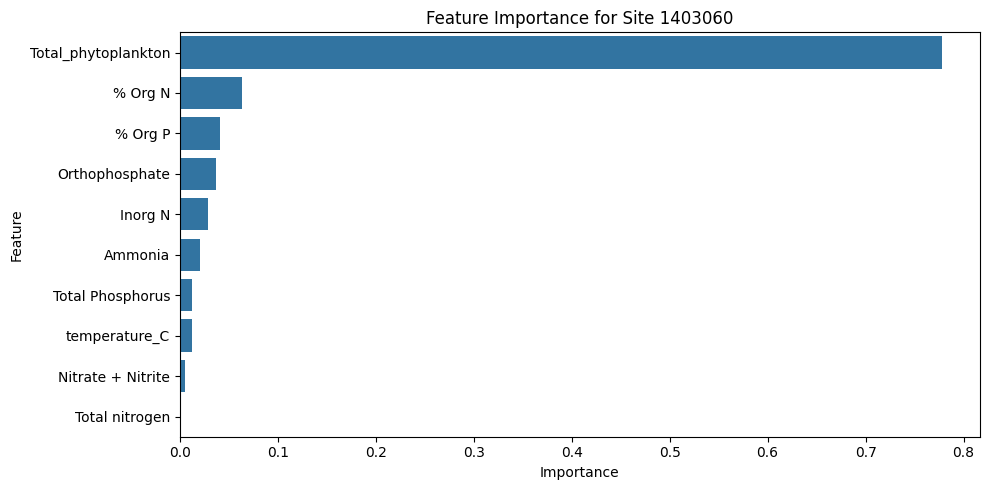

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Site 1396790 - MAE: 2078.59, RMSE: 19293.39, R2: 0.49


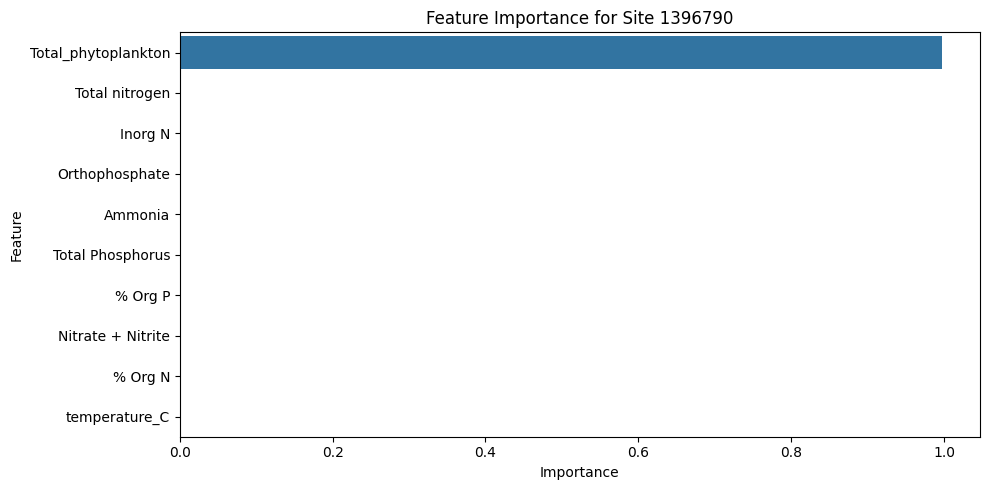


Summary across all sites:
      site          MAE          RMSE            R2
0  1396085  4027.626709  26430.813533  9.295557e-01
1  1396500    55.896469    309.196047 -9.728007e+01
2  1396800   348.423615   1681.982461  8.853153e-01
3  1397000   338.520081   1114.990303  4.103223e-01
4  1401000    18.785725    105.347704 -1.072632e+09
5  1402000    38.601902    190.506172  3.169800e-01
6  1400500    21.589561    159.465526 -7.299465e+00
7  1403060    61.858398    341.332877 -1.610974e+02
8  1396790  2078.592529  19293.386224  4.942577e-01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features only
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Store results for all sites
results = []

# Split and train on each site
for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X = site_data[important_features]
    y = site_data[target_columns]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Define hyperparameter grid
    param_dist = {
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5, 6],
        'n_estimators': [50, 100, 150],
        'subsample': [0.6, 0.7, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.7, 0.8, 1.0],
        'gamma': [0, 0.1, 0.2],
        'min_child_weight': [1, 5, 10],
        'reg_alpha': [0, 0.01, 0.1],
        'reg_lambda': [1, 1.1, 1.2]
    }

    # RandomizedSearchCV to find optimal parameters
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=3,
                                       verbose=2, n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)

    # Get the best model
    best_model = random_search.best_estimator_

    # Predict on the test set
    y_pred = best_model.predict(X_test)

    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Output results
    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Feature importance from the best model
    feature_importance = best_model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot feature importance
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

    # Store results
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Handle missing values
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Drop rows with missing important features and target columns
data = data.dropna(subset=important_features + target_columns)

# Feature Engineering: Log transformation on target variables if they are skewed
data['Total_Cyanobacteria'] = np.log1p(data['Total_Cyanobacteria'])
data['microcystin_total_abraxis_ugL'] = np.log1p(data['microcystin_total_abraxis_ugL'])

# Scale the features using StandardScaler (you can also use MinMaxScaler if preferred)
scaler = StandardScaler()
data[important_features] = scaler.fit_transform(data[important_features])

# Feature Selection: Keep only the important features for training
X = data[important_features]
y = data[target_columns]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the base XGBoost model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Hyperparameter tuning with RandomizedSearchCV
param_dist = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'n_estimators': [50, 100],
    'subsample': [0.7, 0.8],
    'colsample_bytree': [0.7, 0.8],
    'gamma': [0, 0.1],
    'min_child_weight': [1, 5],
    'reg_alpha': [0, 0.01],
    'reg_lambda': [1, 1.1]
}

# Reduce the number of iterations for faster results
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=5, cv=3, verbose=1, random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Best model after RandomizedSearchCV
best_model = random_search.best_estimator_

# Evaluate the model on test data
y_pred = best_model.predict(X_test)

# Calculate performance metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Optimized Model - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

# Feature importance analysis
feature_importance = best_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': important_features,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 5))
sns.barplot(data=importance_df, x='Importance', y='Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# Store results for all sites (example)
results = []
for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X_site = site_data[important_features]
    y_site = site_data[target_columns]

    X_train_site, X_test_site, y_train_site, y_test_site = train_test_split(X_site, y_site, test_size=0.2, random_state=42)

    best_model.fit(X_train_site, y_train_site)
    y_pred_site = best_model.predict(X_test_site)

    mae_site = mean_absolute_error(y_test_site, y_pred_site)
    rmse_site = np.sqrt(mean_squared_error(y_test_site, y_pred_site))
    r2_site = r2_score(y_test_site, y_pred_site)

    print(f"Site {site} - MAE: {mae_site:.2f}, RMSE: {rmse_site:.2f}, R2: {r2_site:.2f}")
    results.append({'site': site, 'MAE': mae_site, 'RMSE': rmse_site, 'R2': r2_site})

# Summary of results across all sites
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


Fitting 3 folds for each of 5 candidates, totalling 15 fits


ValueError: 
All the 15 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
7 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 1143, in fit
    train_dmatrix, evals = _wrap_evaluation_matrices(
                           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 603, in _wrap_evaluation_matrices
    train_dmatrix = create_dmatrix(
                    ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 1065, in _create_dmatrix
    return QuantileDMatrix(
           ^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1573, in __init__
    self._init(
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1632, in _init
    it.reraise()
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 569, in reraise
    raise exc  # pylint: disable=raising-bad-type
    ^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 550, in _handle_exception
    return fn()
           ^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 637, in <lambda>
    return self._handle_exception(lambda: self.next(input_data), 0)
                                          ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1402, in next
    input_data(**self.kwargs)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 626, in input_data
    self.proxy.set_info(
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 954, in set_info
    self.set_label(label)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1092, in set_label
    dispatch_meta_backend(self, label, "label", "float")
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1345, in dispatch_meta_backend
    _meta_from_pandas_df(data, name, dtype=dtype, handle=handle)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 628, in _meta_from_pandas_df
    _meta_from_numpy(array, name, dtype, handle)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1279, in _meta_from_numpy
    _check_call(_LIB.XGDMatrixSetInfoFromInterface(handle, c_str(field), interface_str))
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 284, in _check_call
    raise XGBoostError(py_str(_LIB.XGBGetLastError()))
xgboost.core.XGBoostError: [10:27:29] /workspace/src/data/data.cc:514: Check failed: valid: Label contains NaN, infinity or a value too large.
Stack trace:
  [bt] (0) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x25c1ac) [0x7c9d0885c1ac]
  [bt] (1) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x4e2229) [0x7c9d08ae2229]
  [bt] (2) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x4e3a60) [0x7c9d08ae3a60]
  [bt] (3) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(XGDMatrixSetInfoFromInterface+0xb2) [0x7c9d08763522]
  [bt] (4) /lib/x86_64-linux-gnu/libffi.so.8(+0x7e2e) [0x7c9d320f0e2e]
  [bt] (5) /lib/x86_64-linux-gnu/libffi.so.8(+0x4493) [0x7c9d320ed493]
  [bt] (6) /usr/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0xa4d8) [0x7c9d321004d8]
  [bt] (7) /usr/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0x9c8e) [0x7c9d320ffc8e]
  [bt] (8) /usr/bin/python3(_PyObject_MakeTpCall+0x27c) [0x52f6dc]



--------------------------------------------------------------------------------
8 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 1143, in fit
    train_dmatrix, evals = _wrap_evaluation_matrices(
                           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 603, in _wrap_evaluation_matrices
    train_dmatrix = create_dmatrix(
                    ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/sklearn.py", line 1065, in _create_dmatrix
    return QuantileDMatrix(
           ^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1573, in __init__
    self._init(
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1632, in _init
    it.reraise()
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 569, in reraise
    raise exc  # pylint: disable=raising-bad-type
    ^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 550, in _handle_exception
    return fn()
           ^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 637, in <lambda>
    return self._handle_exception(lambda: self.next(input_data), 0)
                                          ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1402, in next
    input_data(**self.kwargs)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 626, in input_data
    self.proxy.set_info(
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 954, in set_info
    self.set_label(label)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 1092, in set_label
    dispatch_meta_backend(self, label, "label", "float")
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1345, in dispatch_meta_backend
    _meta_from_pandas_df(data, name, dtype=dtype, handle=handle)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 628, in _meta_from_pandas_df
    _meta_from_numpy(array, name, dtype, handle)
  File "/usr/local/lib/python3.11/dist-packages/xgboost/data.py", line 1279, in _meta_from_numpy
    _check_call(_LIB.XGDMatrixSetInfoFromInterface(handle, c_str(field), interface_str))
  File "/usr/local/lib/python3.11/dist-packages/xgboost/core.py", line 284, in _check_call
    raise XGBoostError(py_str(_LIB.XGBGetLastError()))
xgboost.core.XGBoostError: [10:27:29] /workspace/src/data/data.cc:514: Check failed: valid: Label contains NaN, infinity or a value too large.
Stack trace:
  [bt] (0) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x25c1ac) [0x7e7b4bc5c1ac]
  [bt] (1) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x4e2229) [0x7e7b4bee2229]
  [bt] (2) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(+0x4e3a60) [0x7e7b4bee3a60]
  [bt] (3) /usr/local/lib/python3.11/dist-packages/xgboost/lib/libxgboost.so(XGDMatrixSetInfoFromInterface+0xb2) [0x7e7b4bb63522]
  [bt] (4) /lib/x86_64-linux-gnu/libffi.so.8(+0x7e2e) [0x7e7b7530fe2e]
  [bt] (5) /lib/x86_64-linux-gnu/libffi.so.8(+0x4493) [0x7e7b7530c493]
  [bt] (6) /usr/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0xa4d8) [0x7e7b7531f4d8]
  [bt] (7) /usr/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0x9c8e) [0x7e7b7531ec8e]
  [bt] (8) /usr/bin/python3(_PyObject_MakeTpCall+0x27c) [0x52f6dc]




Fitting 3 folds for each of 5 candidates, totalling 15 fits
Optimized Model - MAE: 414.85, RMSE: 3241.12, R2: -0.53


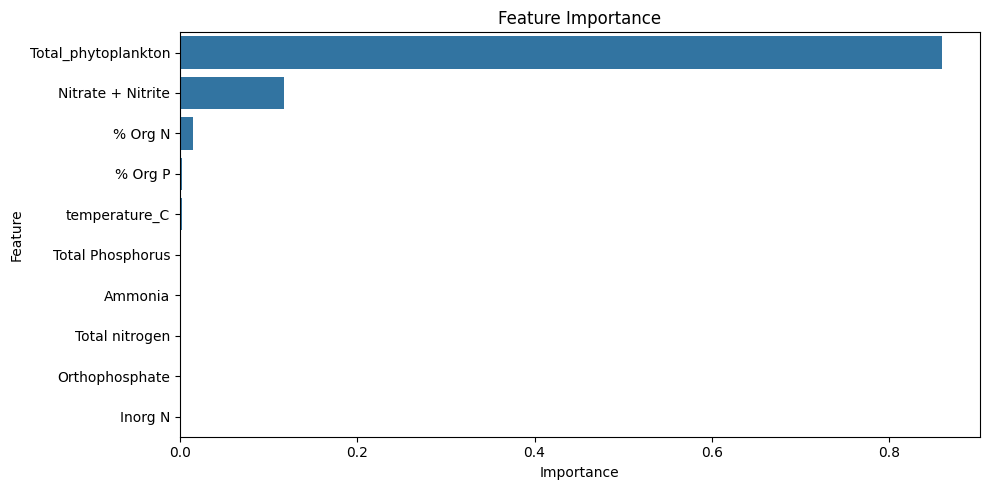

Site 1396085 - MAE: 0.03, RMSE: 0.11, R2: 0.81
Site 1396500 - MAE: 0.12, RMSE: 0.57, R2: 0.06
Site 1396800 - MAE: 4885.77, RMSE: 25809.50, R2: -9688504320.00
Site 1397000 - MAE: 0.08, RMSE: 0.47, R2: 0.32
Site 1401000 - MAE: 0.08, RMSE: 0.53, R2: 0.21
Site 1402000 - MAE: 0.08, RMSE: 0.56, R2: 0.12
Site 1400500 - MAE: 12538.93, RMSE: 62257.88, R2: 0.42
Site 1403060 - MAE: 0.07, RMSE: 0.37, R2: 0.33
Site 1396790 - MAE: 0.02, RMSE: 0.07, R2: 0.41

Summary across all sites:
      site           MAE          RMSE            R2
0  1396085      0.026657      0.110332  8.070806e-01
1  1396500      0.121866      0.566616  5.503729e-02
2  1396800   4885.772949  25809.495307 -9.688504e+09
3  1397000      0.075105      0.469590  3.170470e-01
4  1401000      0.080562      0.525816  2.082547e-01
5  1402000      0.084589      0.559806  1.238517e-01
6  1400500  12538.934570  62257.879180  4.152970e-01
7  1403060      0.074071      0.370675  3.253648e-01
8  1396790      0.017259      0.068534  4.065438

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Ensure date column is parsed correctly
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Handle missing values
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Drop rows with missing important features and target columns
data = data.dropna(subset=important_features + target_columns)

# Feature Engineering: Log transformation on target variables if they are skewed
# Replace infinities with large finite values
data['Total_Cyanobacteria'] = np.log1p(data['Total_Cyanobacteria'].replace([np.inf, -np.inf], np.nan)).fillna(data['Total_Cyanobacteria'].mean())
data['microcystin_total_abraxis_ugL'] = np.log1p(data['microcystin_total_abraxis_ugL'].replace([np.inf, -np.inf], np.nan)).fillna(data['microcystin_total_abraxis_ugL'].mean())


# Scale the features using StandardScaler (you can also use MinMaxScaler if preferred)
scaler = StandardScaler()
data[important_features] = scaler.fit_transform(data[important_features])

# Feature Selection: Keep only the important features for training
X = data[important_features]
y = data[target_columns]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the base XGBoost model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Hyperparameter tuning with RandomizedSearchCV
param_dist = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'n_estimators': [50, 100],
    'subsample': [0.7, 0.8],
    'colsample_bytree': [0.7, 0.8],
    'gamma': [0, 0.1],
    'min_child_weight': [1, 5],
    'reg_alpha': [0, 0.01],
    'reg_lambda': [1, 1.1]
}

# Reduce the number of iterations for faster results
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=5, cv=3, verbose=1, random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Best model after RandomizedSearchCV
best_model = random_search.best_estimator_

# Evaluate the model on test data
y_pred = best_model.predict(X_test)

# Calculate performance metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Optimized Model - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

# Feature importance analysis
feature_importance = best_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': important_features,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 5))
sns.barplot(data=importance_df, x='Importance', y='Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# Store results for all sites (example)
results = []
for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:
        print(f"Skipping site {site} due to insufficient data.")
        continue

    X_site = site_data[important_features]
    y_site = site_data[target_columns]

    X_train_site, X_test_site, y_train_site, y_test_site = train_test_split(X_site, y_site, test_size=0.2, random_state=42)

    best_model.fit(X_train_site, y_train_site)
    y_pred_site = best_model.predict(X_test_site)

    mae_site = mean_absolute_error(y_test_site, y_pred_site)
    rmse_site = np.sqrt(mean_squared_error(y_test_site, y_pred_site))
    r2_site = r2_score(y_test_site, y_pred_site)

    print(f"Site {site} - MAE: {mae_site:.2f}, RMSE: {rmse_site:.2f}, R2: {r2_site:.2f}")
    results.append({'site': site, 'MAE': mae_site, 'RMSE': rmse_site, 'R2': r2_site})

# Summary of results across all sites
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)

Site 1396085 - MAE: 0.02, RMSE: 0.10, R2: 0.85


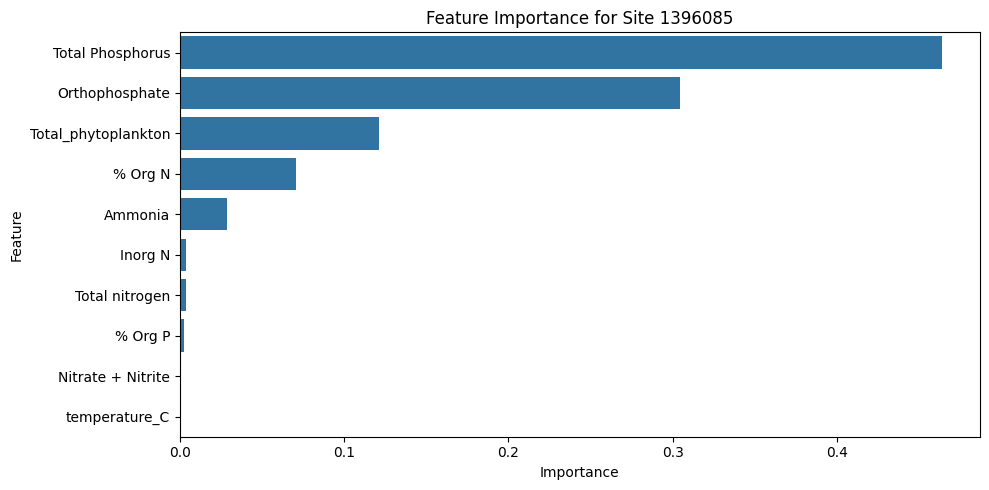

Site 1396500 - MAE: 0.09, RMSE: 0.68, R2: -0.14


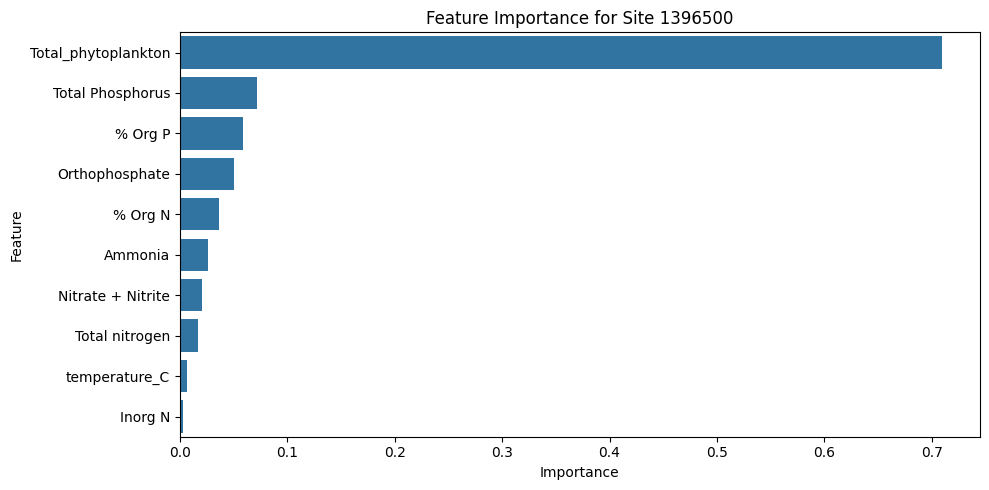

Site 1396800 - MAE: 0.03, RMSE: 0.24, R2: 0.13


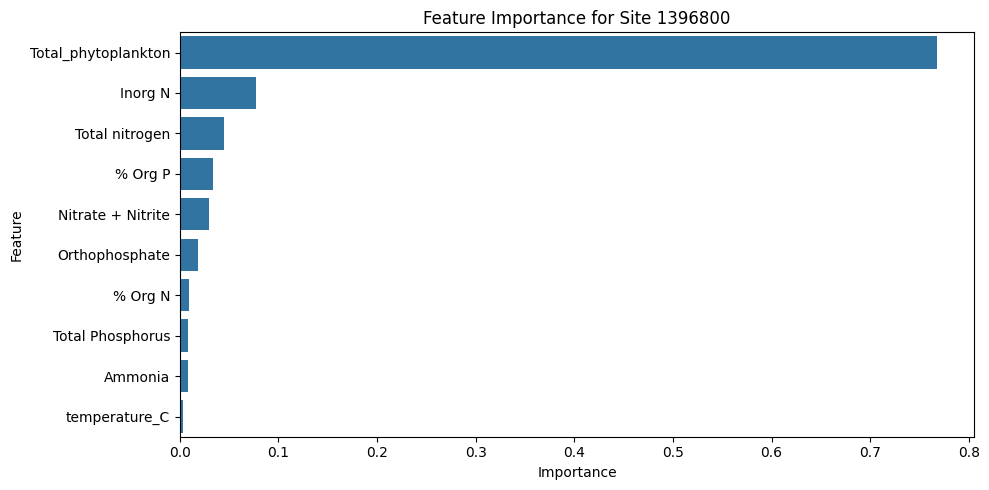

Site 1397000 - MAE: 0.07, RMSE: 0.45, R2: 0.33


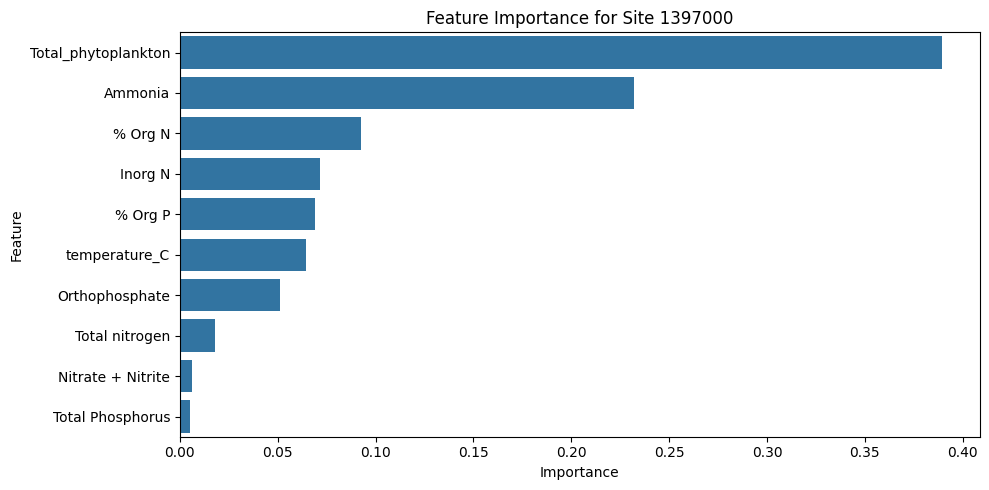

Site 1401000 - MAE: 0.06, RMSE: 0.49, R2: 0.25


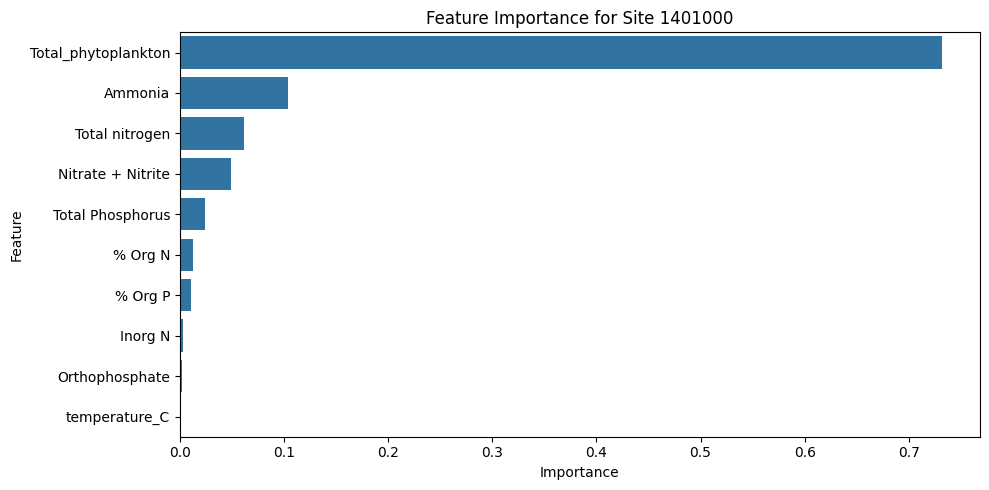

Site 1402000 - MAE: 0.08, RMSE: 0.43, R2: 0.28


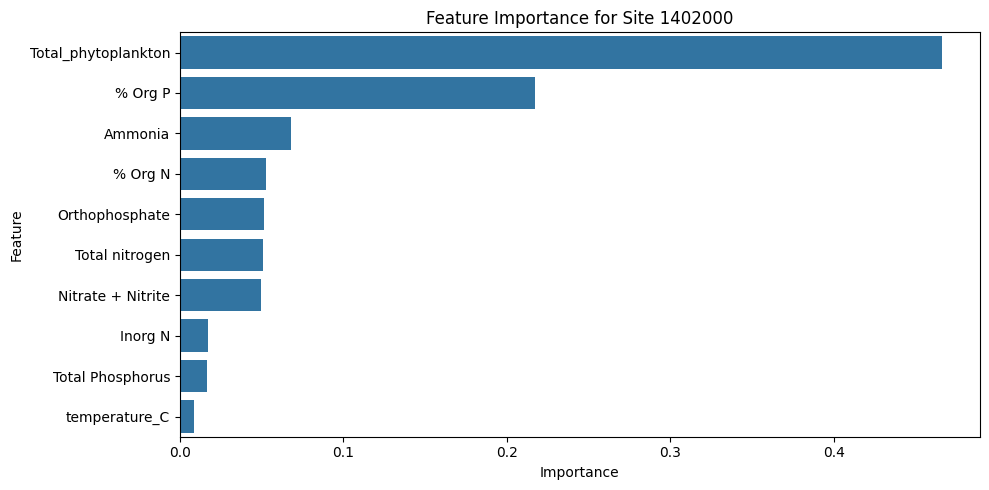

Skipping site 1400500 due to insufficient data.
Site 1403060 - MAE: 0.06, RMSE: 0.28, R2: 0.40


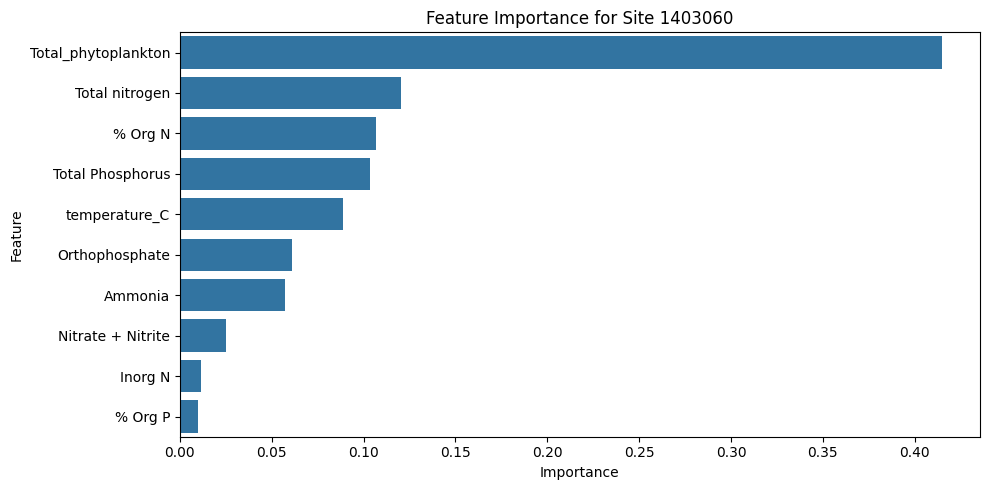

Site 1396790 - MAE: 0.01, RMSE: 0.06, R2: 0.45


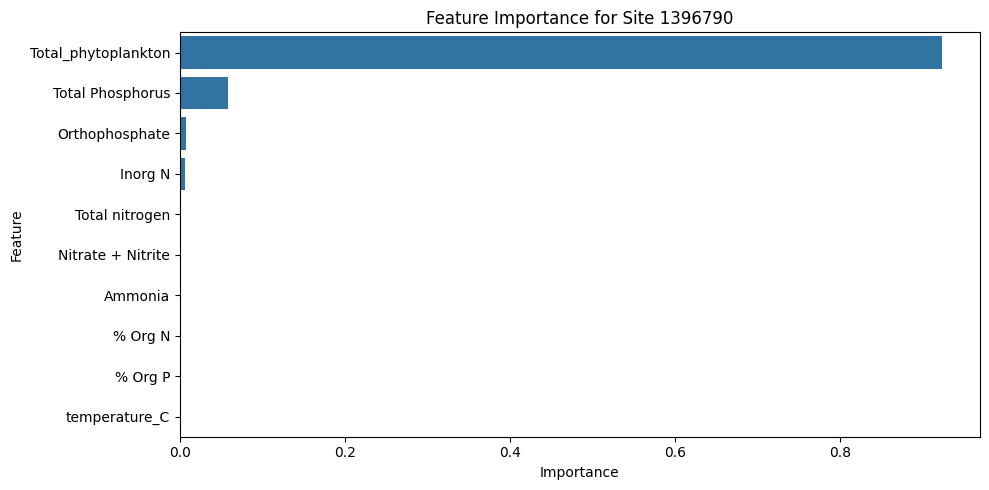


Summary across all sites:
      site       MAE      RMSE        R2
0  1396085  0.023325  0.097744  0.852713
1  1396500  0.093084  0.677264 -0.135715
2  1396800  0.034007  0.244386  0.134275
3  1397000  0.066968  0.453666  0.327907
4  1401000  0.058117  0.485480  0.251302
5  1402000  0.082034  0.426974  0.278432
6  1403060  0.057051  0.282507  0.398561
7  1396790  0.013226  0.055660  0.453990


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')

# Parse datetime column
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Target and important features
important_features = [
    'Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
    'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C'
]
target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Optional: Apply log transformation to target columns to reduce skewness (if needed)
data[target_columns] = data[target_columns].apply(lambda x: np.log1p(x))

# Initialize results list
results = []

# Loop through each site
for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].dropna(subset=important_features + target_columns)

    if site_data.shape[0] < 50:  # Skip site if there is insufficient data
        print(f"Skipping site {site} due to insufficient data.")
        continue

    # Select features and target
    X = site_data[important_features]
    y = site_data[target_columns]

    # Split into training and testing sets (80-20 split)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize and train XGBoost model (MultiOutputRegressor to handle multiple targets)
    model = xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )

    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"Site {site} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R2: {r2:.2f}")

    # Store results for each site
    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

    # Plot feature importance for the model
    feature_importance = model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': important_features,
        'Importance': feature_importance
    }).sort_values(by='Importance', ascending=False)

    # Plot the feature importances
    plt.figure(figsize=(10, 5))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for Site {site}')
    plt.tight_layout()
    plt.show()

# Convert results to a DataFrame and summarize
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df)


In [ ]:
df.columns


Index(['site_no', 'site_abbreviation', 'Individual', 'sample_time',
       'microcystin_total_abraxis_ugL', 'Ammonia', 'Nitrate + Nitrite',
       'Orthophosphate', 'Total nitrogen', 'Total Phosphorus', 'Inorg N',
       '% Org N', '% Org P', 'Total_Cyanobacteria', 'Total_phytoplankton',
       'temperature_C'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# Load data
data = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')
data['dateTime'] = pd.to_datetime(data['dateTime'])

# Important features
base_features = ['Total_phytoplankton', 'Orthophosphate', 'Ammonia', 'Total Phosphorus',
                 'Total nitrogen', '% Org P', '% Org N', 'Nitrate + Nitrite', 'Inorg N', 'temperature_C']

target_columns = ['Total_Cyanobacteria', 'microcystin_total_abraxis_ugL']

# Function to create lag and rolling features
def create_time_features(df, features, lags=[1,2], windows=[3,7]):
    df = df.copy()
    for f in features:
        for lag in lags:
            df[f'{f}_lag{lag}'] = df[f].shift(lag)
        for win in windows:
            df[f'{f}_rollmean{win}'] = df[f].rolling(window=win).mean()
            df[f'{f}_rollstd{win}'] = df[f].rolling(window=win).std()
    return df

# Final results
results = []

for site in data['site_no'].unique():
    site_data = data[data['site_no'] == site].sort_values('dateTime').reset_index(drop=True)
    site_data = create_time_features(site_data, base_features)
    site_data = site_data.dropna()

    X = site_data.drop(columns=['site_no', 'site_abbreviation', 'Individual', 'sample_time', 'dateTime'] + target_columns)
    y = site_data[target_columns]

    # Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)

    # Model
    model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=1000, learning_rate=0.03, max_depth=6)
    eval_set = [(X_train, y_train[target_columns[0]]), (X_test, y_test[target_columns[0]])]

    # Use the eval_set parameter for early stopping in xgb.XGBRegressor.fit()
    model.fit(X_train, y_train[target_columns[0]],
              eval_set=eval_set,
              # early_stopping_rounds=25, # Remove this line
              verbose=False)

    # Predict and evaluate
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test[target_columns[0]], y_pred)
    rmse = np.sqrt(mean_squared_error(y_test[target_columns[0]], y_pred))
    r2 = r2_score(y_test[target_columns[0]], y_pred)

    results.append({'site': site, 'MAE': mae, 'RMSE': rmse, 'R2': r2})

# Summary
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df.sort_values('R2', ascending=False))


Summary across all sites:
      site            MAE           RMSE         R2
2  1396800     657.702286    3176.049951   0.896212
3  1397000     368.797197    1528.957634   0.873889
8  1396790  100908.281179  842352.173618   0.846772
4  1401000      93.043395     500.422442   0.664565
5  1402000     172.451275     608.903793   0.245881
0  1396085    5122.889609   24240.146143   0.233653
6  1400500     105.687289     435.393394  -1.285479
7  1403060     135.419923     667.660744  -2.283341
1  1396500     118.605258     686.088609 -12.044850


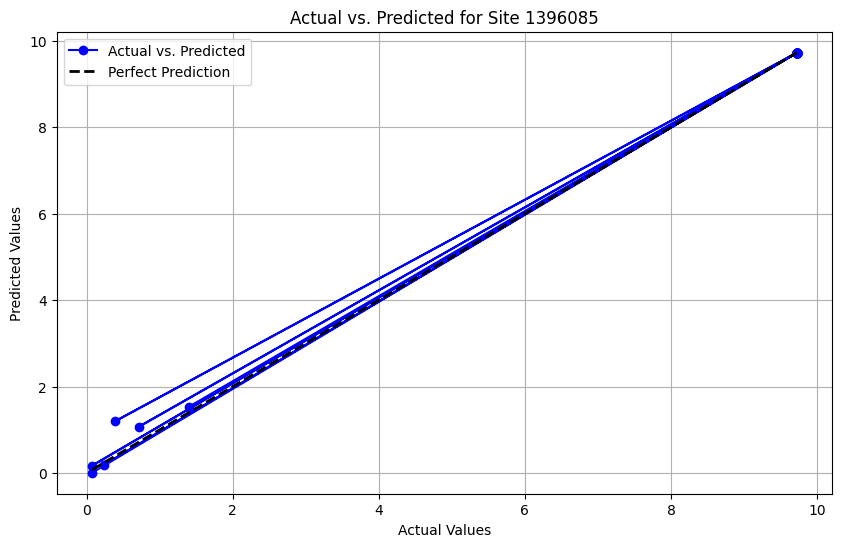

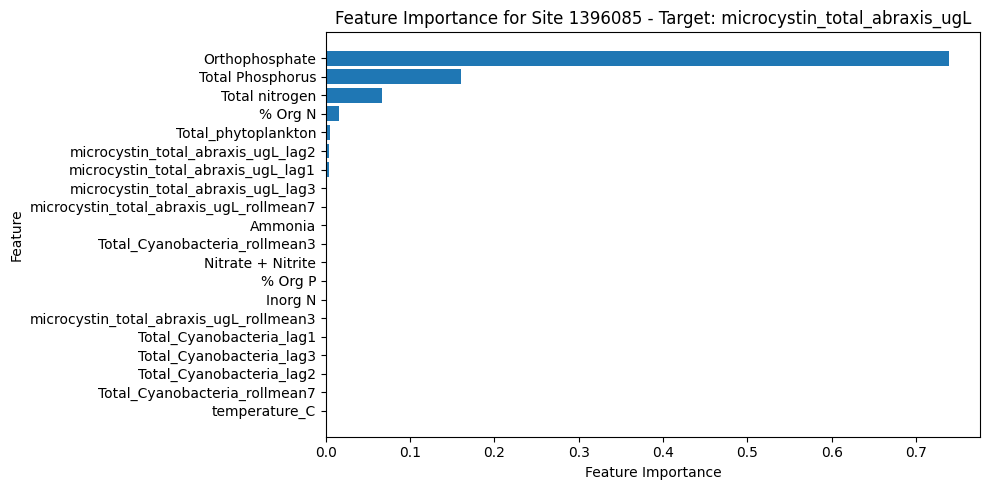

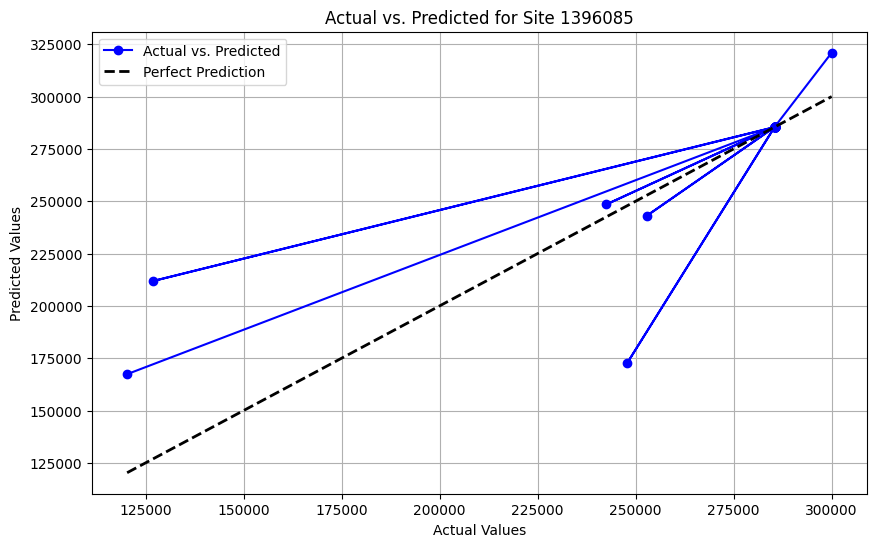

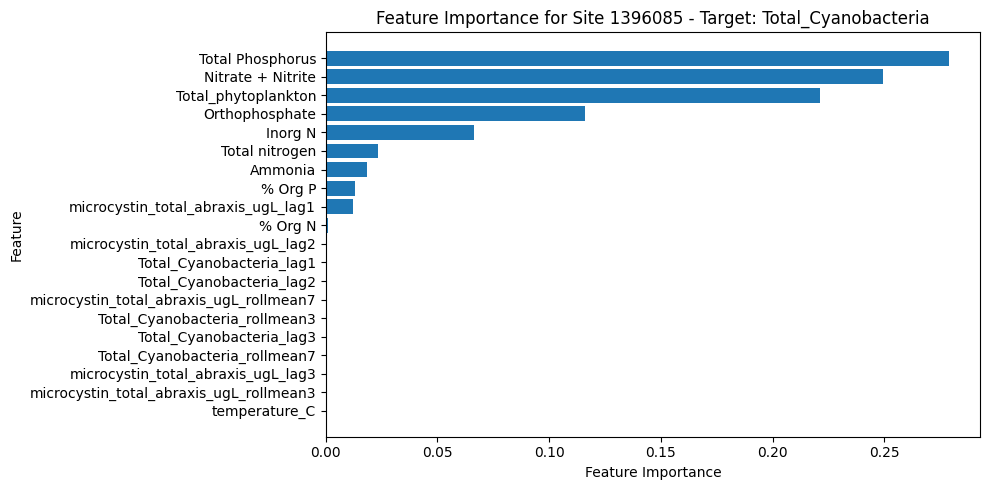

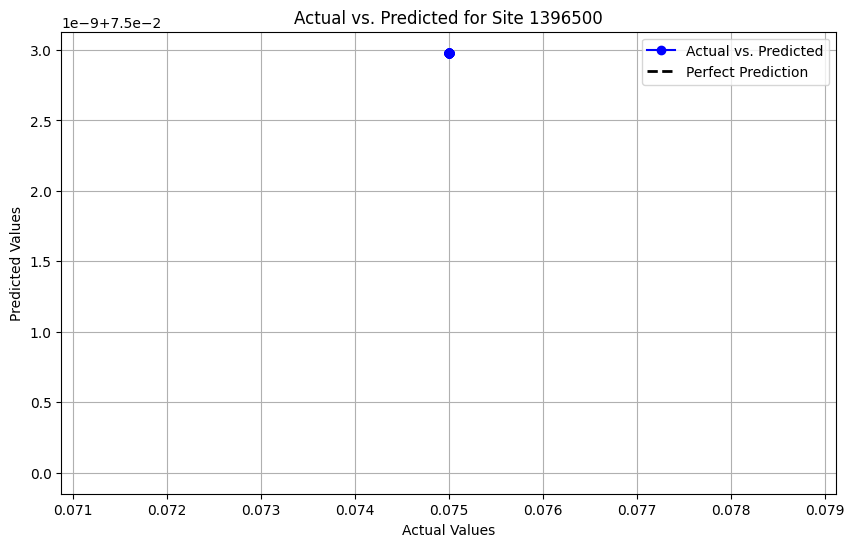

...

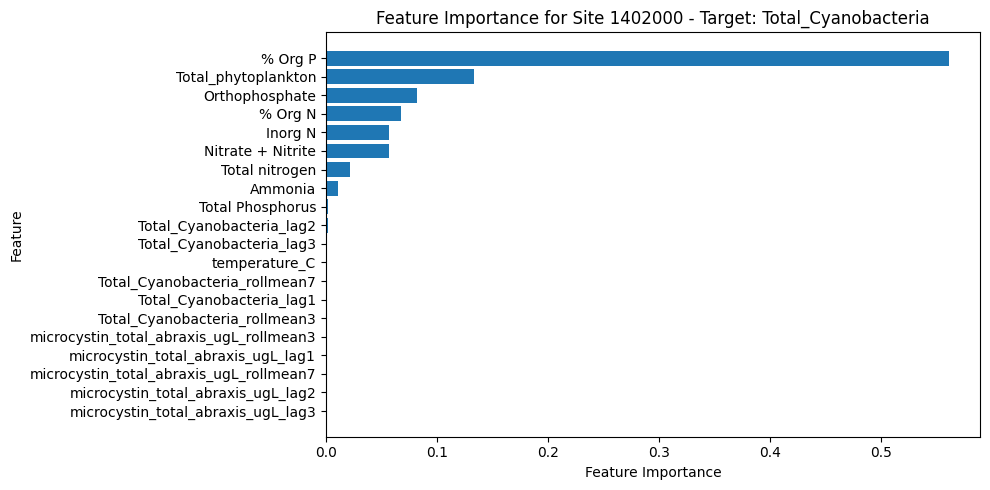

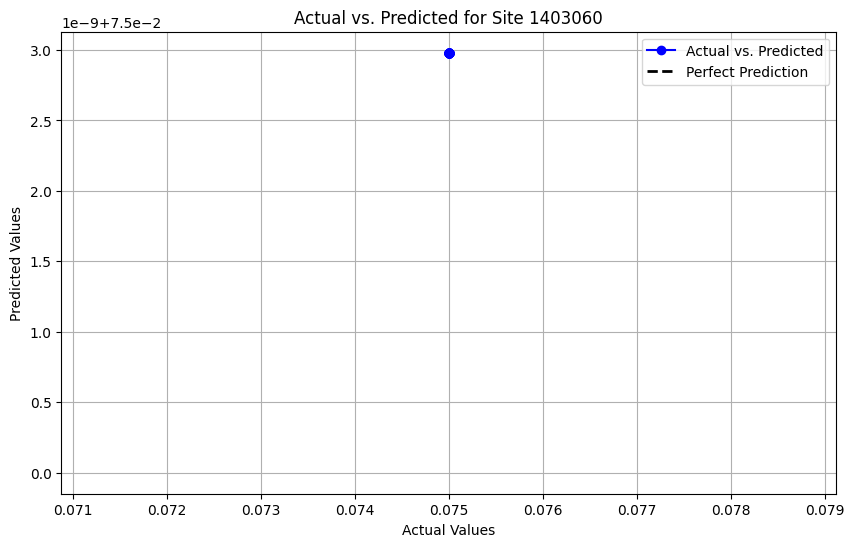

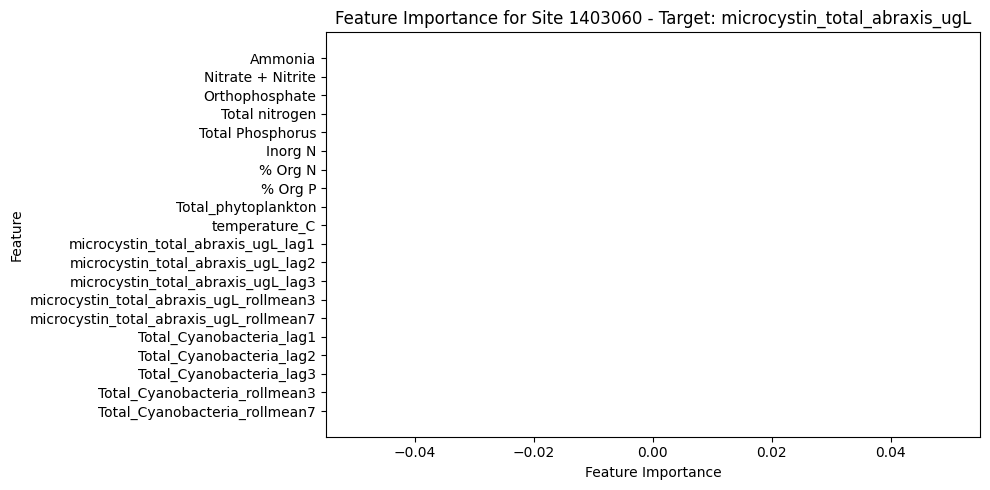

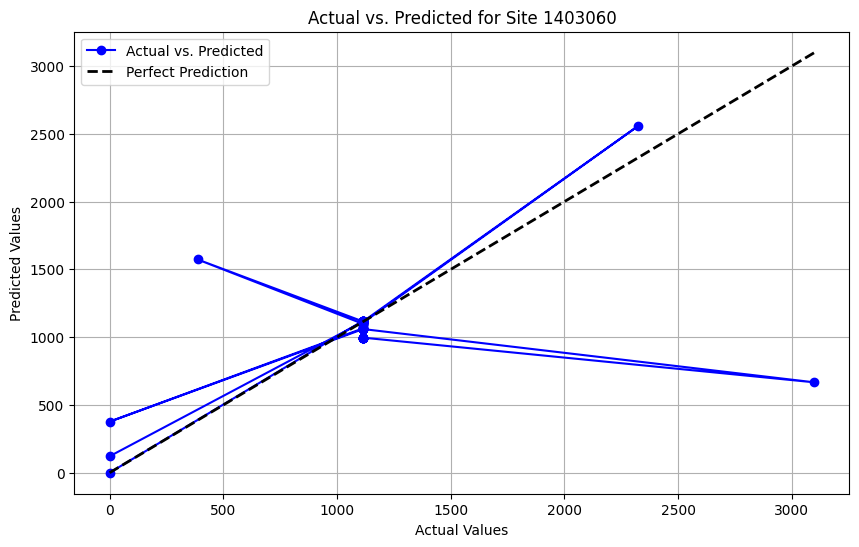

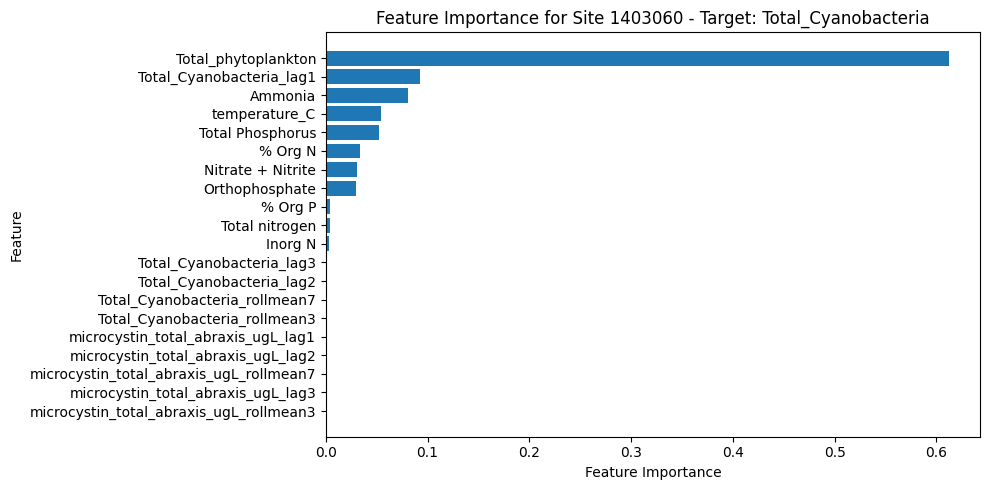


Summary across all sites:
                        MAE                                              RMSE  \
target  Total_Cyanobacteria microcystin_total_abraxis_ugL Total_Cyanobacteria   
site                                                                            
1396085         3442.176853                  2.178146e-02        14846.275983   
1396500           88.017852                  2.980232e-09          409.857230   
1396790       102095.504814                  4.699814e-03       835773.100864   
1396800          714.711704                  7.552694e-03         3190.550364   
1397000          577.477178                  1.233617e-03         3112.952673   
1400500          151.559056                  2.980232e-09          214.761022   
1401000           26.141501                  1.298690e-04          104.920828   
1402000           82.940428                  7.255830e-04          424.981874   
1403060           90.520573                  2.980232e-09          329.679362   



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Load data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Log transform targets
df['log_microcystin'] = np.log1p(df['microcystin_total_abraxis_ugL'])
df['log_cyano'] = np.log1p(df['Total_Cyanobacteria'])

# Create lag and rolling features
def create_features(df, lags=[1, 2, 3], windows=[3, 7]):
    for col in ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']:
        for lag in lags:
            df[f'{col}_lag{lag}'] = df.groupby('site_no')[col].shift(lag)
        for window in windows:
            df[f'{col}_rollmean{window}'] = df.groupby('site_no')[col].shift(1).rolling(window).mean().reset_index(level=0, drop=True)
    return df

df = create_features(df)

# Clip outliers
def clip_outliers(df, columns, quantile=0.01):
    for col in columns:
        lower = df[col].quantile(quantile)
        upper = df[col].quantile(1 - quantile)
        df[col] = df[col].clip(lower, upper)
    return df

columns_to_clip = ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']
df = clip_outliers(df, columns_to_clip)

# Normalize features site-wise
features = [
    'Ammonia', 'Nitrate + Nitrite', 'Orthophosphate', 'Total nitrogen',
    'Total Phosphorus', 'Inorg N', '% Org N', '% Org P',
    'Total_phytoplankton', 'temperature_C'
] + [col for col in df.columns if 'lag' in col or 'rollmean' in col]

def normalize_sitewise(df, features):
    for site in df['site_no'].unique():
        scaler = StandardScaler()
        idx = df['site_no'] == site
        df.loc[idx, features] = scaler.fit_transform(df.loc[idx, features])
    return df

df = normalize_sitewise(df, features)

# Drop rows with NaNs (from lag/rolling)
df = df.dropna().reset_index(drop=True)

# Modeling pipeline
results = []

for site in df['site_no'].unique():
    site_df = df[df['site_no'] == site]

    for target, log_target in [('microcystin_total_abraxis_ugL', 'log_microcystin'), ('Total_Cyanobacteria', 'log_cyano')]:
        X = site_df[features]
        y = site_df[log_target]

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, shuffle=False
        )

        model = XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=4, subsample=0.8, colsample_bytree=0.8, random_state=42)
        model.fit(X_train, y_train,
                  eval_set=[(X_test, y_test)],
                  verbose=False)

        y_pred_log = model.predict(X_test)
        y_pred = np.expm1(y_pred_log)
        y_true = np.expm1(y_test)
        #actual vs predicted grapgh



        # Assuming 'site' is the variable containing the site number
        plt.figure(figsize=(10, 6))
        plt.plot(y_true, y_pred, marker='o', linestyle='-', color='blue', label='Actual vs. Predicted')
        plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=2, label='Perfect Prediction')
        plt.title(f'Actual vs. Predicted for Site {site}')
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.legend()
        plt.grid(True)
        plt.show()

        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)

        results.append({
            'site': site,
            'target': target,
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        })
        # Feature importance plotting for each site and target
        feature_importance = model.feature_importances_
        importance_df = pd.DataFrame({
            'Feature': features,
            'Importance': feature_importance
        }).sort_values(by='Importance', ascending=False)

        plt.figure(figsize=(10, 5))
        plt.barh(importance_df['Feature'], importance_df['Importance'])
        plt.xlabel('Feature Importance')
        plt.ylabel('Feature')
        plt.title(f'Feature Importance for Site {site} - Target: {target}')
        plt.gca().invert_yaxis()  # Invert y-axis for better readability
        plt.tight_layout()
        plt.show()

# Display results
results_df = pd.DataFrame(results)
print("\nSummary across all sites:")
print(results_df.pivot(index='site', columns='target', values=['MAE', 'RMSE', 'R2']))


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Load data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Log transform targets
df['log_microcystin'] = np.log1p(df['microcystin_total_abraxis_ugL'])
df['log_cyano'] = np.log1p(df['Total_Cyanobacteria'])

# Create lag and rolling features
def create_features(df, lags=[1, 2, 3], windows=[3, 7]):
    for col in ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']:
        for lag in lags:
            df[f'{col}_lag{lag}'] = df.groupby('site_no')[col].shift(lag)
        for window in windows:
            df[f'{col}_rollmean{window}'] = df.groupby('site_no')[col].shift(1).rolling(window).mean().reset_index(level=0, drop=True)
    return df

df = create_features(df)

# Clip outliers
def clip_outliers(df, columns, quantile=0.01):
    for col in columns:
        lower = df[col].quantile(quantile)
        upper = df[col].quantile(1 - quantile)
        df[col] = df[col].clip(lower, upper)
    return df

columns_to_clip = ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']
df = clip_outliers(df, columns_to_clip)

# Normalize features site-wise
features = [
    'Ammonia', 'Nitrate + Nitrite', 'Orthophosphate', 'Total nitrogen',
    'Total Phosphorus', 'Inorg N', '% Org N', '% Org P',
    'Total_phytoplankton', 'temperature_C'
] + [col for col in df.columns if 'lag' in col or 'rollmean' in col]

def normalize_sitewise(df, features):
    for site in df['site_no'].unique():
        scaler = StandardScaler()
        idx = df['site_no'] == site
        df.loc[idx, features] = scaler.fit_transform(df.loc[idx, features])
    return df

df = normalize_sitewise(df, features)

# Drop rows with NaNs (from lag/rolling)
df = df.dropna().reset_index(drop=True)

# Train on data up until August 2021
df_train = df[df['dateTime'] < '2021-09-01']

# Forecasting pipeline for the next 30 days (for September 2021)
forecast_horizon = 30
results = []

for site in df_train['site_no'].unique():
    site_df = df_train[df_train['site_no'] == site]

    # Loop through each target (Microcystin and Cyanobacteria)
    for target, log_target in [('microcystin_total_abraxis_ugL', 'log_microcystin'), ('Total_Cyanobacteria', 'log_cyano')]:
        X = site_df[features]
        y = site_df[log_target]

        # Split the data (we use only historical data for training)
        X_train = X
        y_train = y

        model = XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=4, subsample=0.8, colsample_bytree=0.8, random_state=42)
        model.fit(X_train, y_train)

        # Forecast the next 30 days (September 2021)
        # We take the last row as the starting point for the forecast
        last_row = site_df.tail(1)
        forecast_data = last_row[features].copy()

        forecast_predictions = []
        for _ in range(forecast_horizon):
            forecast_pred = model.predict(forecast_data)
            forecast_predictions.append(forecast_pred[0])

            # Append the forecasted value to the data for the next day
            # Update: Use .values to get a NumPy array and then assign
            forecast_data[features] = np.roll(forecast_data[features].values, shift=1, axis=0)
            forecast_data[features].iloc[0] = forecast_pred[0] # Update: Access the first element of forecast_pred

        forecast_predictions_exp = np.expm1(forecast_predictions)

        # Save results
        results.append({
            'site': site,
            'target': target,
            'forecasted_values': forecast_predictions_exp.tolist()
        })

# Display forecast results
forecast_df = pd.DataFrame(results)
forecast_df.to_csv('forecast_results_xboost.csv', index=False)
print(forecast_df.head())

      site                         target  \
0  1396085  microcystin_total_abraxis_ugL   
1  1396085            Total_Cyanobacteria   
2  1396500  microcystin_total_abraxis_ugL   
3  1396500            Total_Cyanobacteria   
4  1396790  microcystin_total_abraxis_ugL   

                                   forecasted_values  
0  [1.4013338088989258, 1.4013338088989258, 1.401...  
1  [300033.375, 300033.375, 300033.375, 300033.37...  
2  [0.07500000298023224, 0.07500000298023224, 0.0...  
3  [1237.531494140625, 1237.531494140625, 1237.53...  
4  [0.07523724436759949, 0.07523724436759949, 0.0...  


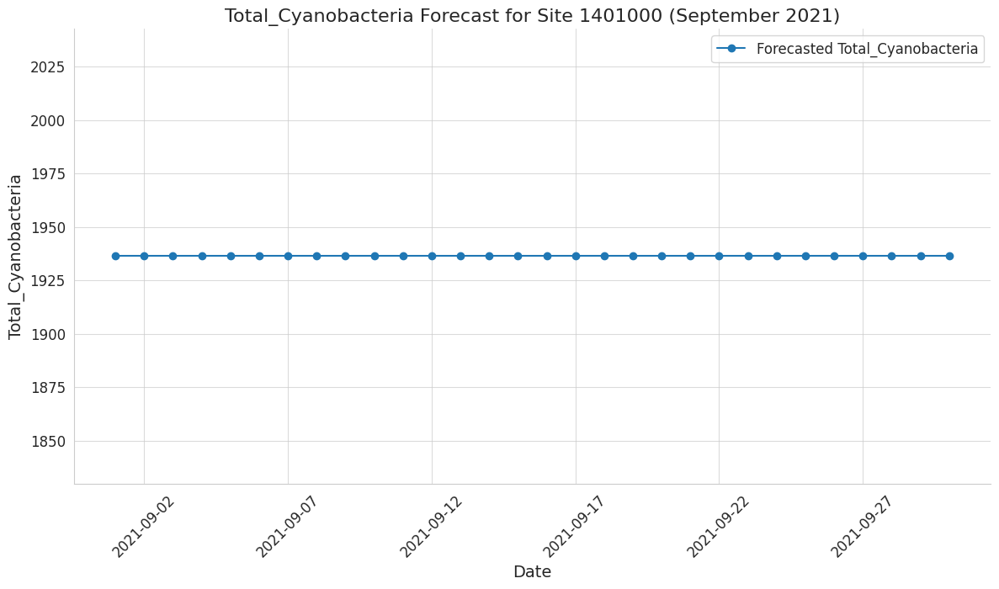

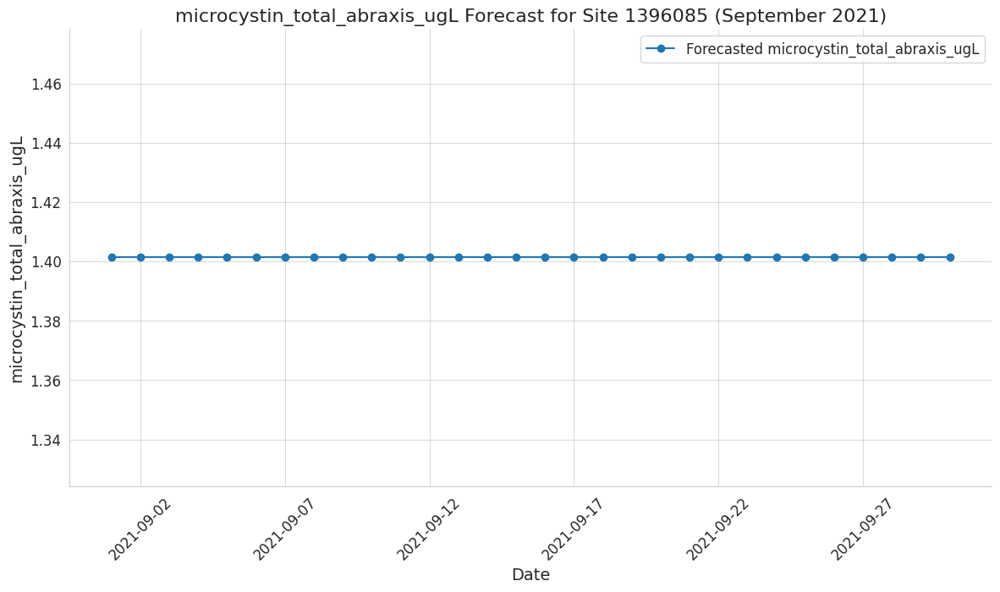

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# Set Seaborn style for better aesthetics
sns.set_style("whitegrid")

# Define specific sites and targets
site_target_mapping = {
    1401000: 'Total_Cyanobacteria',
    1396085: 'microcystin_total_abraxis_ugL'
}

# Visualize forecast for specified sites and targets
for site, target in site_target_mapping.items():
    site_forecast = forecast_df[(forecast_df['site'] == site) & (forecast_df['target'] == target)]

    if site_forecast.empty:
        print(f"No forecast data found for site {site} and target {target}.")
        continue

    forecast_values = site_forecast['forecasted_values'].values[0]
    forecast_dates = pd.date_range(start='2021-09-01', periods=30, freq='D')

    # Plotting with improved aesthetics
    fig, ax = plt.subplots(figsize=(12, 6))  # Larger figure size

    # Format x-axis as dates
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=5))  # Show ticks every 5 days
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Date format

    #Prevent overlapping labels
    plt.tight_layout() # Changed from fig.autoset_tight_layout(True) to plt.tight_layout()

    ax.plot(forecast_dates, forecast_values, marker='o', linestyle='-', color='tab:blue', label=f'Forecasted {target}')

    ax.set_title(f'{target} Forecast for Site {site} (September 2021)', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel(f'{target}', fontsize=14)

    ax.tick_params(axis='x', rotation=45, labelsize=12)  # Rotate x-axis labels
    ax.tick_params(axis='y', labelsize=12)  # Adjust y-axis label size

    ax.grid(True, alpha=0.7)  # Lighter grid
    ax.legend(fontsize=12)  # Adjust legend font size

    sns.despine()  # Remove top and right spines for a cleaner look


    plt.show()

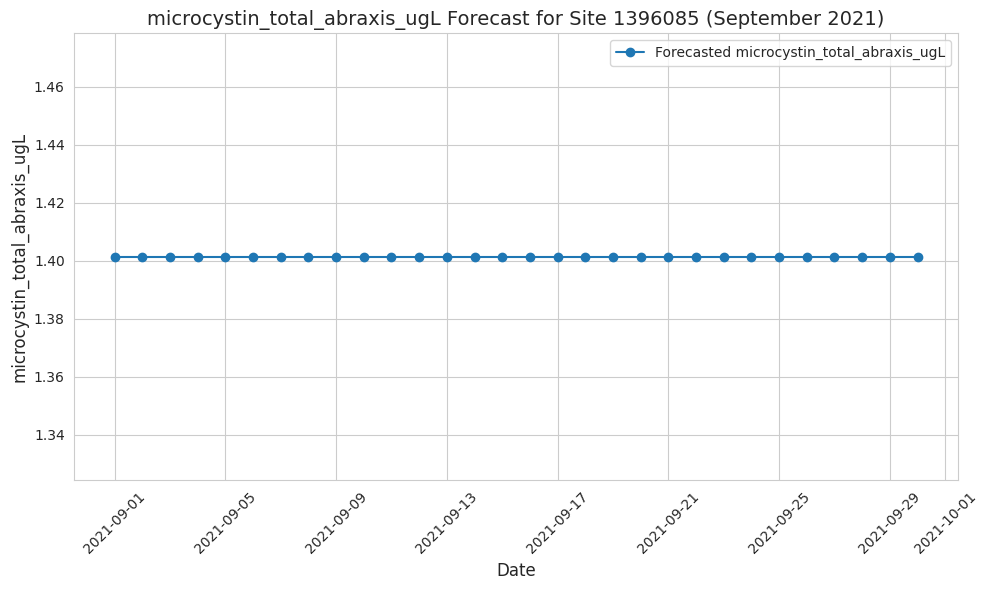

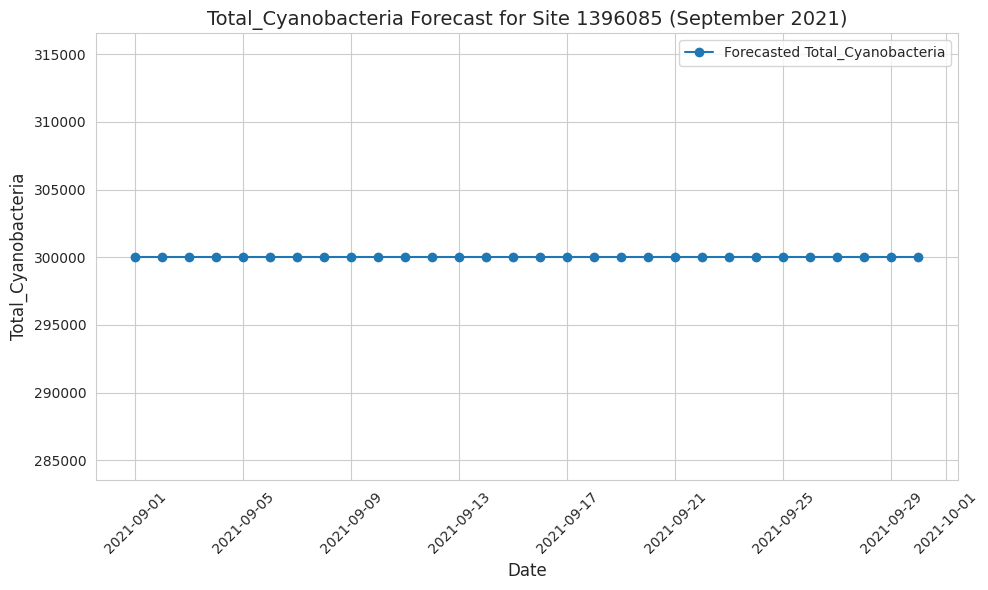

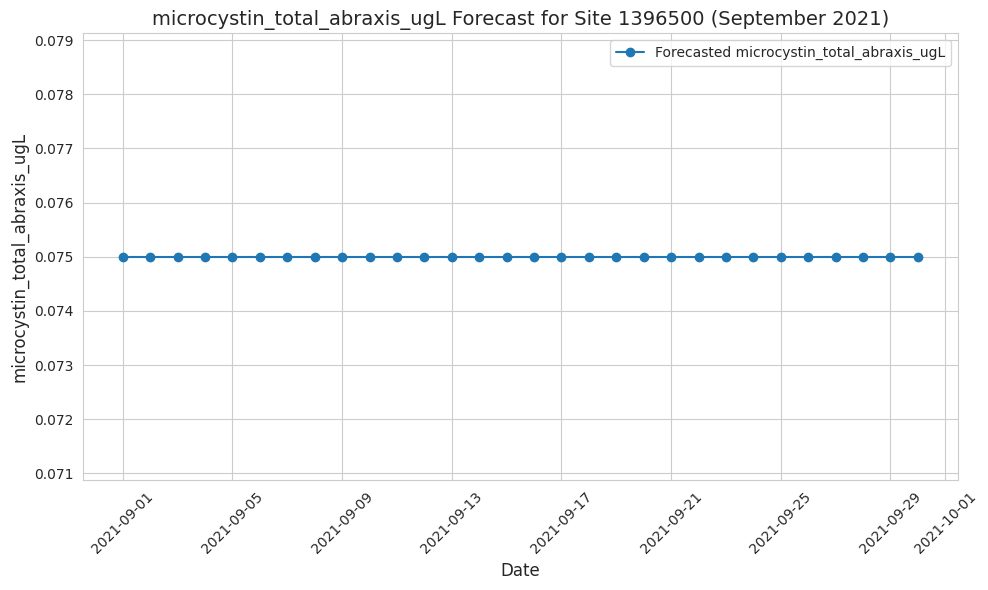

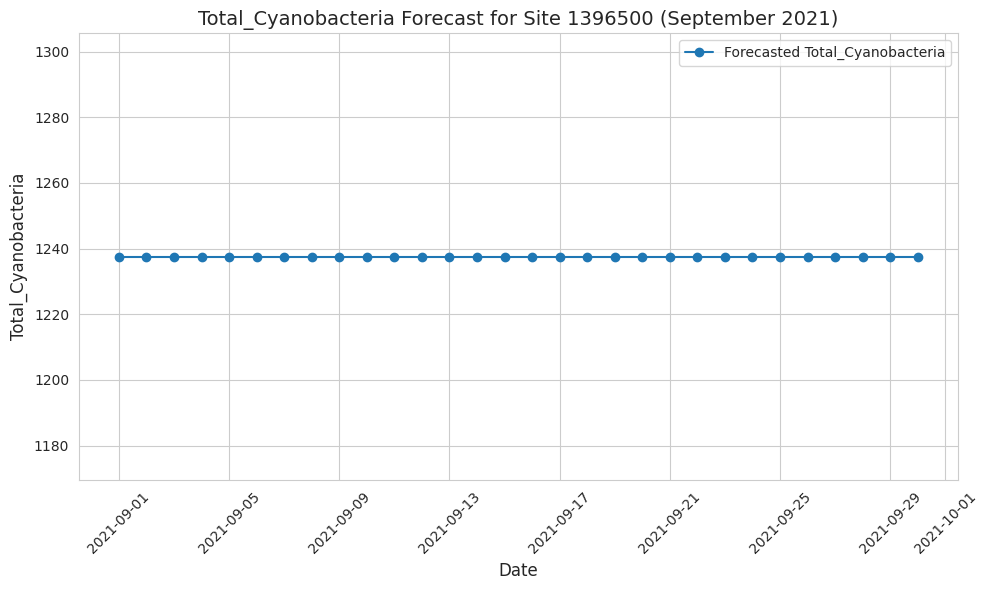

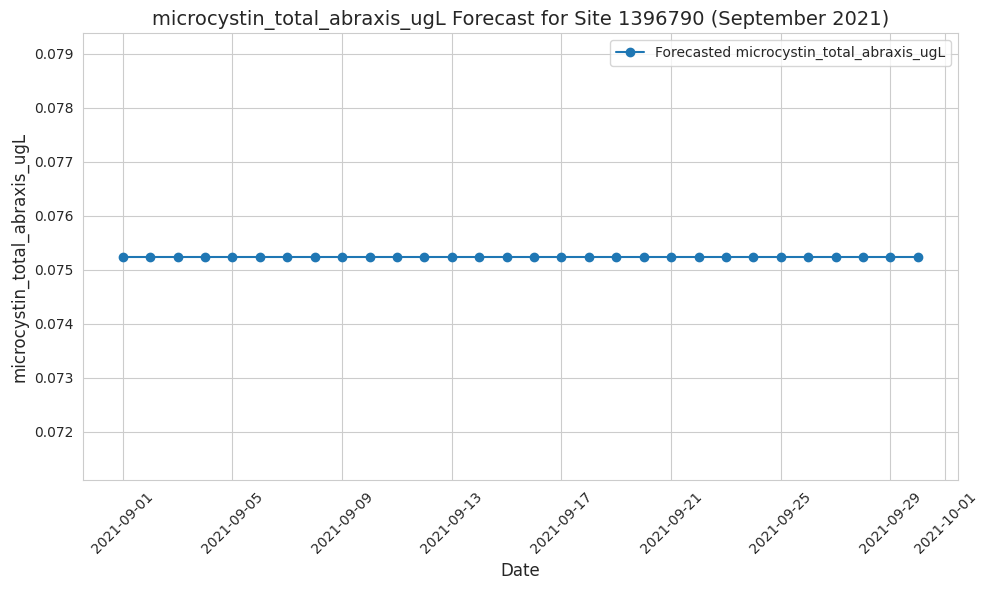

...

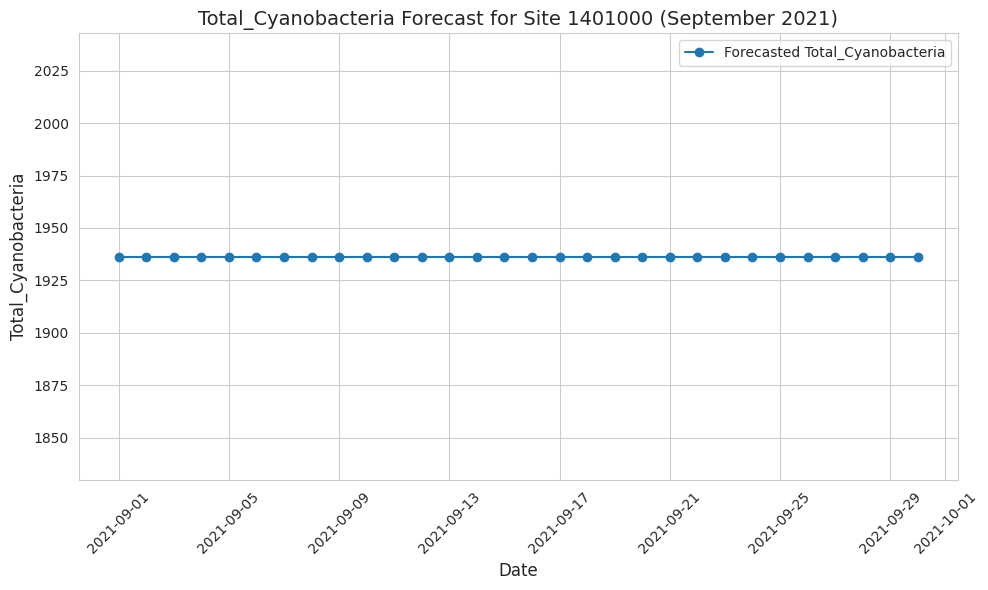

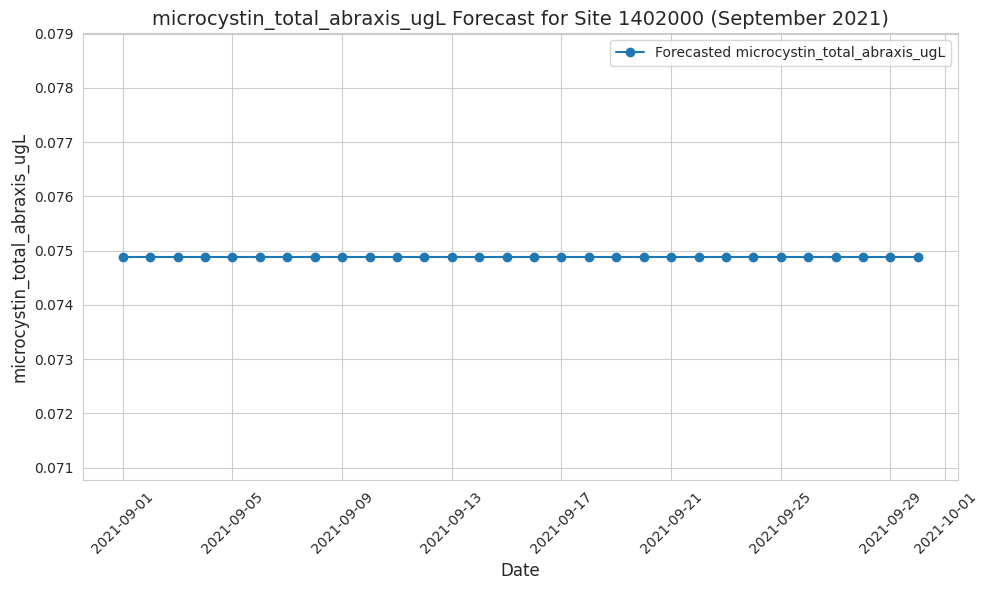

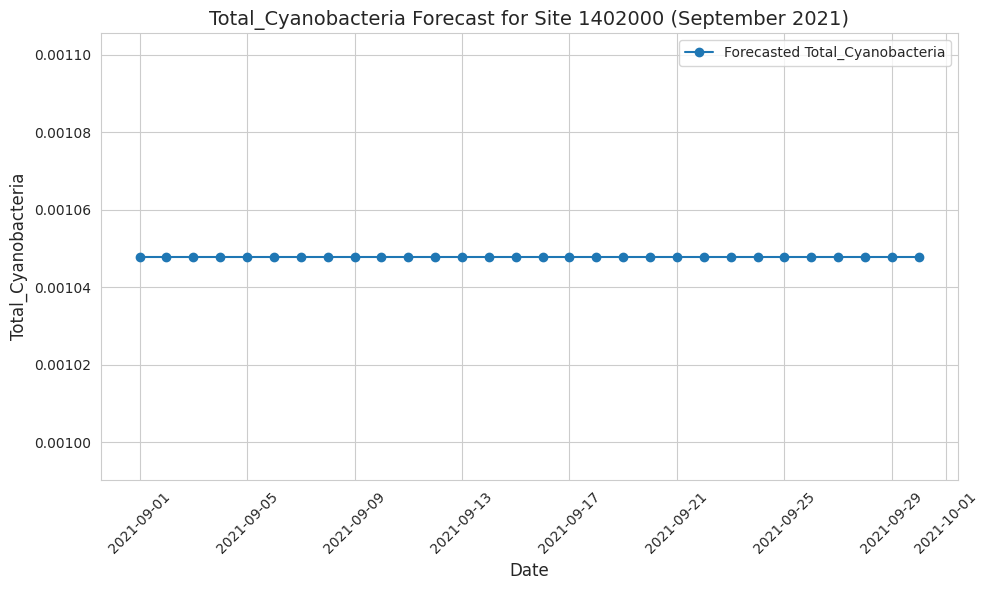

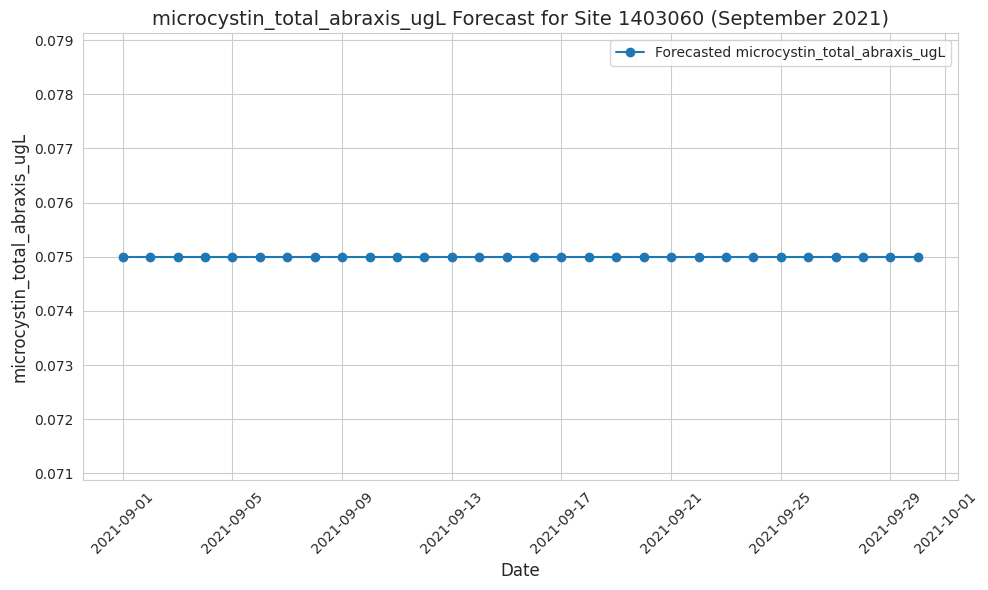

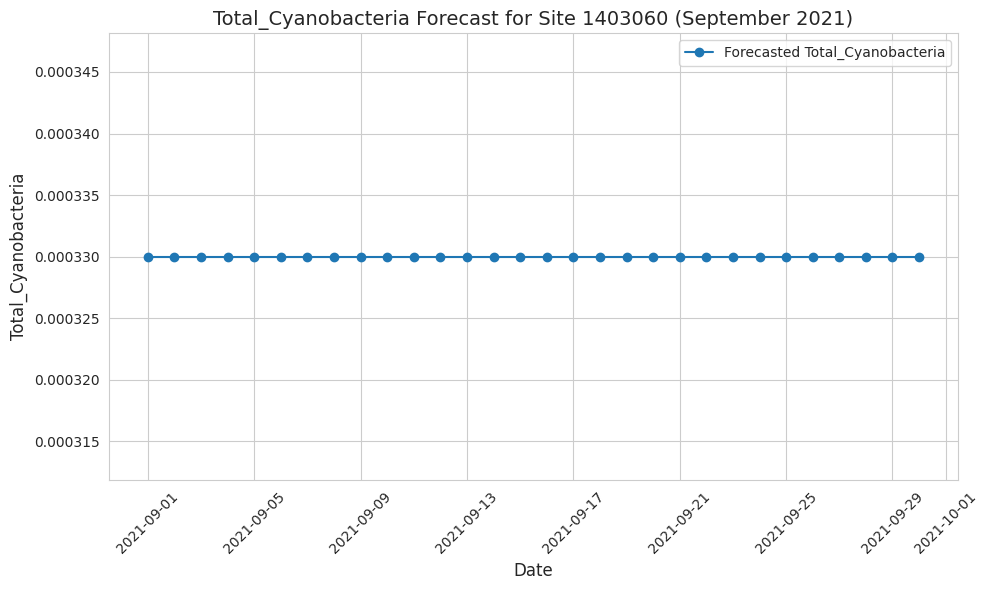

In [ ]:
import matplotlib.pyplot as plt

# Visualize forecast for each site and target
for site in forecast_df['site'].unique():
    site_forecast = forecast_df[forecast_df['site'] == site]

    for target in ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']:
        # Get forecasted values
        forecast_values = site_forecast[site_forecast['target'] == target]['forecasted_values'].values[0]

        # Create date range for the forecast (next 30 days in September 2021)
        forecast_dates = pd.date_range(start='2021-09-01', periods=30, freq='D')

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(forecast_dates, forecast_values, marker='o', label=f'Forecasted {target}', color='tab:blue')
        plt.title(f'{target} Forecast for Site {site} (September 2021)', fontsize=14)
        plt.xlabel('Date', fontsize=12)
        plt.ylabel(f'{target}', fontsize=12)
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()


In [ ]:
!pip uninstall fbprophet
!pip install prophet


DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/wncs0t_r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/olxx6qfe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72357', 'data', 'file=/tmp/tmp624w3uwe/wncs0t_r.json', 'init=/tmp/tmp624w3uwe/olxx6qfe.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelf0j4llzx/prophet_model-20250421123622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:36:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:36:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/daixgsl3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/5vrvxw7c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

<Figure size 1000x600 with 0 Axes>

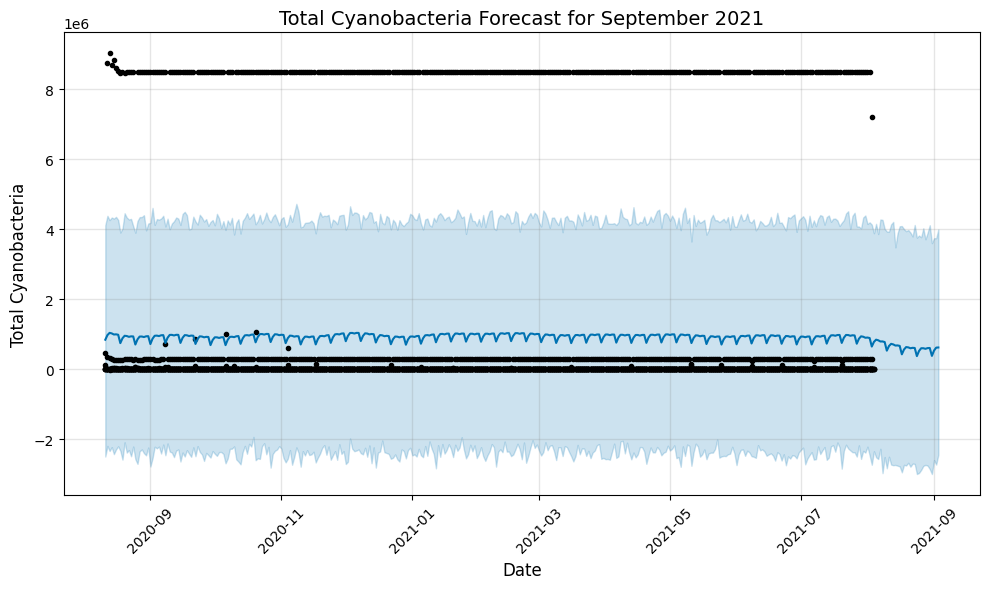

<Figure size 1000x600 with 0 Axes>

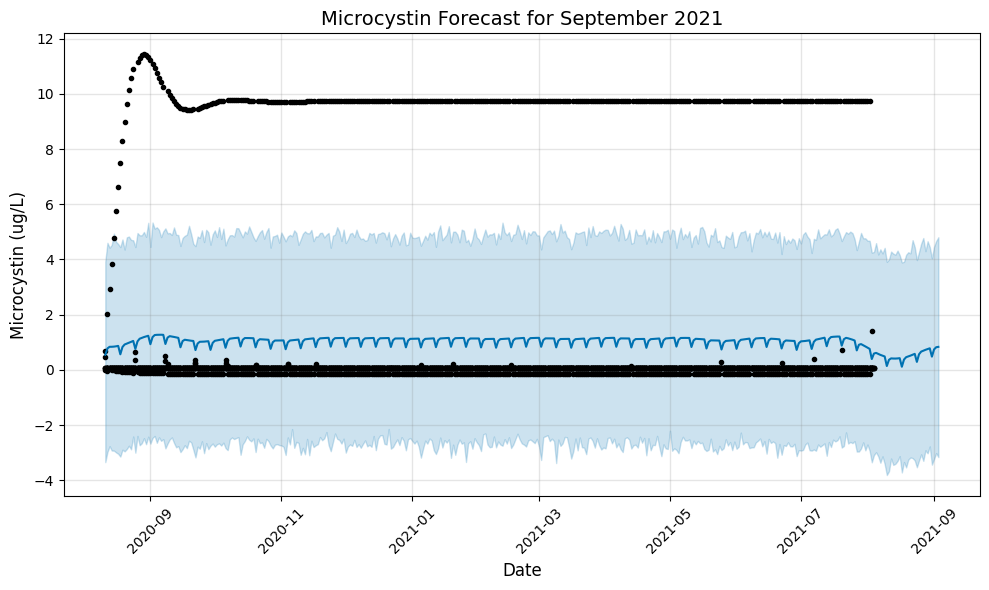

In [ ]:
from prophet import Prophet
import matplotlib.pyplot as plt
import pandas as pd

# Prepare the data for Prophet
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv')
df['dateTime'] = pd.to_datetime(df['dateTime'])
df_cyano = df[['dateTime', 'Total_Cyanobacteria']].rename(columns={'dateTime': 'ds', 'Total_Cyanobacteria': 'y'})
df_microcystin = df[['dateTime', 'microcystin_total_abraxis_ugL']].rename(columns={'dateTime': 'ds', 'microcystin_total_abraxis_ugL': 'y'})

# Fit Prophet model for Total Cyanobacteria
cyano_model = Prophet(daily_seasonality=True, yearly_seasonality=True)
cyano_model.fit(df_cyano)

# Create future dataframe for next 30 days (September 2021)
# The following line has been corrected:
future_cyano = cyano_model.make_future_dataframe(periods=30, freq='D')
forecast_cyano = cyano_model.predict(future_cyano)

# Fit Prophet model for Microcystin
microcystin_model = Prophet(daily_seasonality=True, yearly_seasonality=True)
microcystin_model.fit(df_microcystin)

# Create future dataframe for next 30 days (September 2021)
future_microcystin = microcystin_model.make_future_dataframe(periods=30, freq='D')
forecast_microcystin = microcystin_model.predict(future_microcystin)

# Visualize forecast for Total Cyanobacteria
plt.figure(figsize=(10, 6))
cyano_model.plot(forecast_cyano)
plt.title('Total Cyanobacteria Forecast for September 2021', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Total Cyanobacteria', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualize forecast for Microcystin
plt.figure(figsize=(10, 6))
microcystin_model.plot(forecast_microcystin)
plt.title('Microcystin Forecast for September 2021', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Microcystin (ug/L)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/zwp85yp4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/z4xqw77w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39785', 'data', 'file=/tmp/tmp624w3uwe/zwp85yp4.json', 'init=/tmp/tmp624w3uwe/z4xqw77w.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelmqxy4al5/prophet_model-20250421113507.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Site 1396085...


<Figure size 1000x600 with 0 Axes>

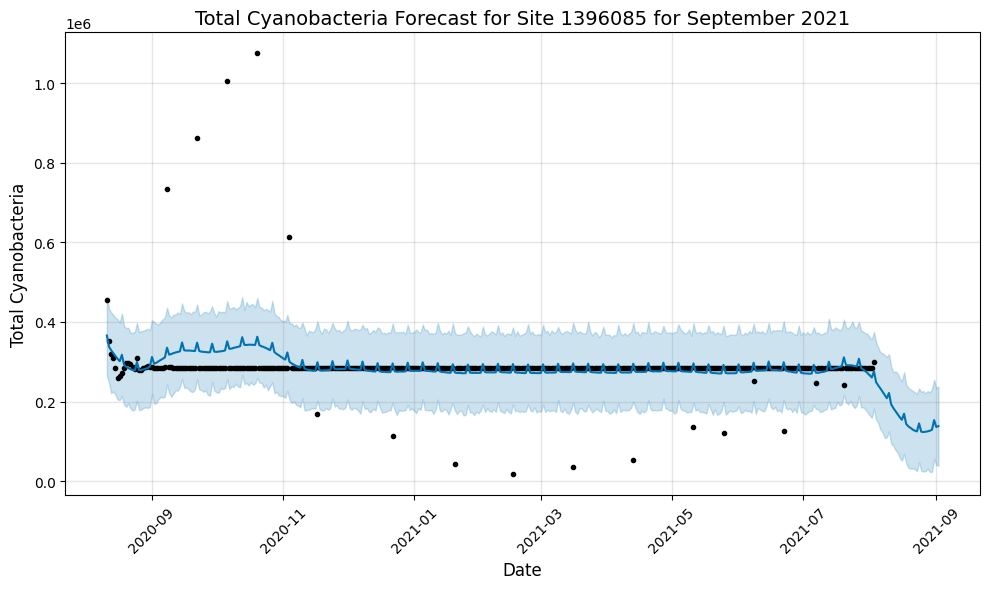

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/bgp5i6_e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/_qyz_mk8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72897', 'data', 'file=/tmp/tmp624w3uwe/bgp5i6_e.json', 'init=/tmp/tmp624w3uwe/_qyz_mk8.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelaqkf6coy/prophet_model-20250421113509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

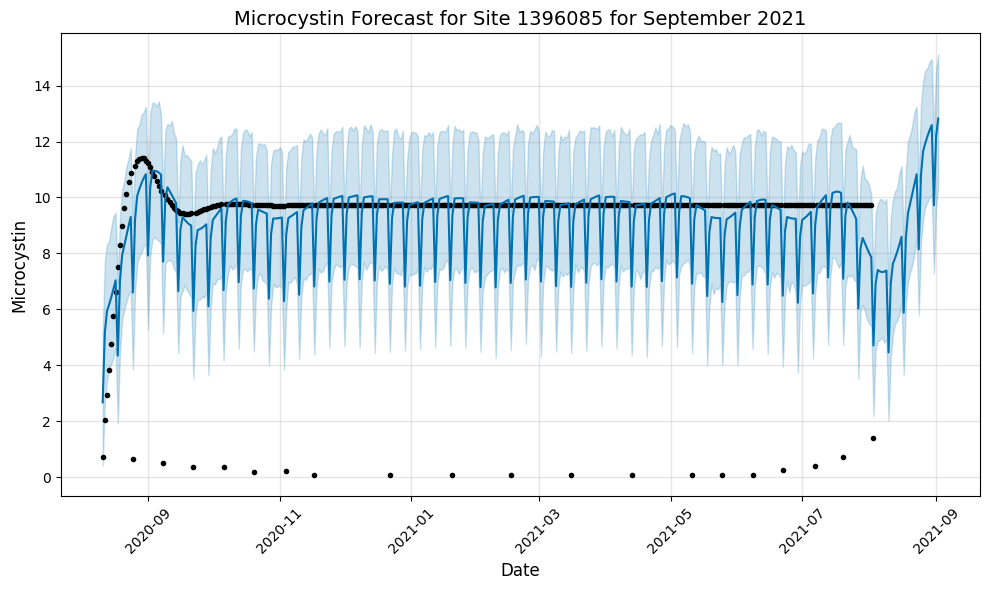

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/n81kb9zx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/pyxdgtai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81168', 'data', 'file=/tmp/tmp624w3uwe/n81kb9zx.json', 'init=/tmp/tmp624w3uwe/pyxdgtai.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_model0l9y27q_/prophet_model-20250421113510.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for Site 1396500...


11:35:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

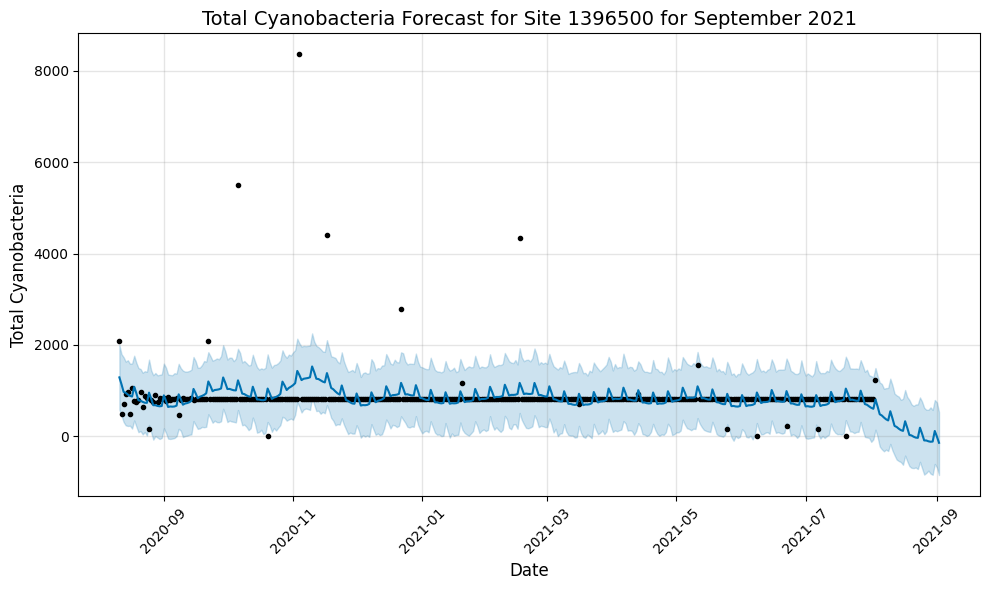

<Figure size 1000x600 with 0 Axes>

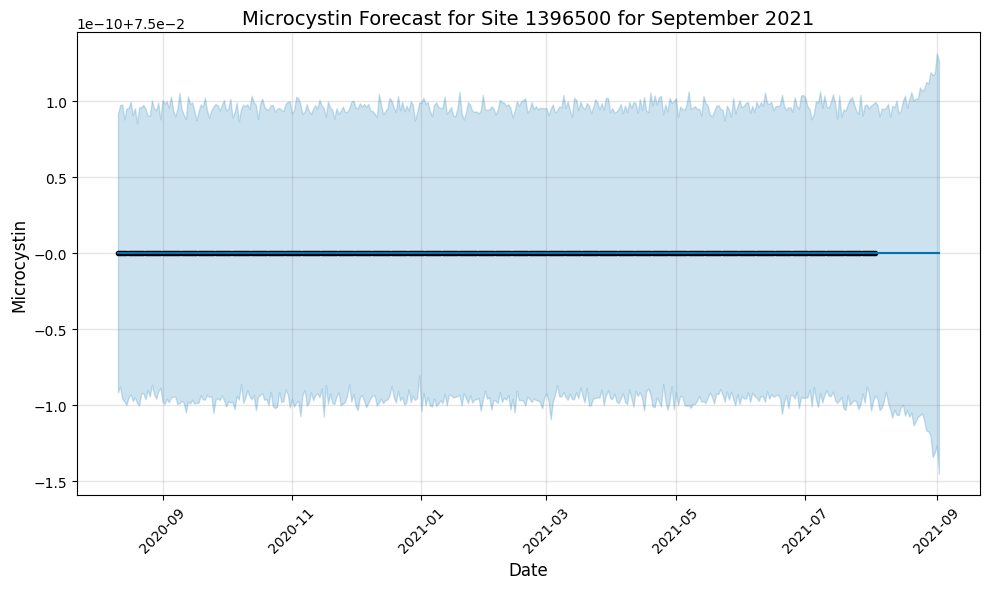

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/ifk4108x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/5xagjyc4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7079', 'data', 'file=/tmp/tmp624w3uwe/ifk4108x.json', 'init=/tmp/tmp624w3uwe/5xagjyc4.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelfm6yo_oo/prophet_model-20250421113512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing


Forecasting for Site 1396800...


INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

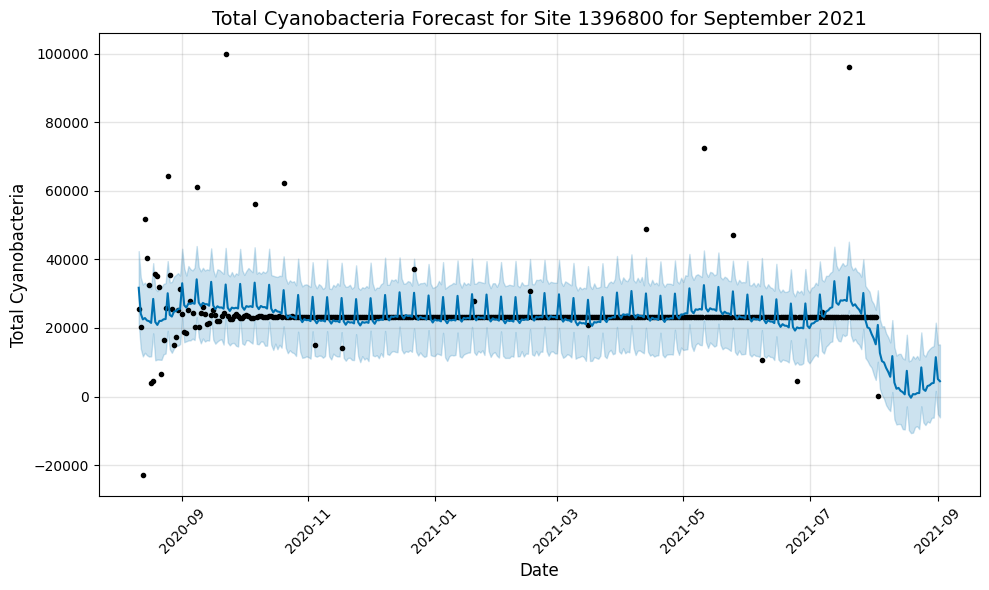

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/yzhdwx23.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/21vz5yu5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24426', 'data', 'file=/tmp/tmp624w3uwe/yzhdwx23.json', 'init=/tmp/tmp624w3uwe/21vz5yu5.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelray2a7n1/prophet_model-20250421113513.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

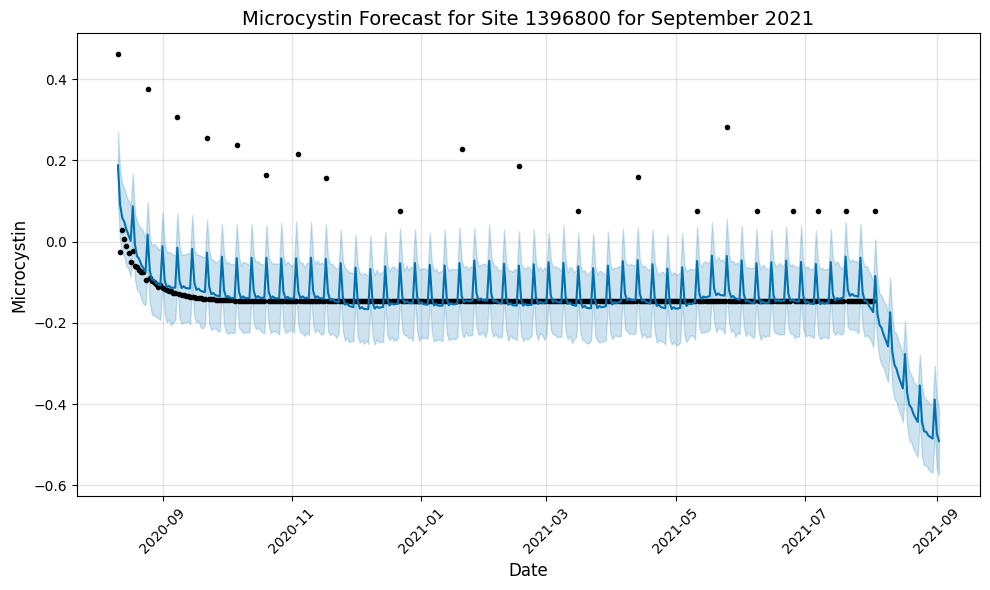

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/90r254mf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/iccd185e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24533', 'data', 'file=/tmp/tmp624w3uwe/90r254mf.json', 'init=/tmp/tmp624w3uwe/iccd185e.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelq4kizys5/prophet_model-20250421113514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Site 1397000...


<Figure size 1000x600 with 0 Axes>

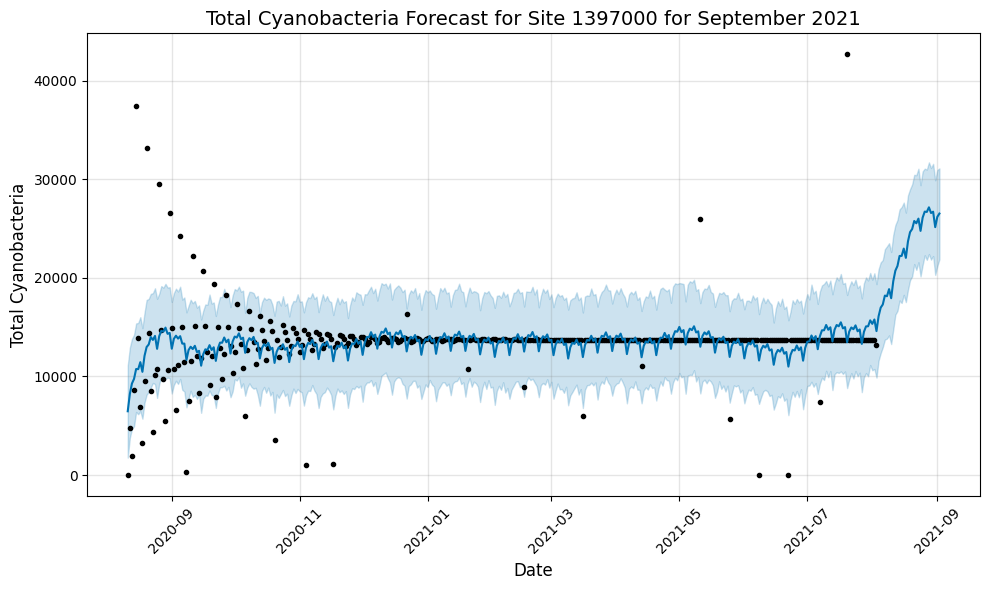

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/du30h12c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/gkdz_5dh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=176', 'data', 'file=/tmp/tmp624w3uwe/du30h12c.json', 'init=/tmp/tmp624w3uwe/gkdz_5dh.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_model5oc6nneo/prophet_model-20250421113514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

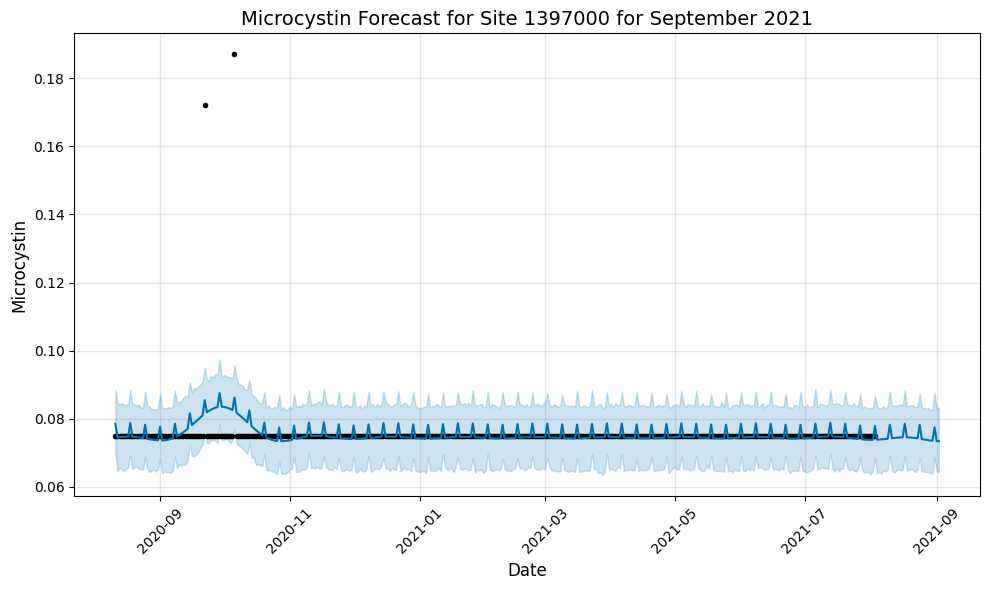

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/c5m50yww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/tgim4qy6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99094', 'data', 'file=/tmp/tmp624w3uwe/c5m50yww.json', 'init=/tmp/tmp624w3uwe/tgim4qy6.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_model9au5u0ac/prophet_model-20250421113515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for Site 1401000...


11:35:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

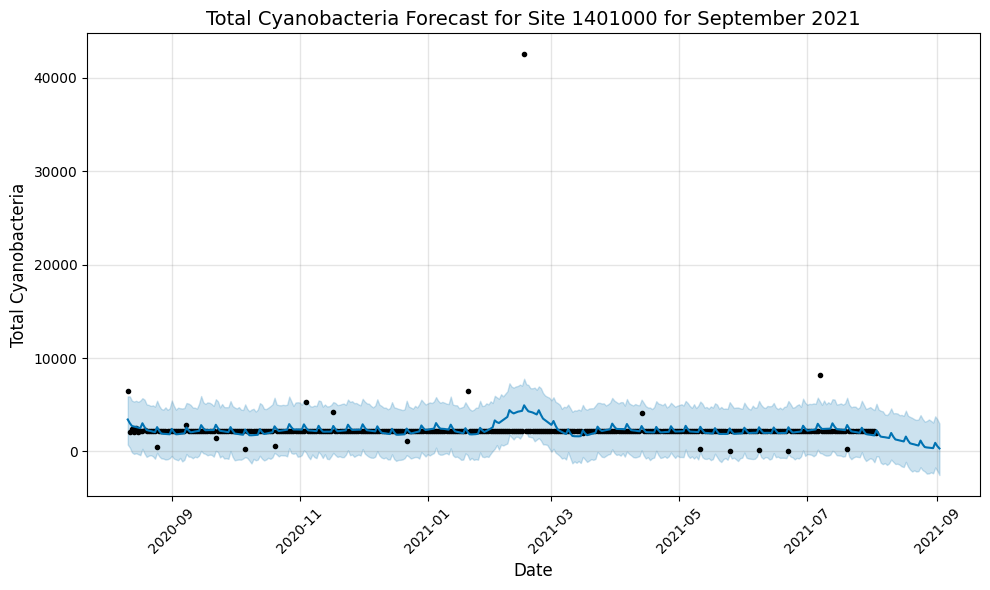

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/3xpba3ml.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/w018mx5u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13753', 'data', 'file=/tmp/tmp624w3uwe/3xpba3ml.json', 'init=/tmp/tmp624w3uwe/w018mx5u.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelwb3ig579/prophet_model-20250421113516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

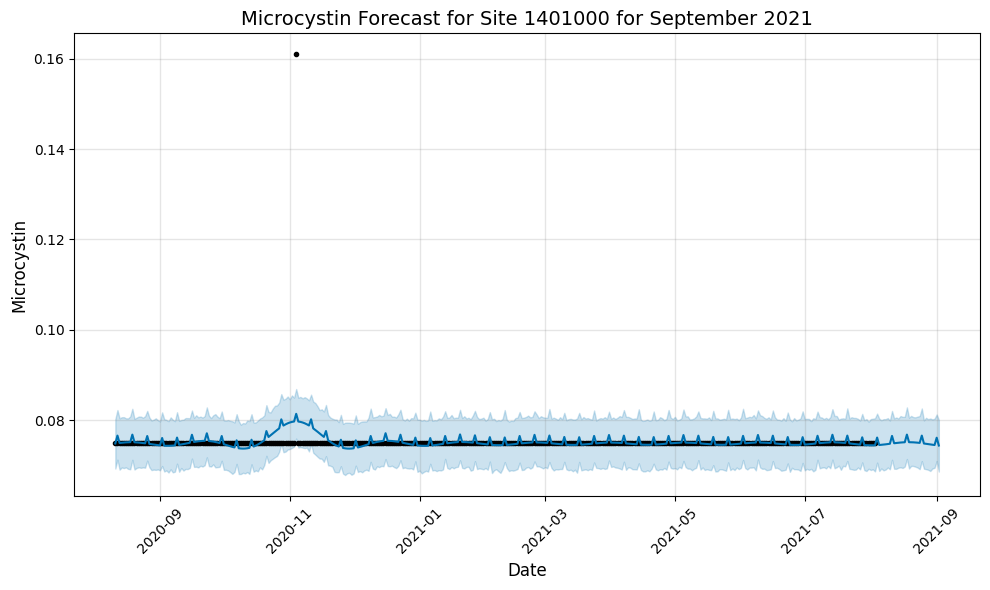

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/8g3pat_v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/b1mbhjmq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27592', 'data', 'file=/tmp/tmp624w3uwe/8g3pat_v.json', 'init=/tmp/tmp624w3uwe/b1mbhjmq.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelno_6wl1s/prophet_model-20250421113517.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Site 1402000...


<Figure size 1000x600 with 0 Axes>

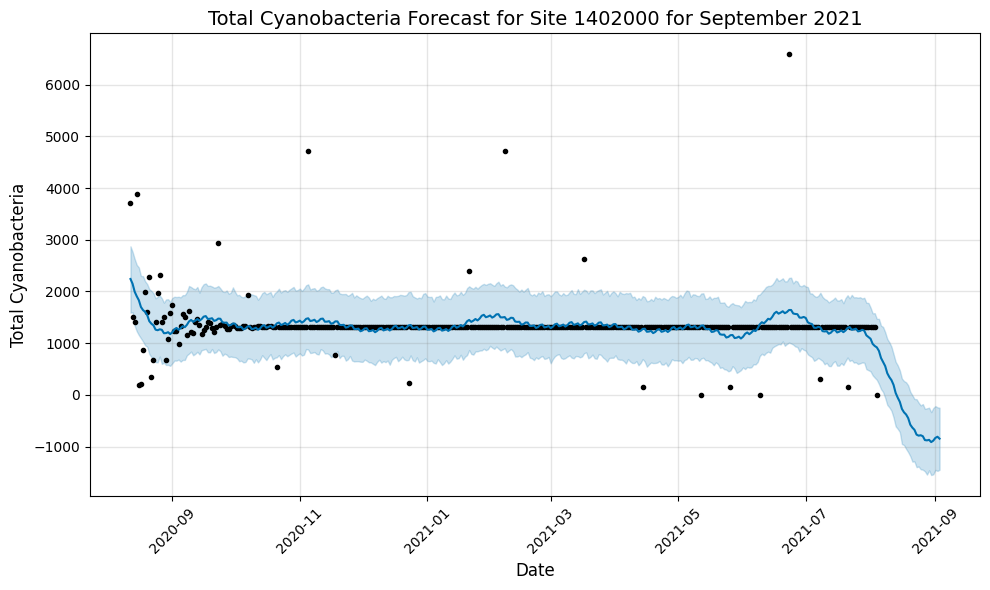

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/7aw8ilpw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/i1d1br_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59759', 'data', 'file=/tmp/tmp624w3uwe/7aw8ilpw.json', 'init=/tmp/tmp624w3uwe/i1d1br_y.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelmb8_8seu/prophet_model-20250421113517.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

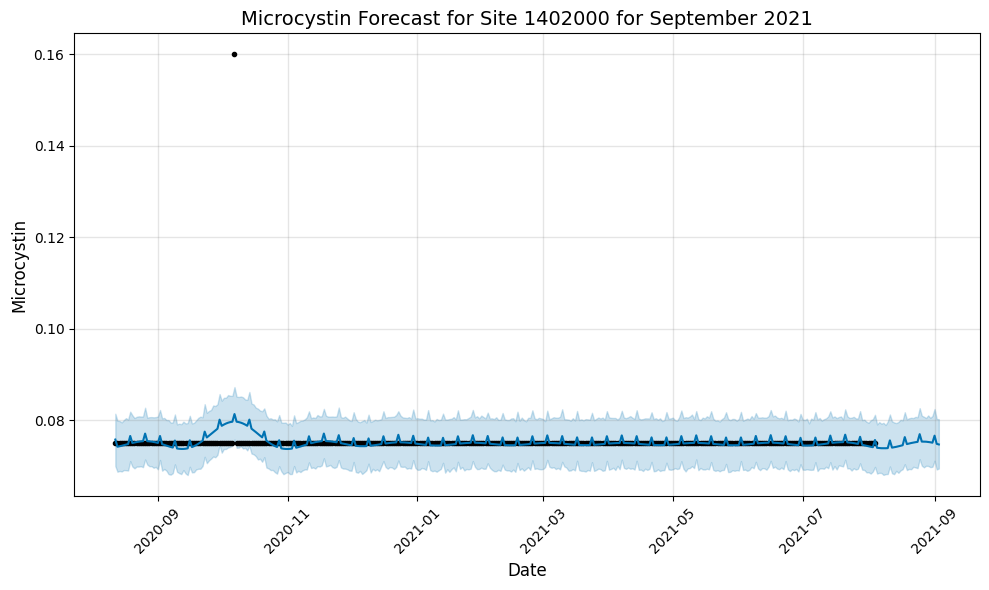

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/zyiwuqkc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/ytoqp3e0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40233', 'data', 'file=/tmp/tmp624w3uwe/zyiwuqkc.json', 'init=/tmp/tmp624w3uwe/ytoqp3e0.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelxhr6cmr3/prophet_model-20250421113518.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Site 1400500...


<Figure size 1000x600 with 0 Axes>

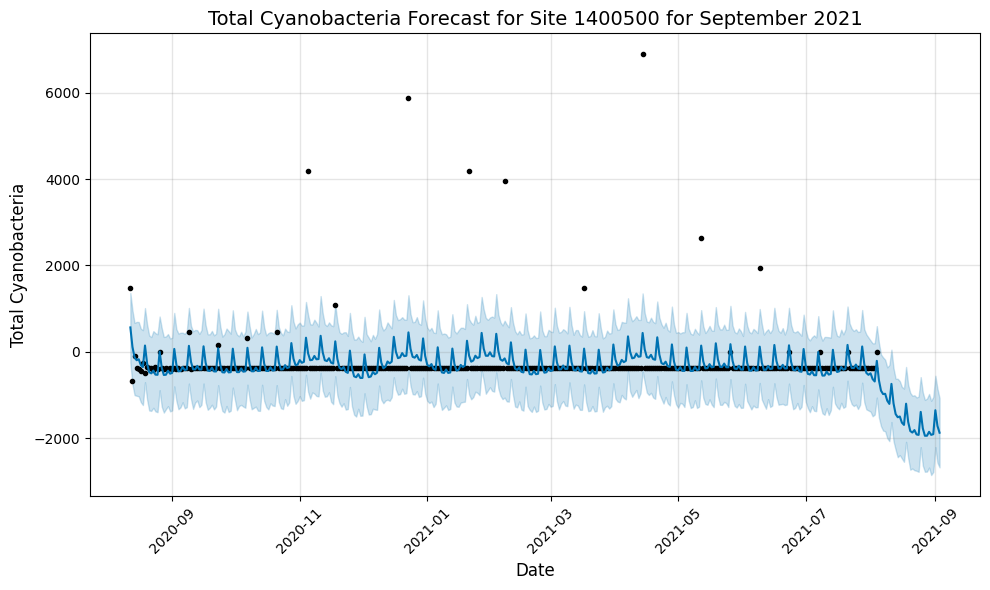

<Figure size 1000x600 with 0 Axes>

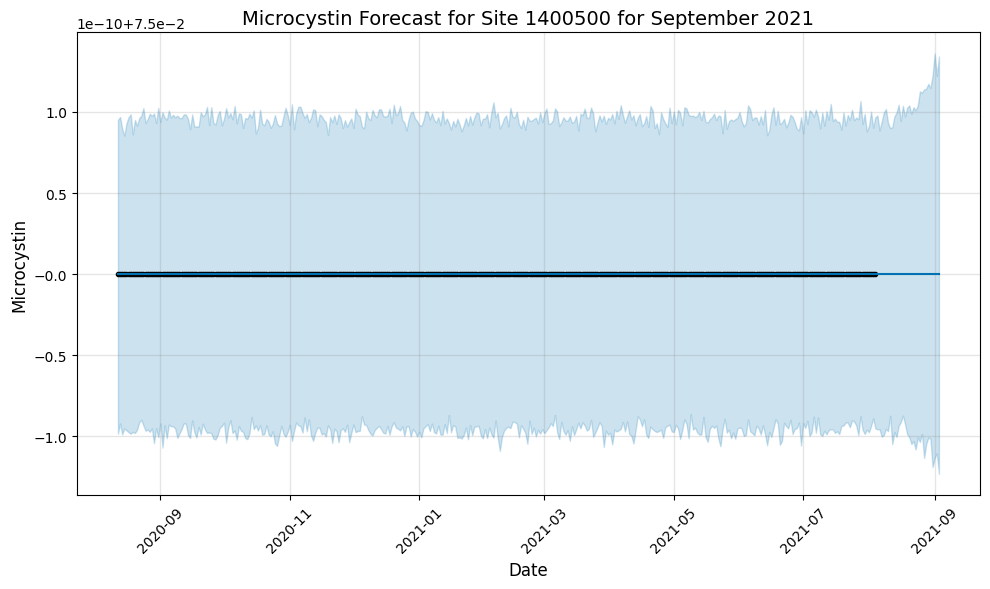

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/b5rabmem.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/hgfv5c73.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62168', 'data', 'file=/tmp/tmp624w3uwe/b5rabmem.json', 'init=/tmp/tmp624w3uwe/hgfv5c73.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_model1kthxkek/prophet_model-20250421113520.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Forecasting for Site 1403060...


11:35:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

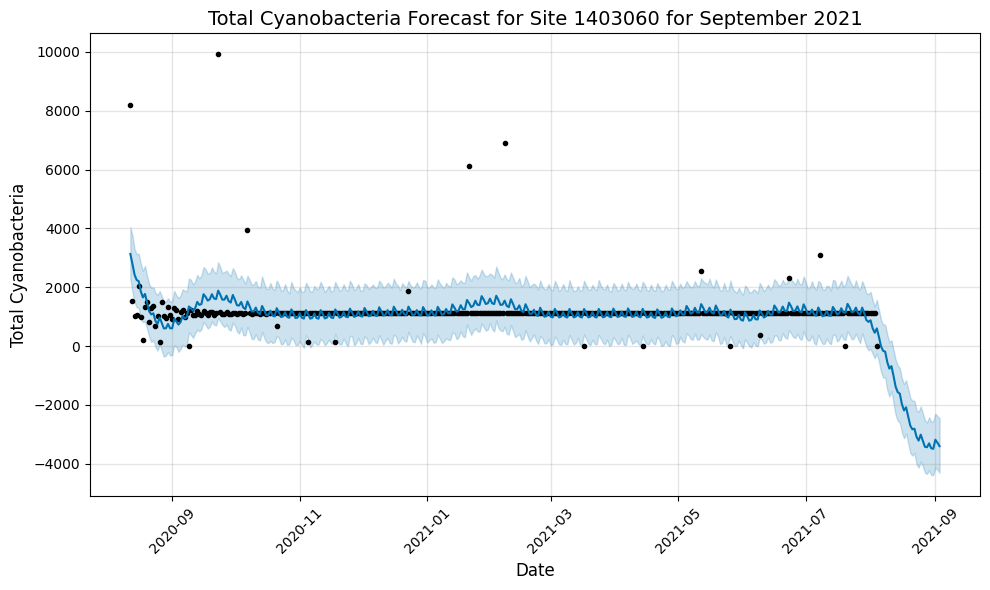

<Figure size 1000x600 with 0 Axes>

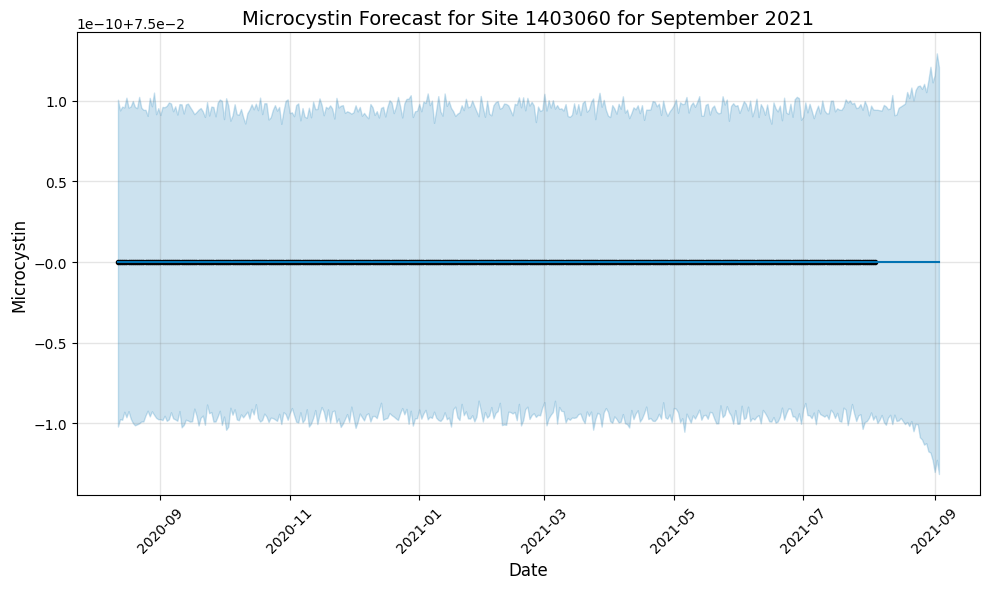

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/pgstu43t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/6d93_ees.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19901', 'data', 'file=/tmp/tmp624w3uwe/pgstu43t.json', 'init=/tmp/tmp624w3uwe/6d93_ees.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelalz92lqr/prophet_model-20250421113521.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Site 1396790...


<Figure size 1000x600 with 0 Axes>

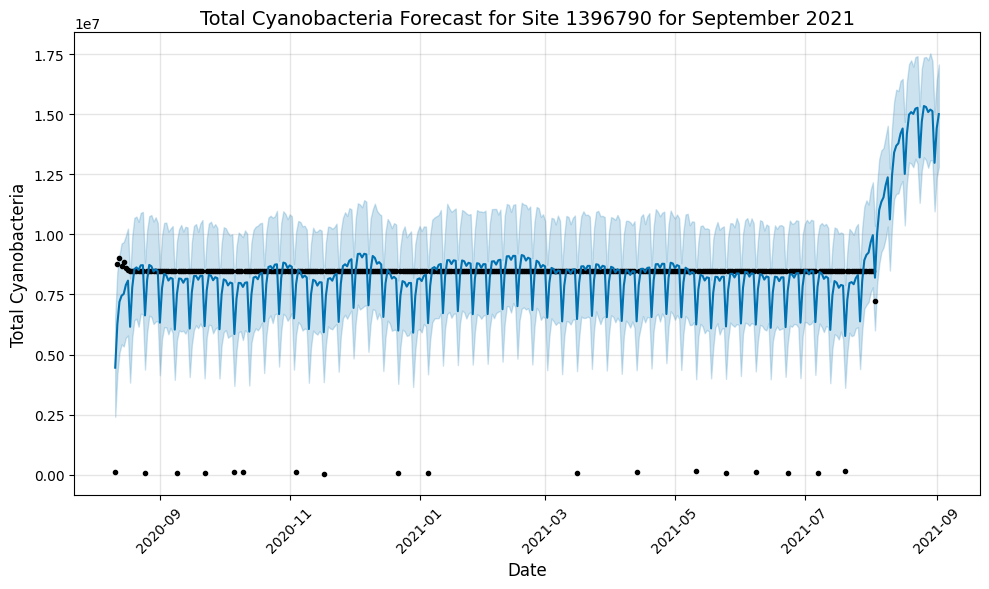

DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/hcz38qfq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp624w3uwe/x5lfk7f6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23149', 'data', 'file=/tmp/tmp624w3uwe/hcz38qfq.json', 'init=/tmp/tmp624w3uwe/x5lfk7f6.json', 'output', 'file=/tmp/tmp624w3uwe/prophet_modelcwir368l/prophet_model-20250421113521.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:35:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:35:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

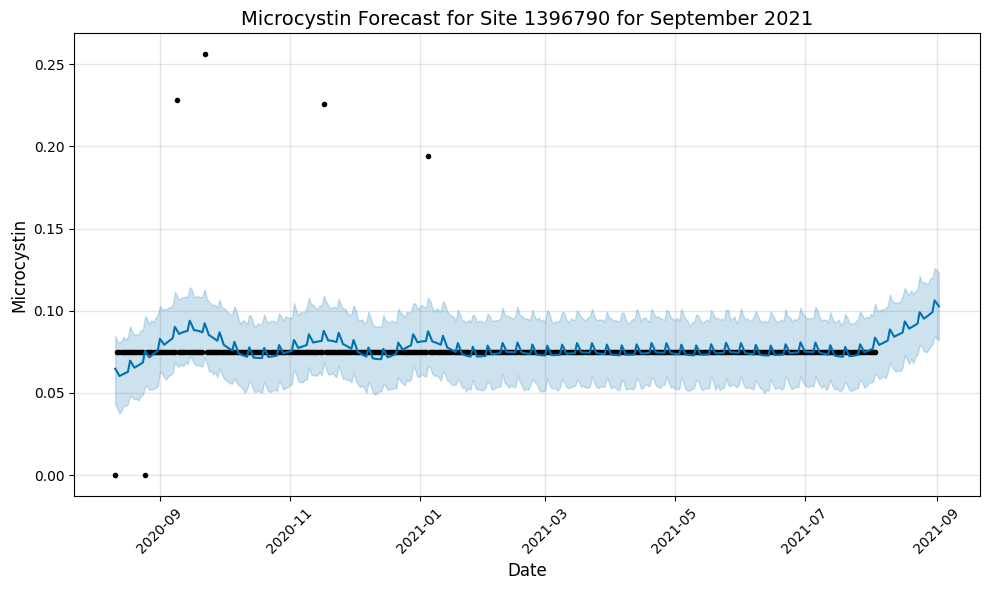

In [ ]:
from prophet import Prophet
import matplotlib.pyplot as plt

# Function to run Prophet for each site
def forecast_for_site(df, site_id, target_column, target_name):
    # Filter the data for the current site
    site_data = df[df['site_no'] == site_id][['dateTime', target_column]].rename(columns={'dateTime': 'ds', target_column: 'y'})

    # Fit Prophet model for the target variable
    model = Prophet(daily_seasonality=True, yearly_seasonality=True)
    model.fit(site_data)

    # Create future dataframe for the next 30 days (forecast for September 2021)
    future = model.make_future_dataframe(periods=30, freq='D')
    forecast = model.predict(future)

    # Visualize the forecast
    plt.figure(figsize=(10, 6))
    model.plot(forecast)
    plt.title(f'{target_name} Forecast for Site {site_id} for September 2021', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel(target_name, fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return forecast

# Loop through each site and forecast separately for both Total Cyanobacteria and Microcystin
for site_id in df['site_no'].unique():
    print(f"Forecasting for Site {site_id}...")

    # Forecast for Total Cyanobacteria
    forecast_for_site(df, site_id, 'Total_Cyanobacteria', 'Total Cyanobacteria')

    # Forecast for Microcystin
    forecast_for_site(df, site_id, 'microcystin_total_abraxis_ugL', 'Microcystin')


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Load data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Create lag and rolling features for LSTM
def create_features(df, lags=[1, 2, 3], windows=[3, 7]):
    for col in ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']:
        for lag in lags:
            df[f'{col}_lag{lag}'] = df.groupby('site_no')[col].shift(lag)
        for window in windows:
            df[f'{col}_rollmean{window}'] = df.groupby('site_no')[col].shift(1).rolling(window).mean().reset_index(level=0, drop=True)
    return df

df = create_features(df)

# Clip outliers for specific columns
def clip_outliers(df, columns, quantile=0.01):
    for col in columns:
        lower = df[col].quantile(quantile)
        upper = df[col].quantile(1 - quantile)
        df[col] = df[col].clip(lower, upper)
    return df

columns_to_clip = ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']
df = clip_outliers(df, columns_to_clip)

# Normalize features site-wise
features = [
    'Ammonia', 'Nitrate + Nitrite', 'Orthophosphate', 'Total nitrogen',
    'Total Phosphorus', 'Inorg N', '% Org N', '% Org P',
    'Total_phytoplankton', 'temperature_C'
] + [col for col in df.columns if 'lag' in col or 'rollmean' in col]

def normalize_sitewise(df, features):
    for site in df['site_no'].unique():
        scaler = StandardScaler()
        idx = df['site_no'] == site
        df.loc[idx, features] = scaler.fit_transform(df.loc[idx, features])
    return df

df = normalize_sitewise(df, features)

# Drop rows with NaNs (from lag/rolling)
df = df.dropna().reset_index(drop=True)

# Define a function to prepare the data for LSTM (X and y)
def prepare_lstm_data(df, site_id, target_column, features, sequence_length=30):
    site_df = df[df['site_no'] == site_id]
    X = site_df[features].values
    y = site_df[target_column].values

    X_scaled = StandardScaler().fit_transform(X)  # Standardizing the features
    X_seq, y_seq = [], []

    # Creating sequences
    for i in range(sequence_length, len(X_scaled)):
        X_seq.append(X_scaled[i-sequence_length:i])
        y_seq.append(y[i])

    return np.array(X_seq), np.array(y_seq)



In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping

# Define the LSTM model with early stopping and optional bidirectional layers
def build_lstm_model(input_shape, use_bidirectional=False):
    model = Sequential()
    if use_bidirectional:
        model.add(Bidirectional(LSTM(128, activation='relu', input_shape=input_shape, return_sequences=True)))
    else:
        model.add(LSTM(128, activation='relu', input_shape=input_shape, return_sequences=True))
    model.add(Dropout(0.2))  # Dropout for regularization
    model.add(LSTM(64, activation='relu', return_sequences=False))
    model.add(Dropout(0.2))  # Dropout for regularization
    model.add(Dense(1))  # Output layer
    model.compile(optimizer='adam', loss='mse')
    return model

# Add early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit and evaluate LSTM model with early stopping
def fit_and_evaluate_lstm_model(df, site, features, target_column):
    # Prepare the data
    X, y = prepare_lstm_data(df, site, target_column, features)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Build and fit the model
    model = build_lstm_model(X_train.shape[1:], use_bidirectional=True)  # Bidirectional LSTM
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0, validation_data=(X_test, y_test), callbacks=[early_stopping])

    # Make predictions and evaluate
    y_pred = model.predict(X_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    return mae, rmse, r2

# Evaluate improved model across all sites
improved_results = []

for site in df['site_no'].unique():
    mae, rmse, r2 = fit_and_evaluate_lstm_model(df, site, features, 'Total_Cyanobacteria')
    improved_results.append({
        'site': site,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2
    })

improved_results_df = pd.DataFrame(improved_results)
print(improved_results_df)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 376ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step   
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step
      site           MAE          RMSE         R2
0  1396085  2.103553e+04  2.919040e+04  -0.933092
1  1396500  1.708354e+02  2.540158e+02  -0.928631
2  1396790  7.890467e+06  8.142023e+06 -15.228040
3  1396800  9.256190e+03  1.274820e+04  -0.661499
4  1397000  1.301237e+04  1.375363e+04  -8.803344
5  1400500  2.563159e+02  3.413919e+02  -0.314267
6  1401000  7.992901e+02  1.154859e+03  -0.799512
7  1402000  8.832896e+02  1.126973e+03  -1.459847
8  1403060  3.015303e+02  4.084819e+02  -0.290029


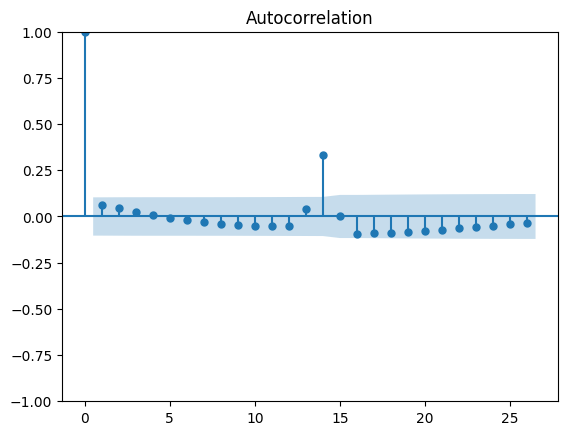

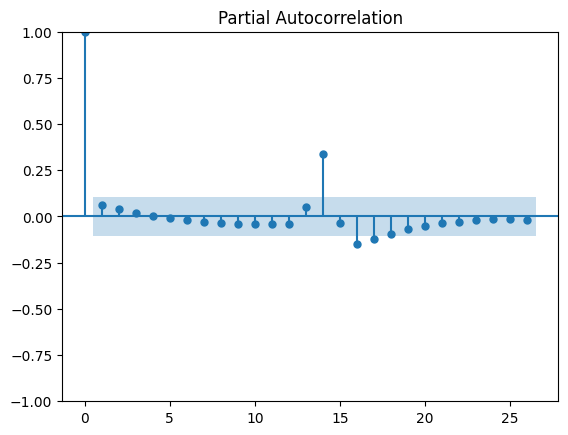

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


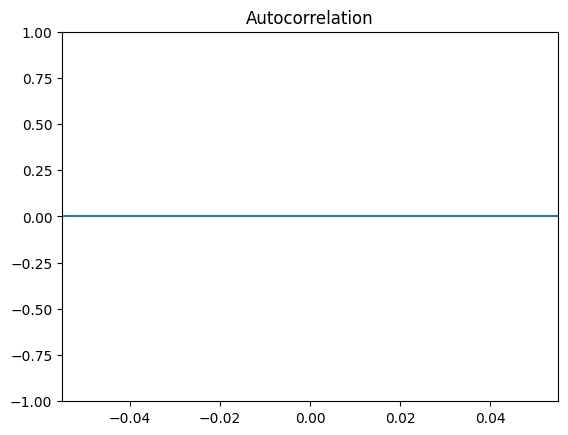

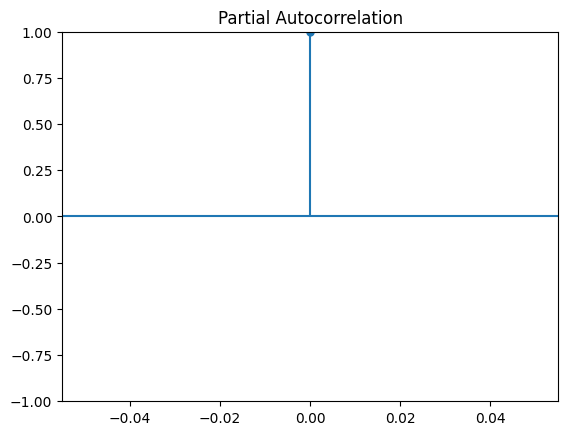

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


ValueError: Invalid input, x is constant

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Define targets and sites
targets = ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']
sites = df['site_no'].unique()

# Initialize performance storage
performance_results = []

# Loop through each site and target
for site in sites:
    for target in targets:
        site_df = df[df['site_no'] == site]
        site_df = site_df[['dateTime', target]].set_index('dateTime')

        # Check for stationarity using ADF test
        result = adfuller(site_df[target])

        # If p-value is above 0.05, the data is not stationary, so we difference it
        if result[1] > 0.05:
            site_df[target] = site_df[target].diff().dropna()

        # Plot ACF and PACF to identify p, d, q values
        plot_acf(site_df[target])
        plot_pacf(site_df[target])
        plt.show()

        # Based on ACF/PACF, we choose p=1, d=1, q=1 for simplicity (you can adjust)
        model = ARIMA(site_df[target], order=(1,1,1))
        model_fit = model.fit()

        # Make predictions
        forecast_steps = 30
        forecast = model_fit.forecast(steps=forecast_steps)

        # Evaluate performance on the last 30 data points (test data)
        y_true = site_df[target][-30:]  # Last 30 data points for test
        y_pred = forecast

        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)

        # Store performance for each site and target
        performance_results.append({
            'site': site,
            'target': target,
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        })

# Create DataFrame of performance results
performance_df = pd.DataFrame(performance_results)

# Filter for good performance (you can adjust thresholds)
good_performance_df = performance_df[performance_df['R2'] > 0.5]

# Display good performance results
print(good_performance_df)

# If you want to forecast for the best-performing sites
best_sites = good_performance_df['site'].unique()

# Forecast for these sites
for site in best_sites:
    for target in targets:
        site_df = df[df['site_no'] == site]
        site_df = site_df[['dateTime', target]].set_index('dateTime')

        # Apply ARIMA model (same as before)
        model = ARIMA(site_df[target], order=(1,1,1))
        model_fit = model.fit()

        # Make 30-day forecast
        forecast = model_fit.forecast(steps=30)

        # Plot the forecast
        plt.figure(figsize=(10,6))
        plt.plot(site_df.index, site_df[target], label='Historical Data')
        plt.plot(pd.date_range(start=site_df.index[-1], periods=31, freq='D')[1:], forecast, label='30-Day Forecast', color='red')
        plt.title(f'{target} 30-Day Forecast for Site {site}')
        plt.legend()
        plt.show()


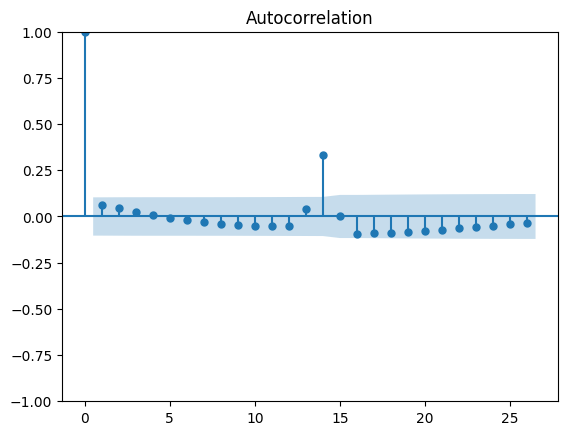

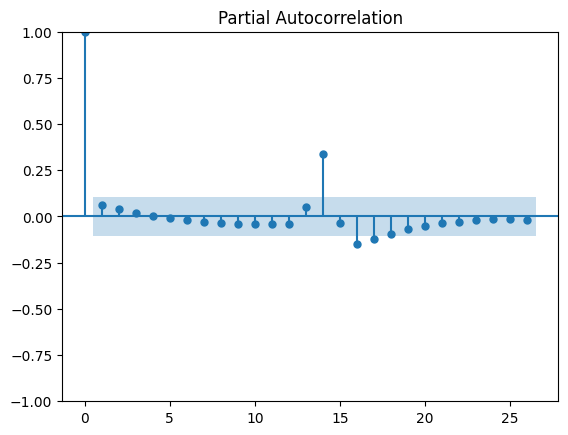

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


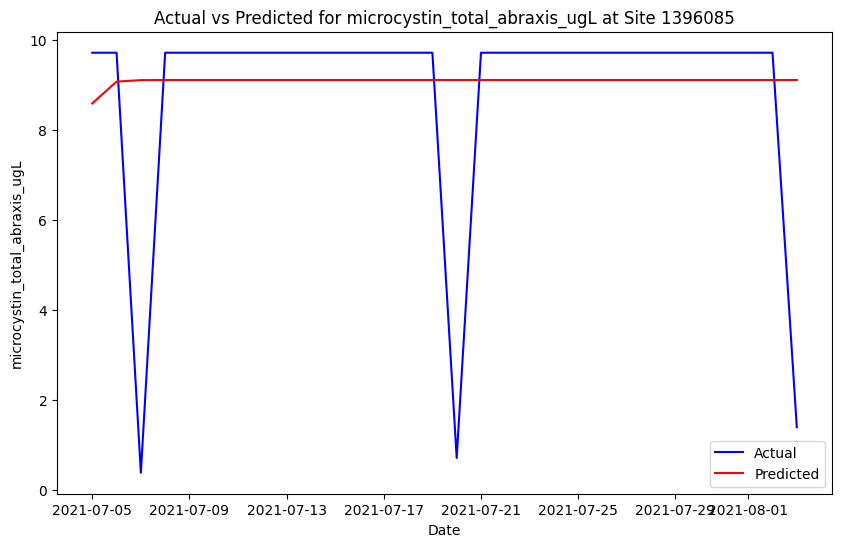

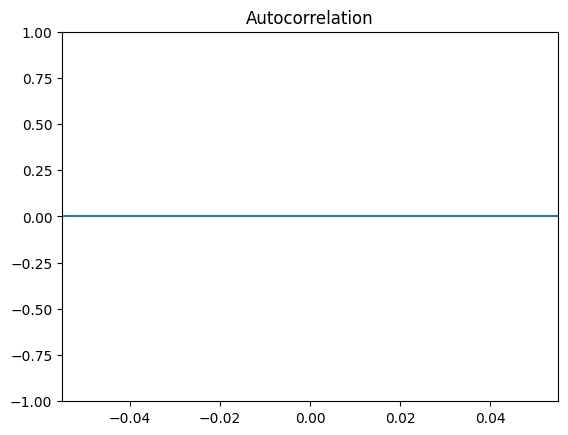

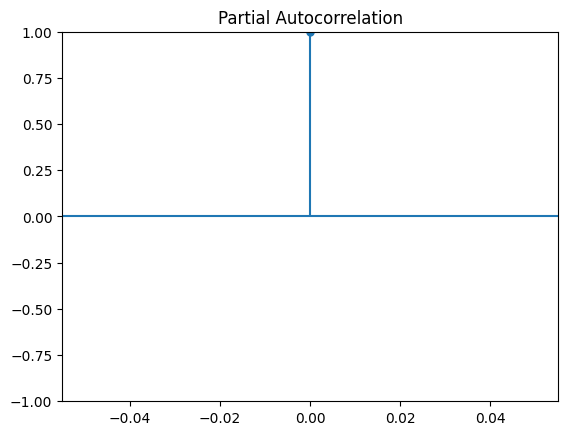

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


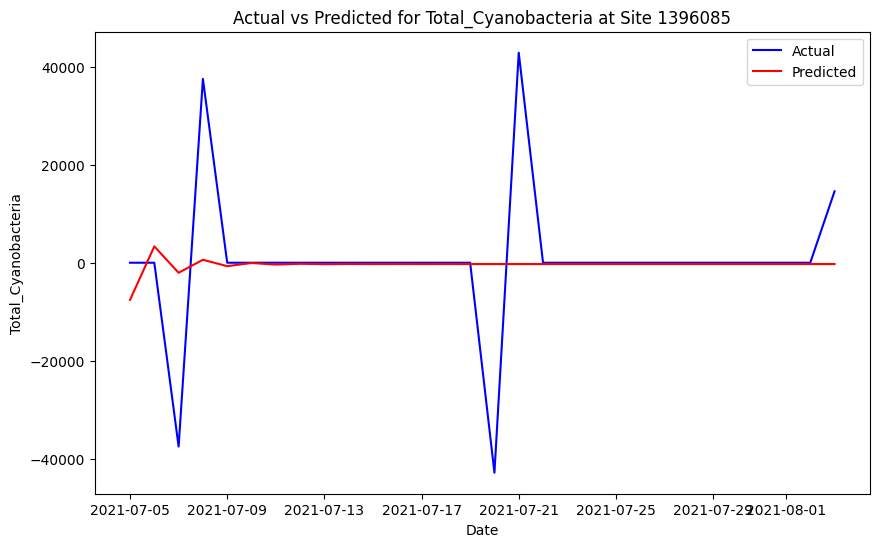

Skipping ADF test for site 1396500, target microcystin_total_abraxis_ugL due to constant values.


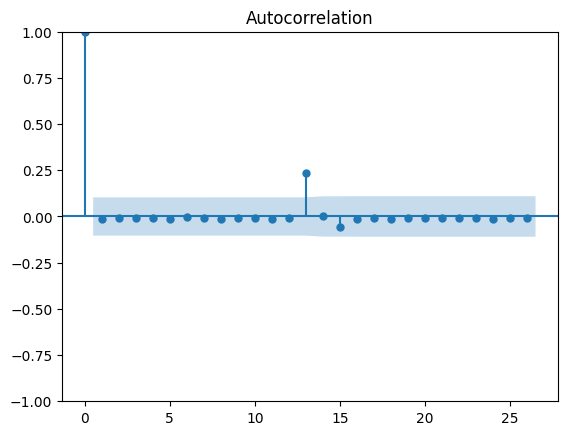

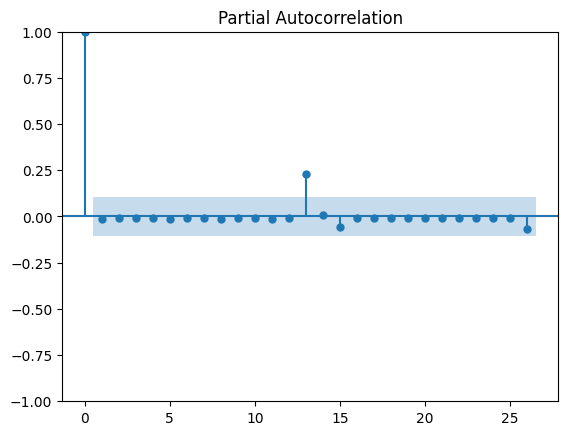

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


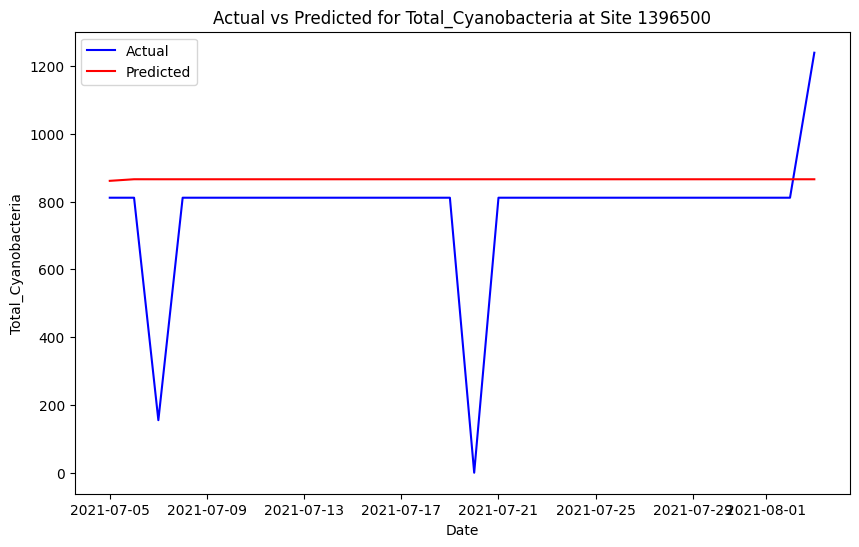

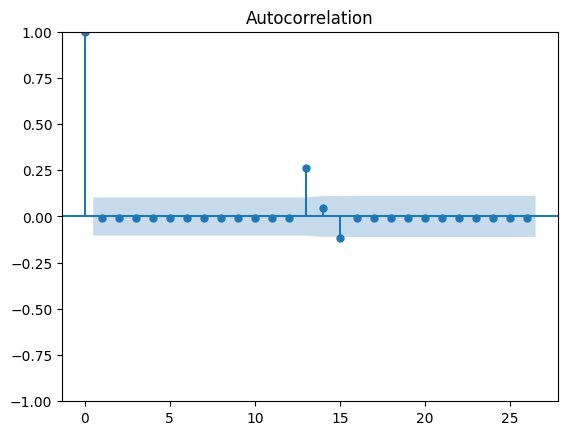

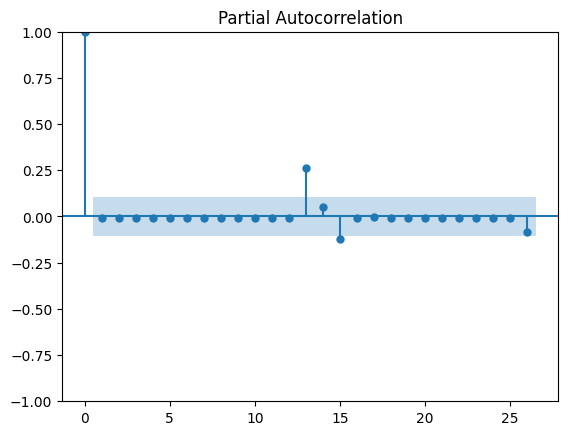

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


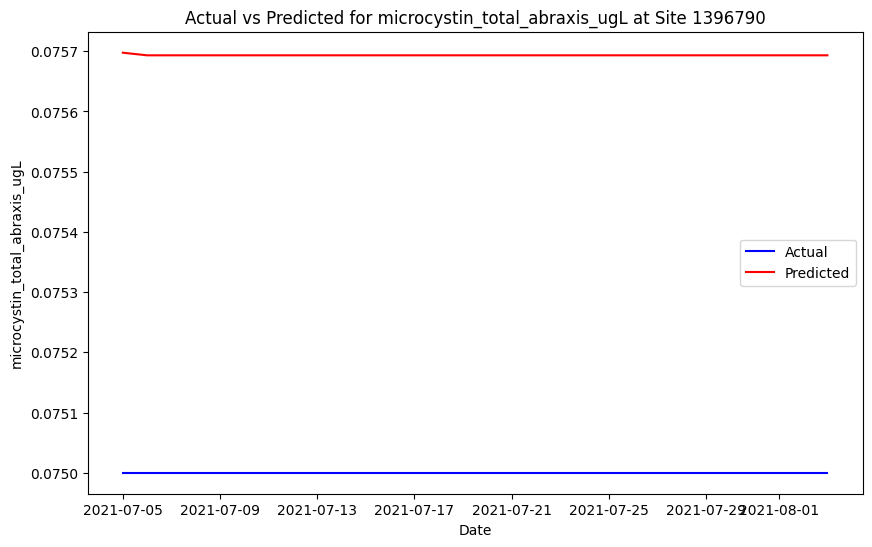

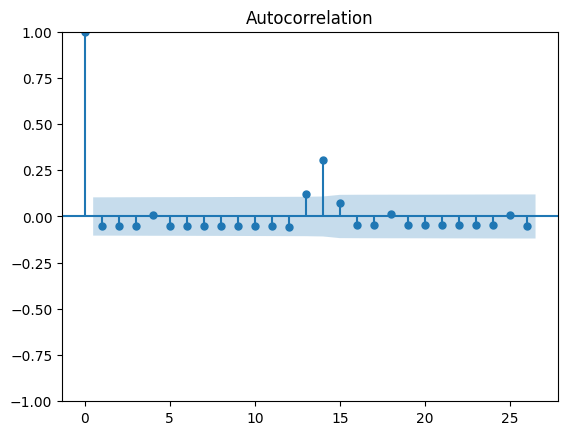

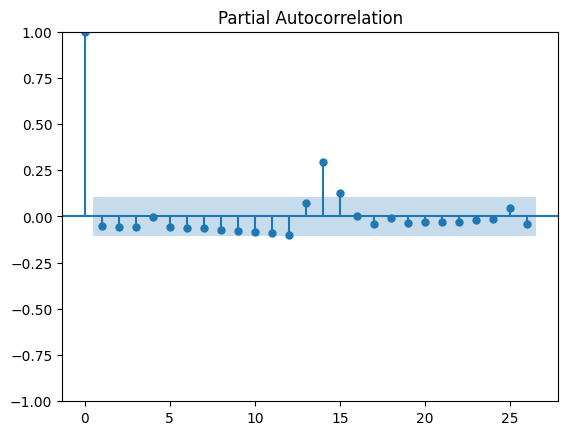

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


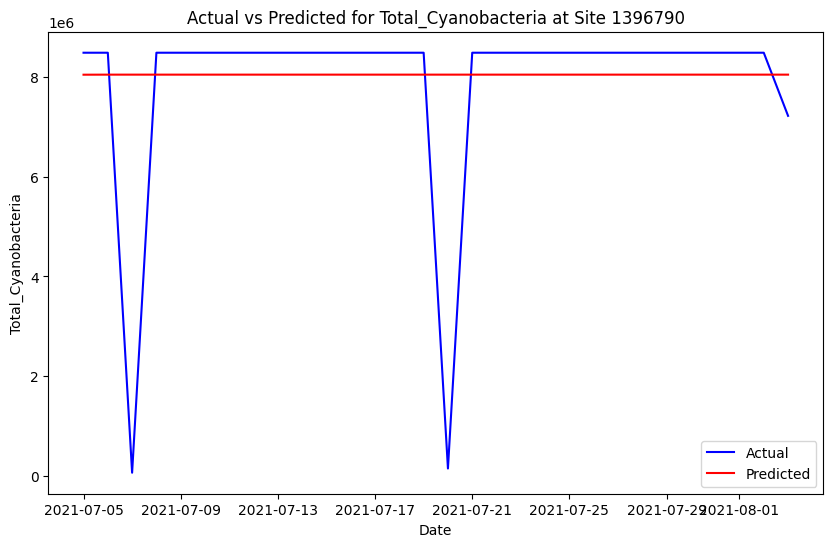

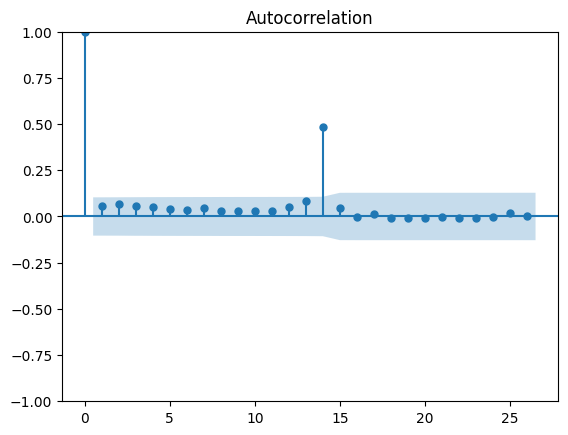

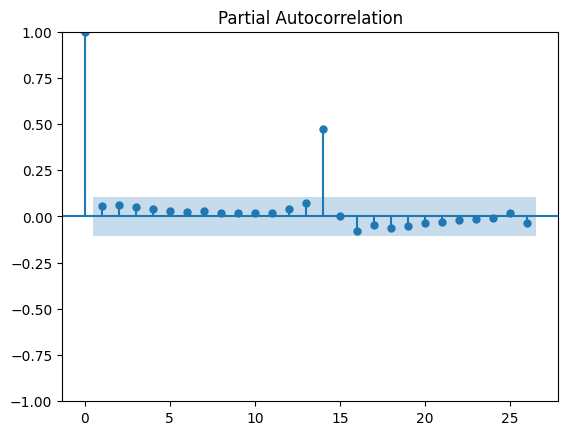

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


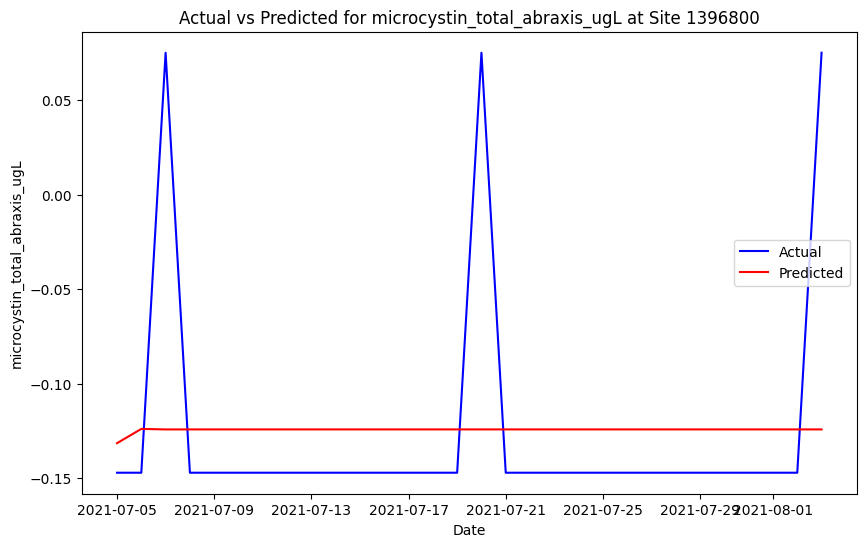

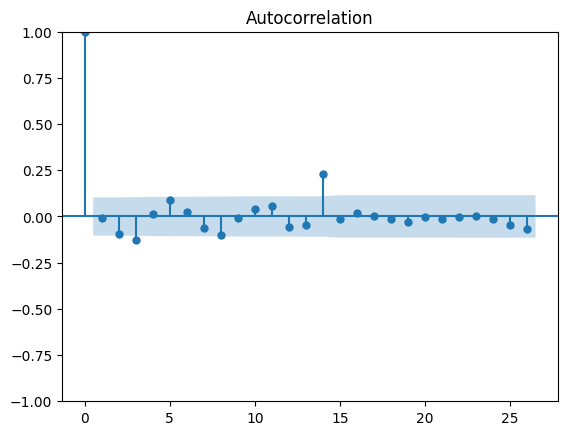

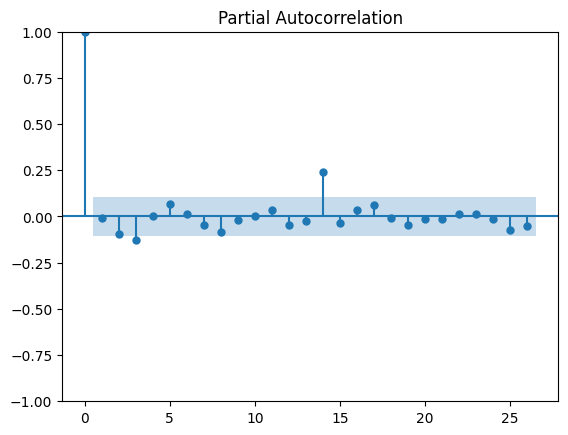

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


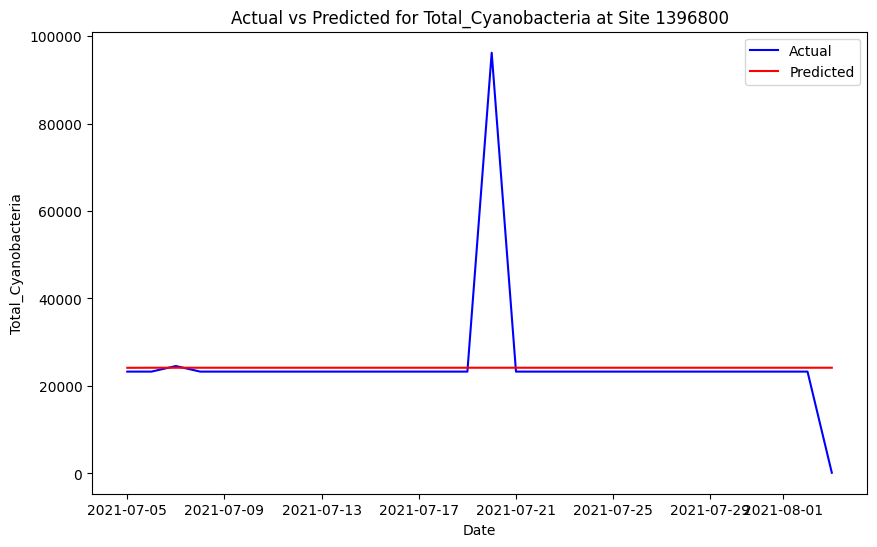

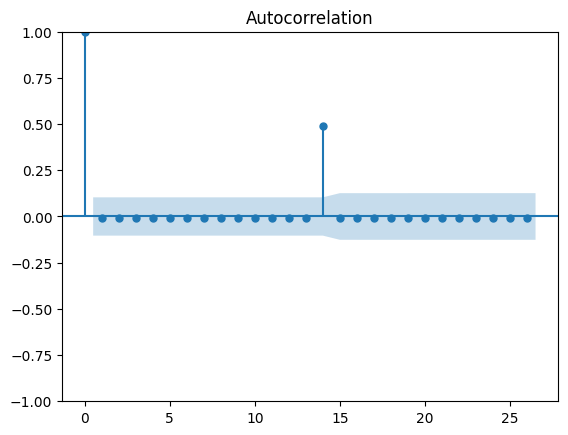

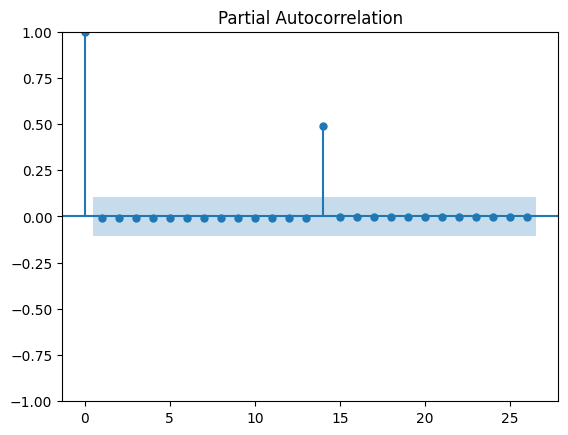

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


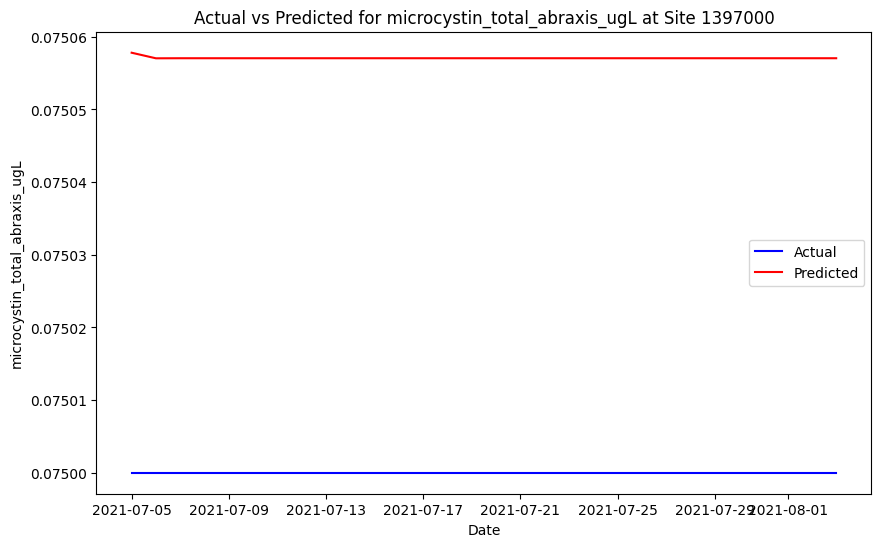

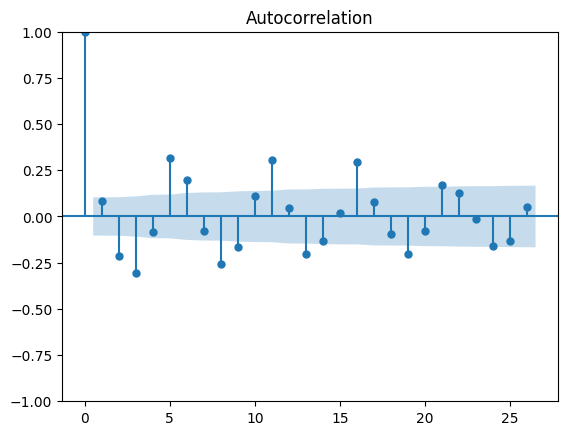

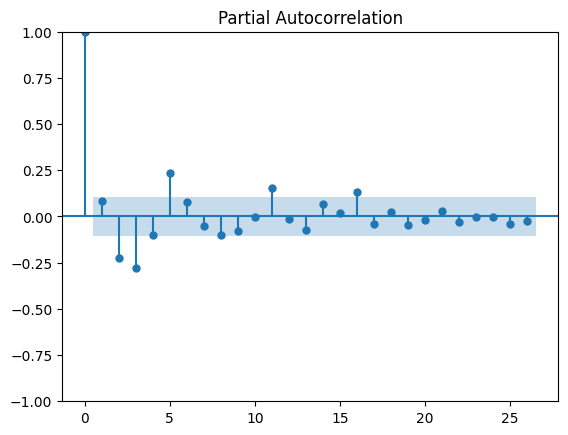

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


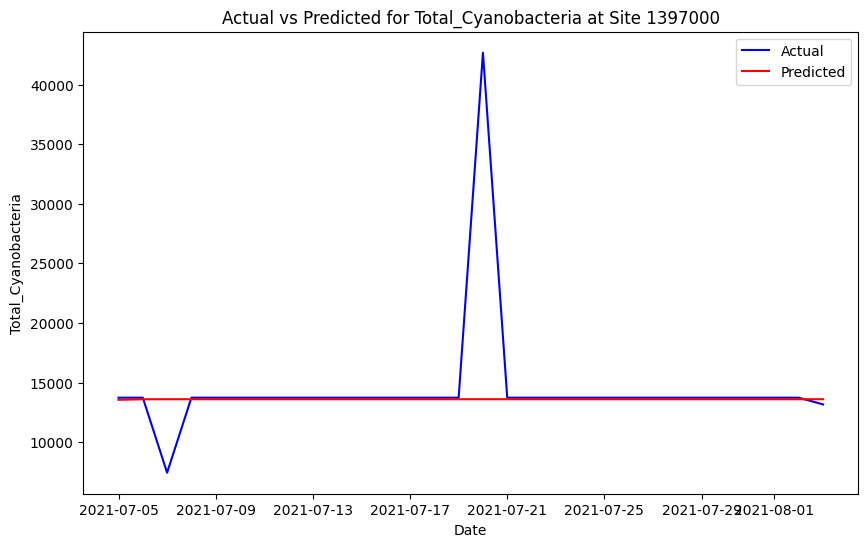

Skipping ADF test for site 1400500, target microcystin_total_abraxis_ugL due to constant values.


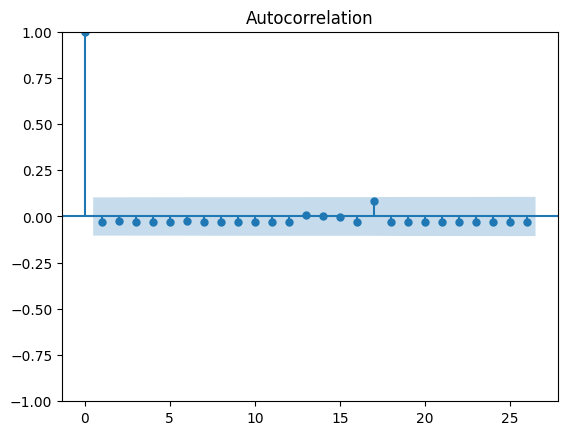

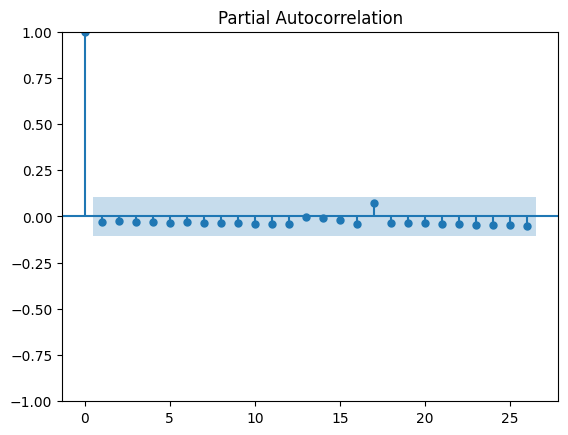

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


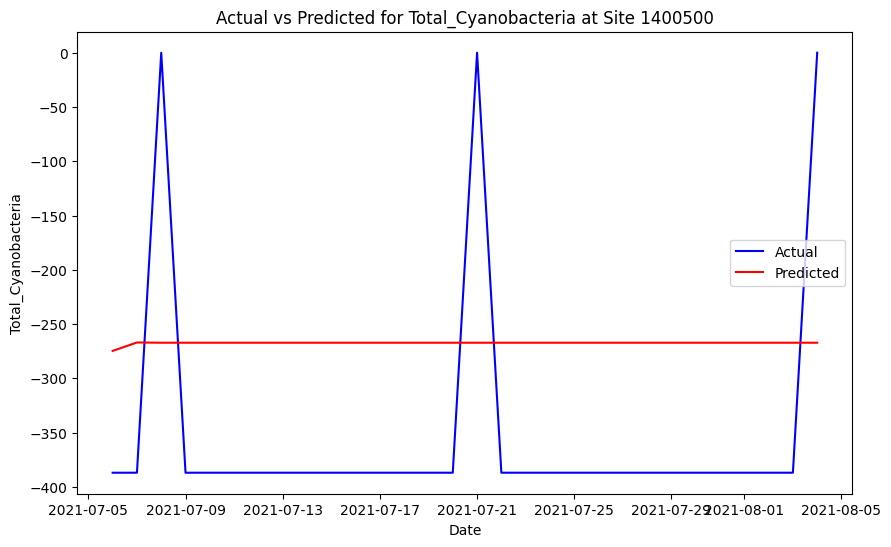

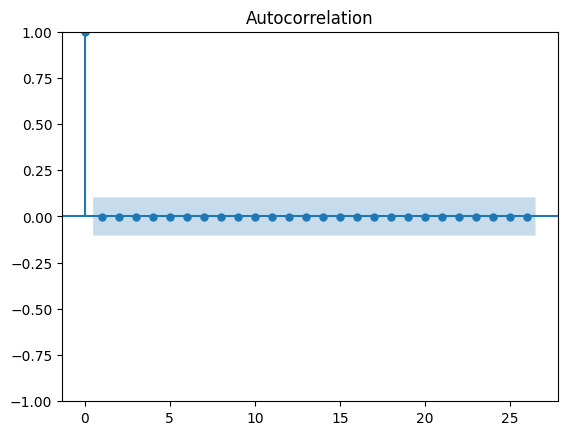

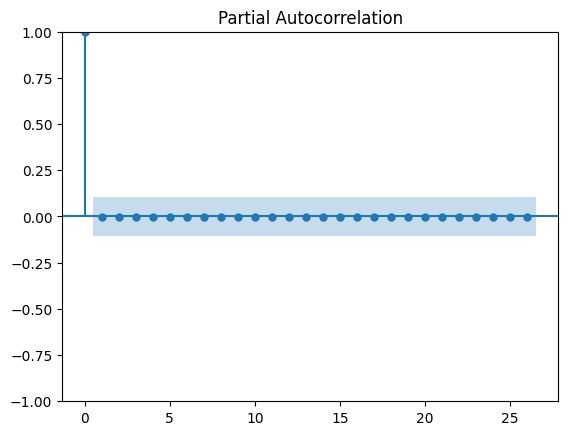

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


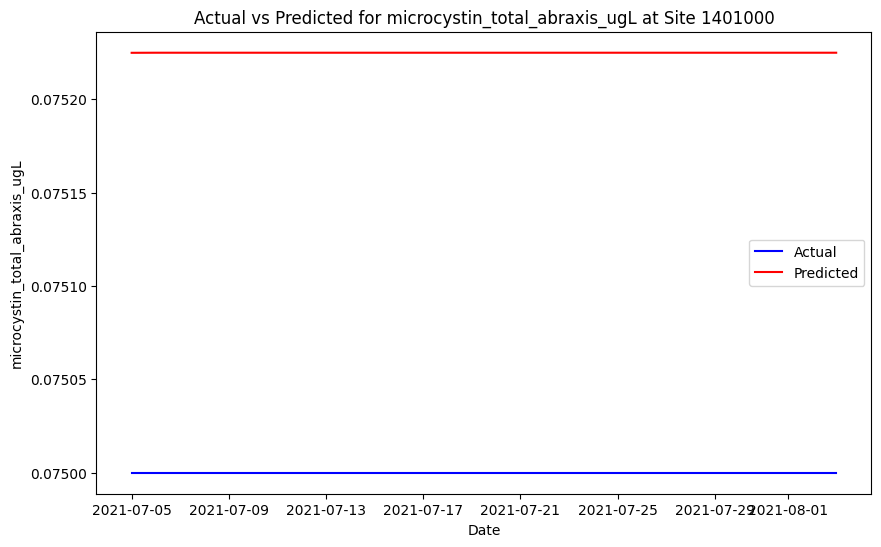

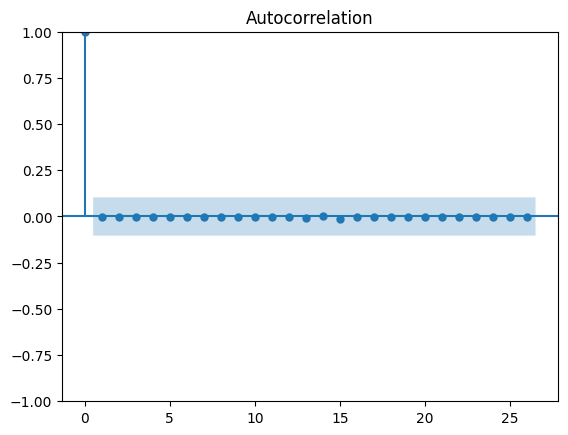

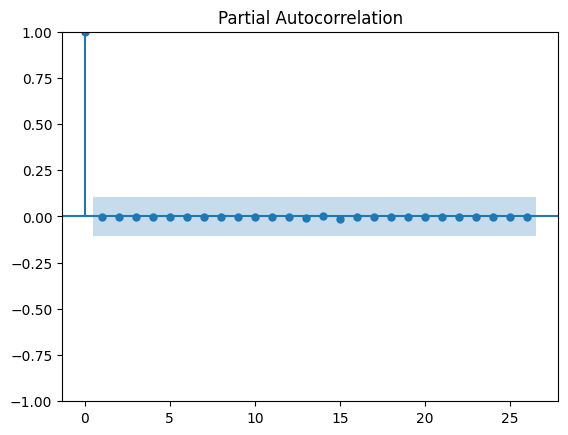

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


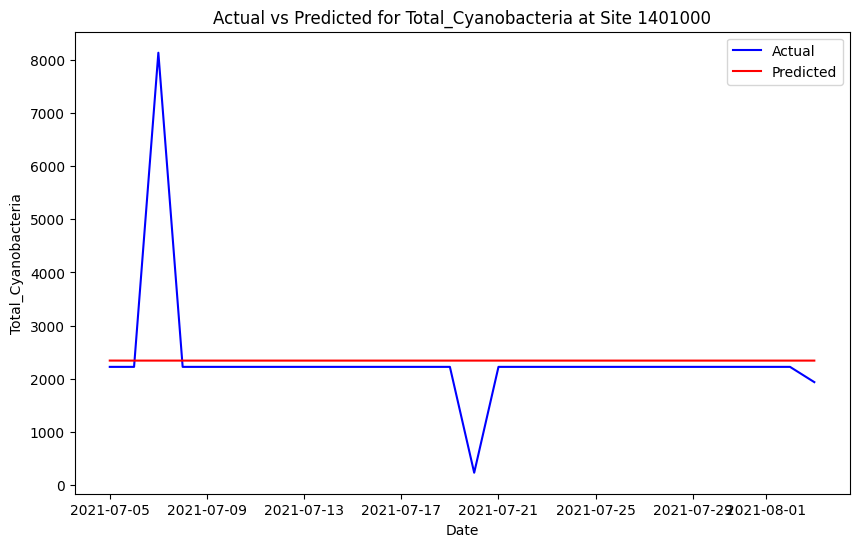

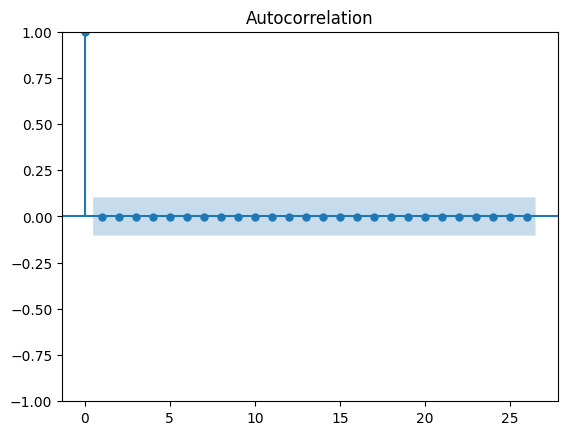

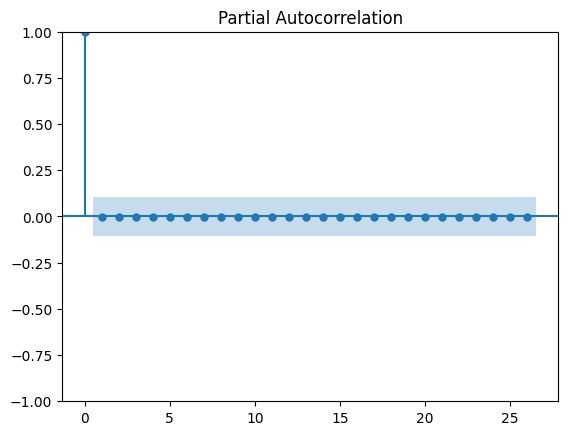

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


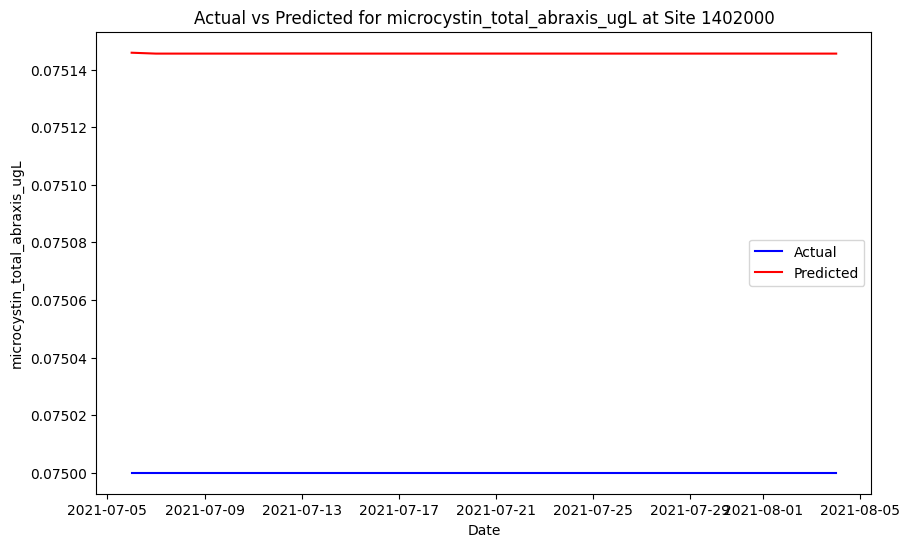

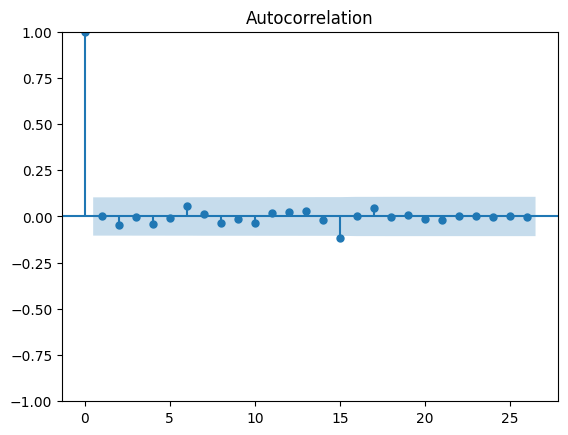

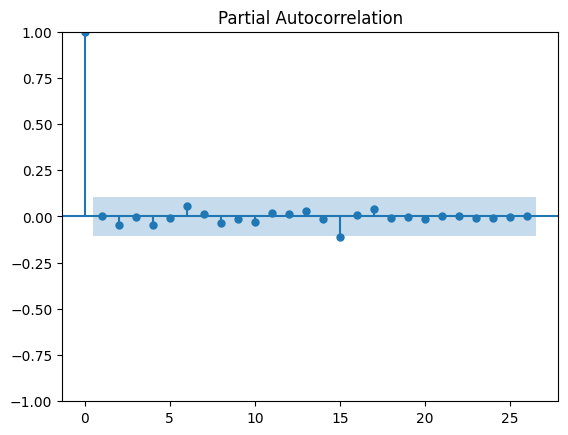

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


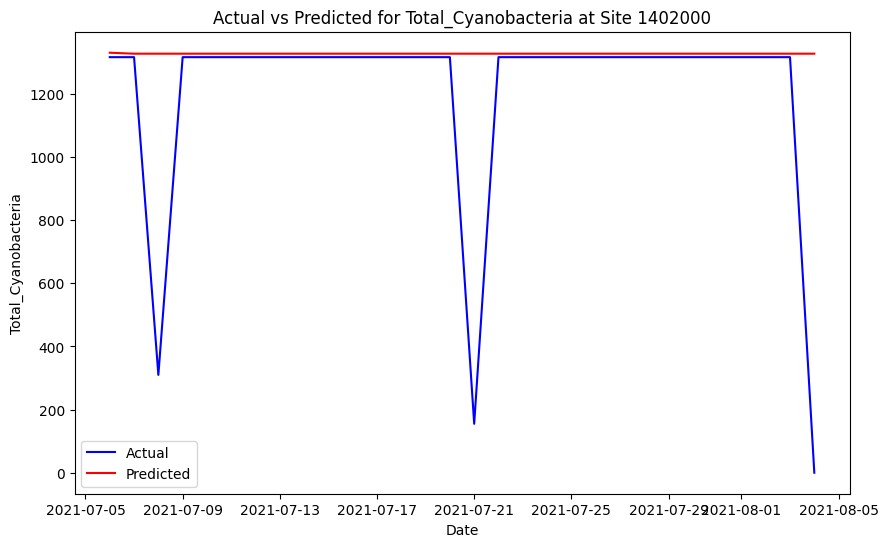

Skipping ADF test for site 1403060, target microcystin_total_abraxis_ugL due to constant values.


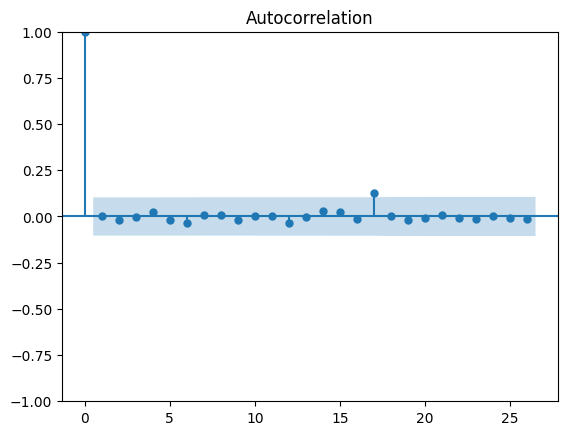

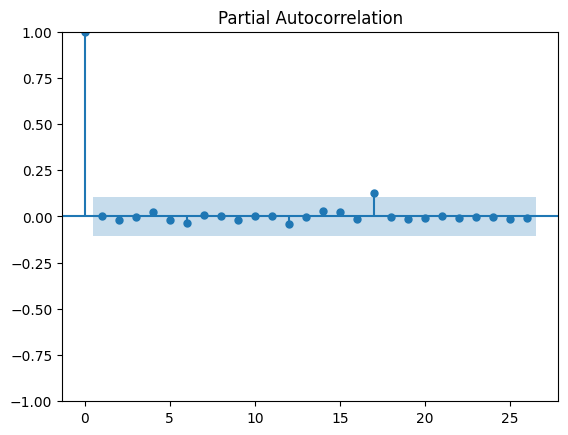

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


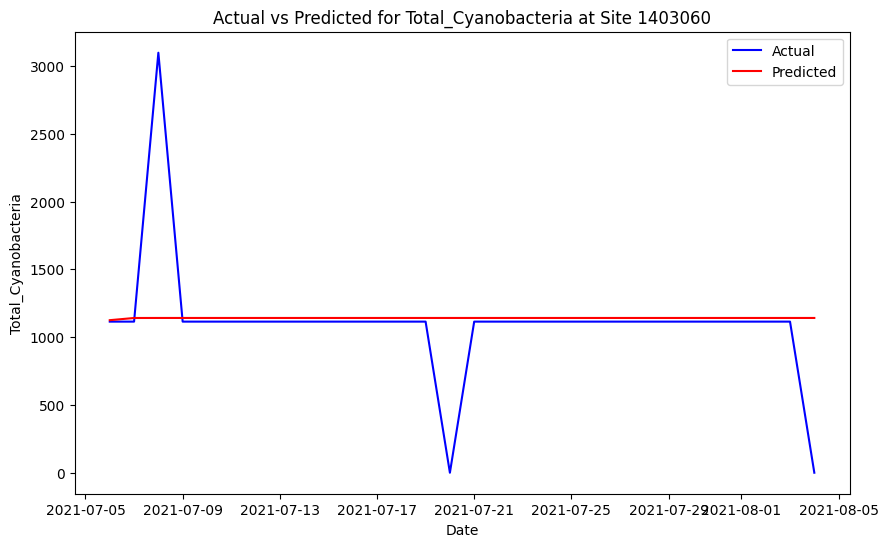

Empty DataFrame
Columns: [site, target, MAE, RMSE, R2]
Index: []


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load the data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Define targets and sites
targets = ['microcystin_total_abraxis_ugL', 'Total_Cyanobacteria']
sites = df['site_no'].unique()

# Initialize performance storage
performance_results = []

# Loop through each site and target
for site in sites:
    for target in targets:
        site_df = df[df['site_no'] == site]
        site_df = site_df[['dateTime', target]].set_index('dateTime')

        # Check for constant values before applying ADF test
        if site_df[target].nunique() <= 1:  # Check if the data has only 1 or fewer unique values
            print(f"Skipping ADF test for site {site}, target {target} due to constant values.")
            continue  # Skip to the next iteration

        # Check for stationarity using ADF test
        result = adfuller(site_df[target])

        # If p-value is above 0.05, the data is not stationary, so we difference it
        if result[1] > 0.05:
            site_df[target] = site_df[target].diff().dropna()

        # If after differencing, data is constant, skip this site and target
        if site_df[target].nunique() <= 1:
            print(f"Skipping ARIMA modeling for site {site}, target {target} as data is constant after differencing.")
            continue

        # Plot ACF and PACF to identify p, d, q values (can adjust order based on plots)
        plot_acf(site_df[target])
        plot_pacf(site_df[target])
        plt.show()

        # Based on ACF/PACF, we choose p=1, d=1, q=1 for simplicity (you can adjust)
        model = ARIMA(site_df[target], order=(1,1,1))
        model_fit = model.fit()

        # Make predictions on the last 30 data points (test data)
        y_true = site_df[target][-30:]  # Last 30 data points for testing
        y_pred = model_fit.forecast(steps=30)

        # Evaluate performance on the test set
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)

        # Store performance for each site and target
        performance_results.append({
            'site': site,
            'target': target,
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        })

        # Plot Actual vs Predicted for each site and target
        plt.figure(figsize=(10,6))
        plt.plot(y_true.index, y_true, label='Actual', color='blue')
        plt.plot(y_true.index, y_pred, label='Predicted', color='red')
        plt.title(f'Actual vs Predicted for {target} at Site {site}')
        plt.xlabel('Date')
        plt.ylabel(target)
        plt.legend()
        plt.show()

# Create DataFrame of performance results
performance_df = pd.DataFrame(performance_results)

# Filter for good performance (you can adjust thresholds)
good_performance_df = performance_df[performance_df['R2'] > 0.5]  # Adjust R² threshold if needed

# Display good performance results
print(good_performance_df)

# Now you have the best-performing sites

In [ ]:
#seasonal analysis for xboost only for

Seasonal Analysis for Total Cyanobacteria:


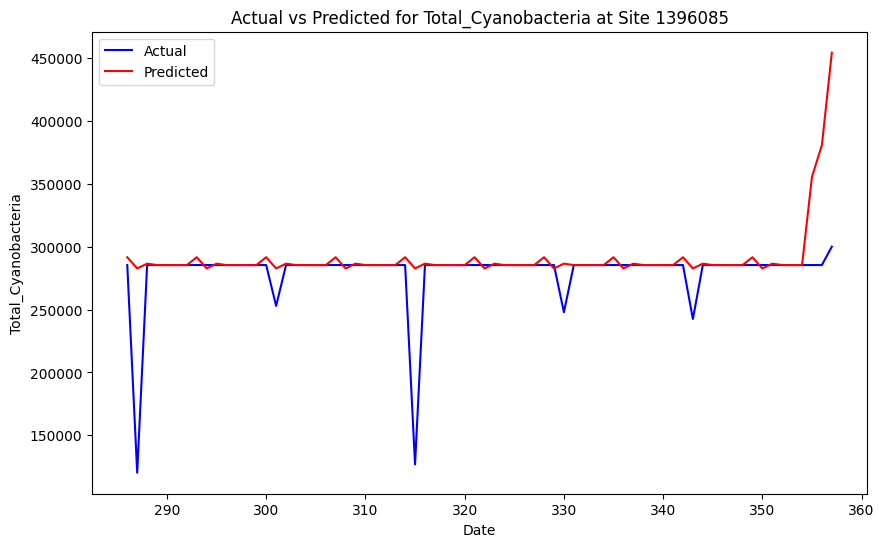

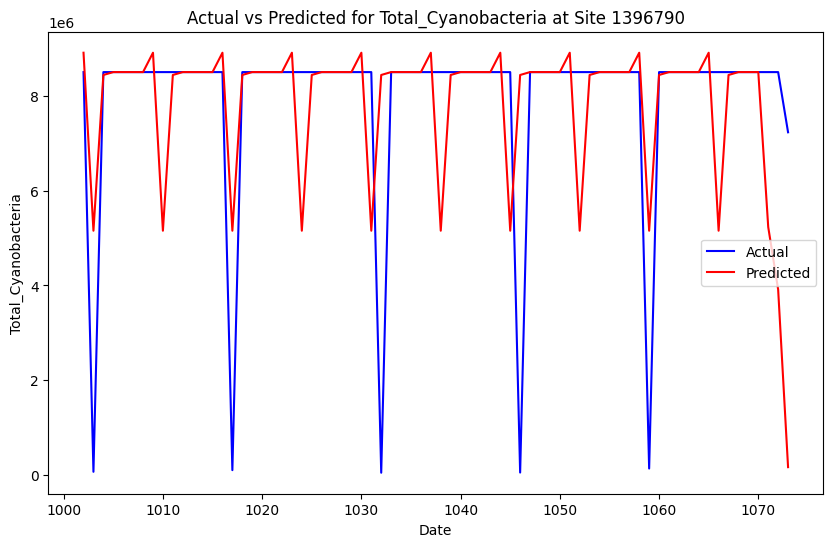

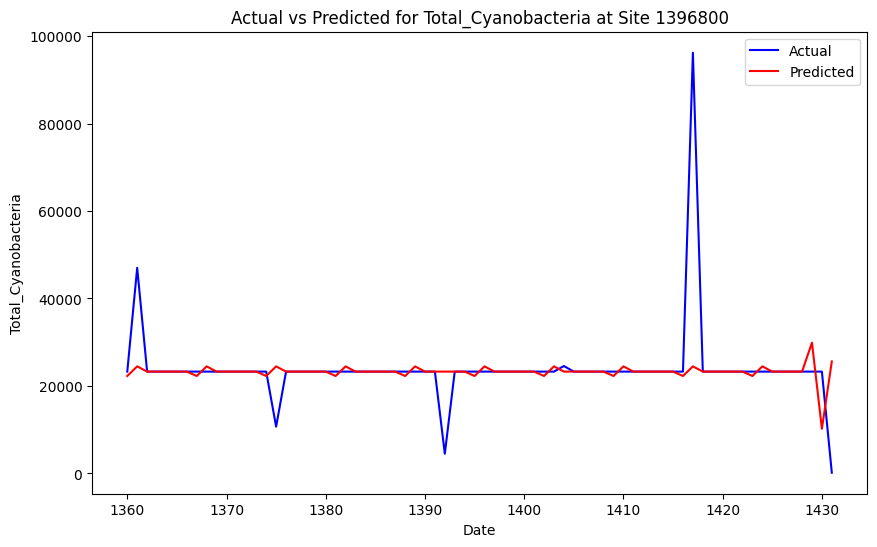

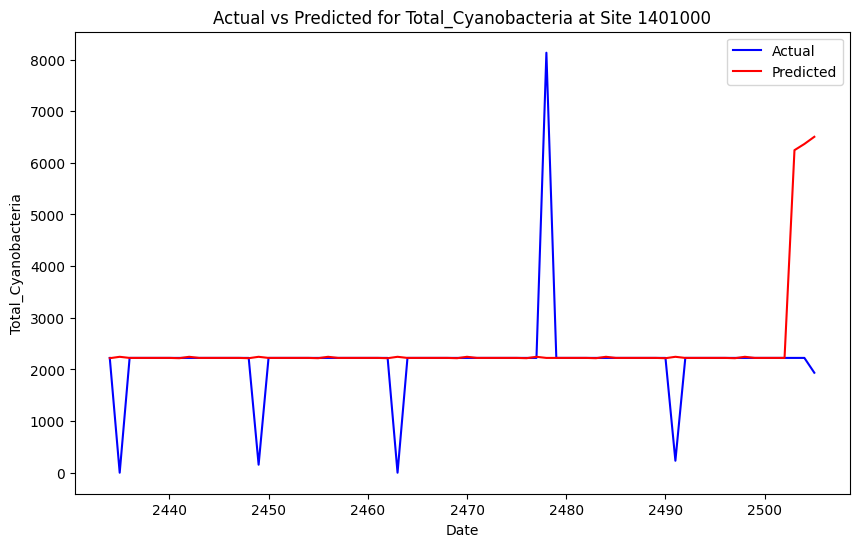

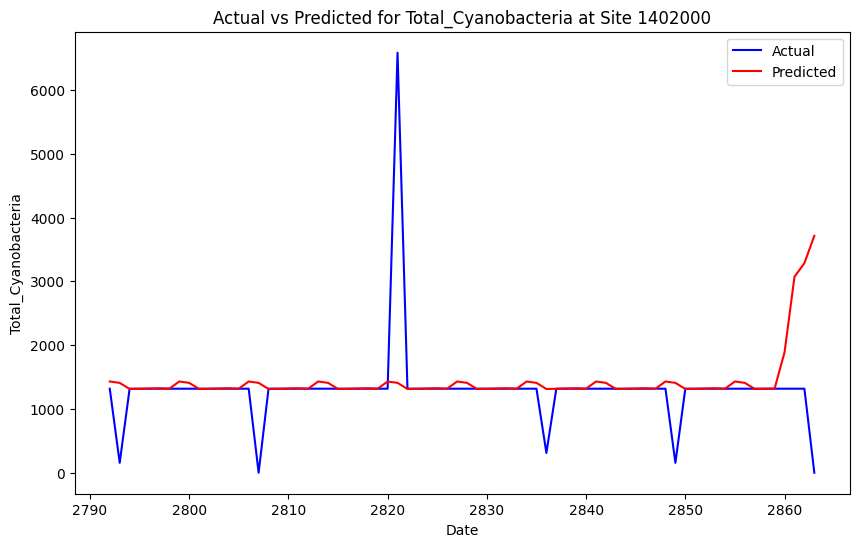

      site           MAE          RMSE        R2
0  1396085  1.162016e+04  3.593103e+04 -0.706438
1  1396790  1.038678e+06  2.291873e+06 -0.149006
2  1396800  2.662583e+03  9.914785e+03 -0.025628
3  1401000  3.808204e+02  1.222573e+03 -1.030227
4  1402000  2.767264e+02  8.671832e+02 -0.551090
Seasonal Analysis for Microcystin:


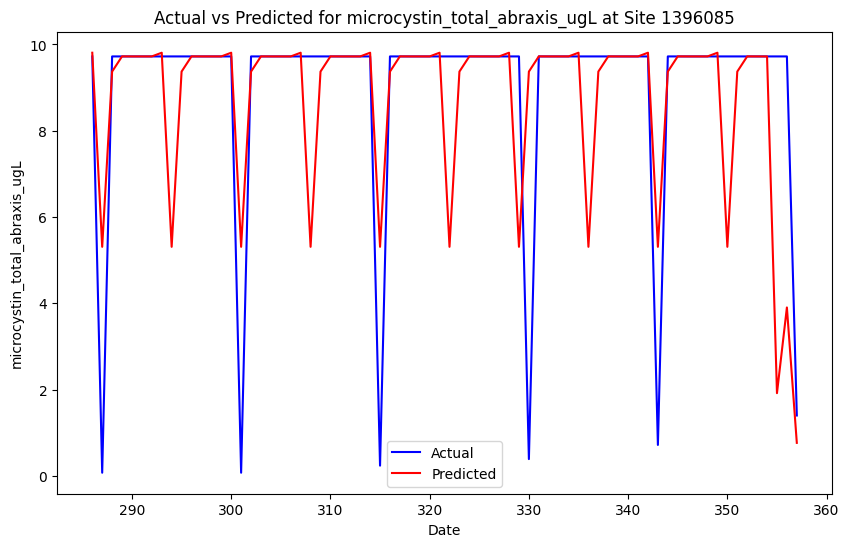

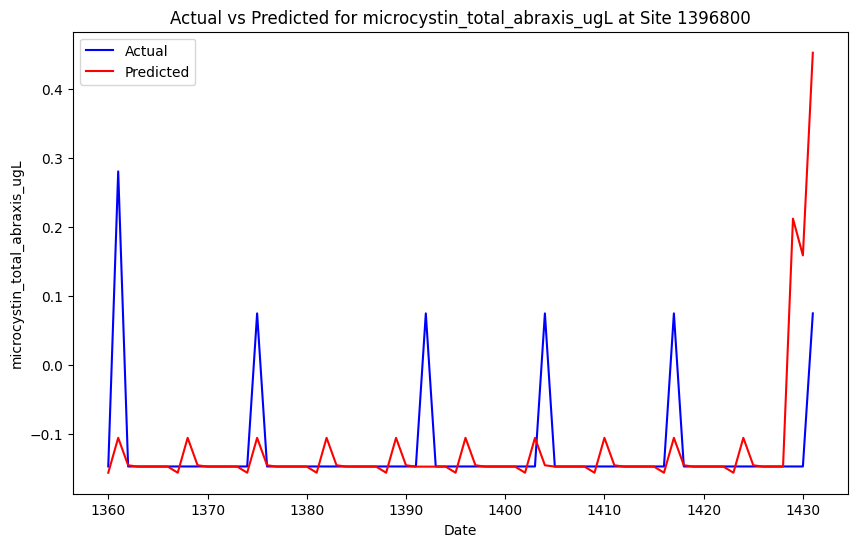

      site       MAE      RMSE        R2
0  1396085  1.025957  2.343093  0.160150
1  1396800  0.036676  0.098007 -0.742085


In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('/content/drive/MyDrive/research_Mine/final_usgs_imputed_data_with_temperature.csv', parse_dates=['dateTime'])
df = df.sort_values(['site_no', 'dateTime']).reset_index(drop=True)

# Define selected sites for analysis
selected_sites_cyanobacteria = [1396085, 1396790, 1396800, 1401000, 1402000]
selected_sites_microcystin = [1396085, 1396800]

# Function to extract seasonal features
def extract_seasonal_features(df):
    df['month'] = df['dateTime'].dt.month
    df['day_of_year'] = df['dateTime'].dt.dayofyear
    df['weekday'] = df['dateTime'].dt.weekday
    return df

# Function for XGBoost modeling and evaluation
def xgboost_seasonal_analysis(df, sites, target_column):
    performance_results = []

    for site in sites:
        site_df = df[df['site_no'] == site]
        site_df = extract_seasonal_features(site_df)

        # Prepare data
        X = site_df[['month', 'day_of_year', 'weekday']]  # Use seasonal features
        y = site_df[target_column]

        # Split data into train and test
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

        # Train the XGBoost model
        model = xgb.XGBRegressor(objective='reg:squarederror')
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_test)

        # Evaluate performance
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)

        # Store results
        performance_results.append({
            'site': site,
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        })

        # Plot actual vs predicted
        plt.figure(figsize=(10,6))
        plt.plot(y_test.index, y_test, label='Actual', color='blue')
        plt.plot(y_test.index, y_pred, label='Predicted', color='red')
        plt.title(f'Actual vs Predicted for {target_column} at Site {site}')
        plt.xlabel('Date')
        plt.ylabel(target_column)
        plt.legend()
        plt.show()

    return pd.DataFrame(performance_results)

# Seasonal analysis for Total Cyanobacteria
print("Seasonal Analysis for Total Cyanobacteria:")
performance_cyanobacteria = xgboost_seasonal_analysis(df, selected_sites_cyanobacteria, 'Total_Cyanobacteria')
print(performance_cyanobacteria)

# Seasonal analysis for Microcystin
print("Seasonal Analysis for Microcystin:")
performance_microcystin = xgboost_seasonal_analysis(df, selected_sites_microcystin, 'microcystin_total_abraxis_ugL')
print(performance_microcystin)


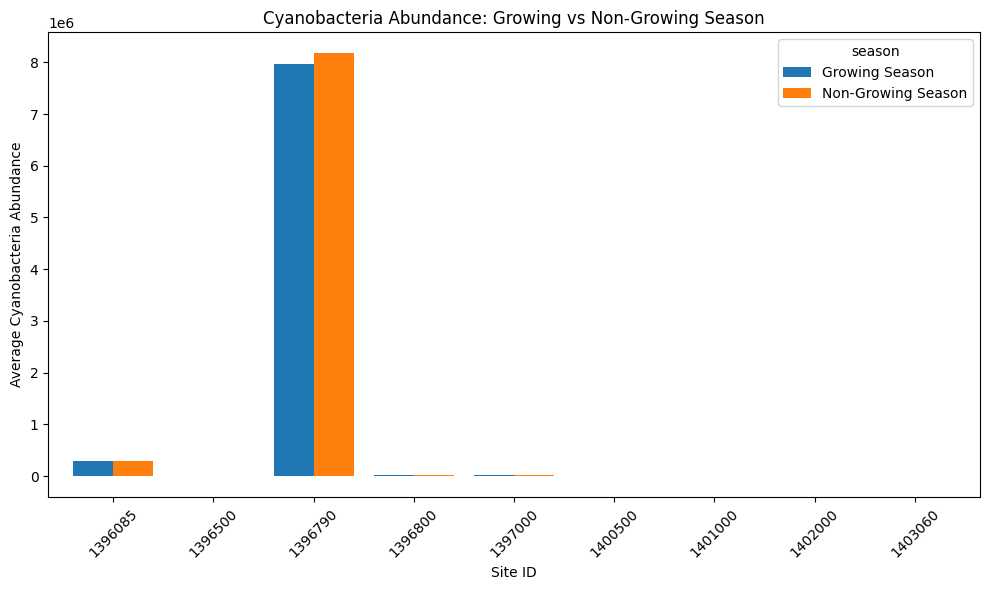

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample data for Total Cyanobacteria (replace this with your actual dataset)
# Assuming you have a dataframe `df` with columns: 'dateTime', 'site_no', 'Total_Cyanobacteria'

# Ensure the dateTime column is in datetime format
df['dateTime'] = pd.to_datetime(df['dateTime'])

# Extract month and season information
df['month'] = df['dateTime'].dt.month

# Define growing season (April to September) and non-growing season (October to March)
df['season'] = df['month'].apply(lambda x: 'Growing Season' if 4 <= x <= 9 else 'Non-Growing Season')

# Group by site and season, and calculate the mean cyanobacteria abundance
seasonal_abundance = df.groupby(['site_no', 'season'])['Total_Cyanobacteria'].mean().unstack()

# Plot the results
seasonal_abundance.plot(kind='bar', figsize=(10, 6), width=0.8)
plt.title('Cyanobacteria Abundance: Growing vs Non-Growing Season')
plt.ylabel('Average Cyanobacteria Abundance')
plt.xlabel('Site ID')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


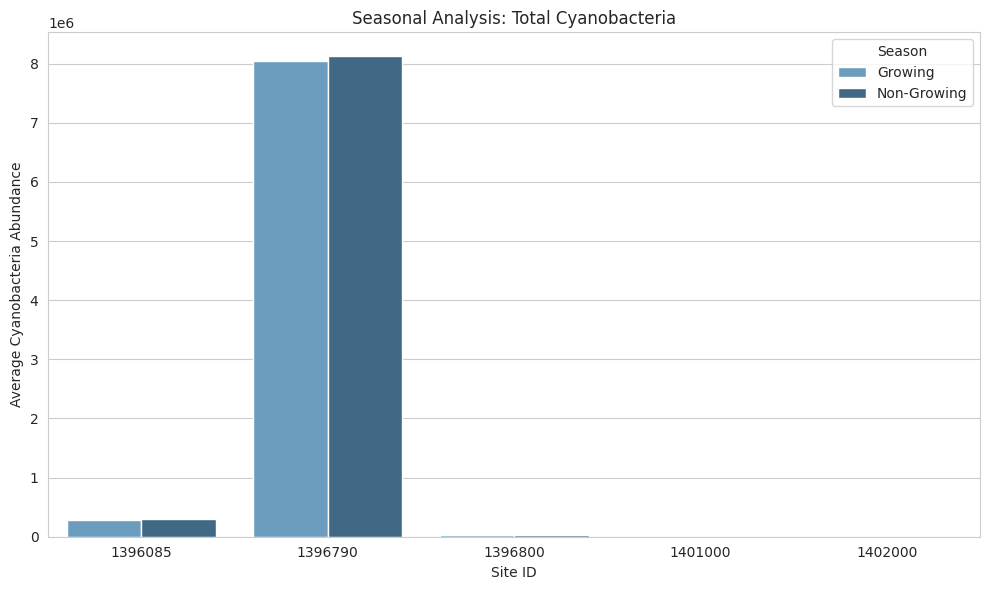

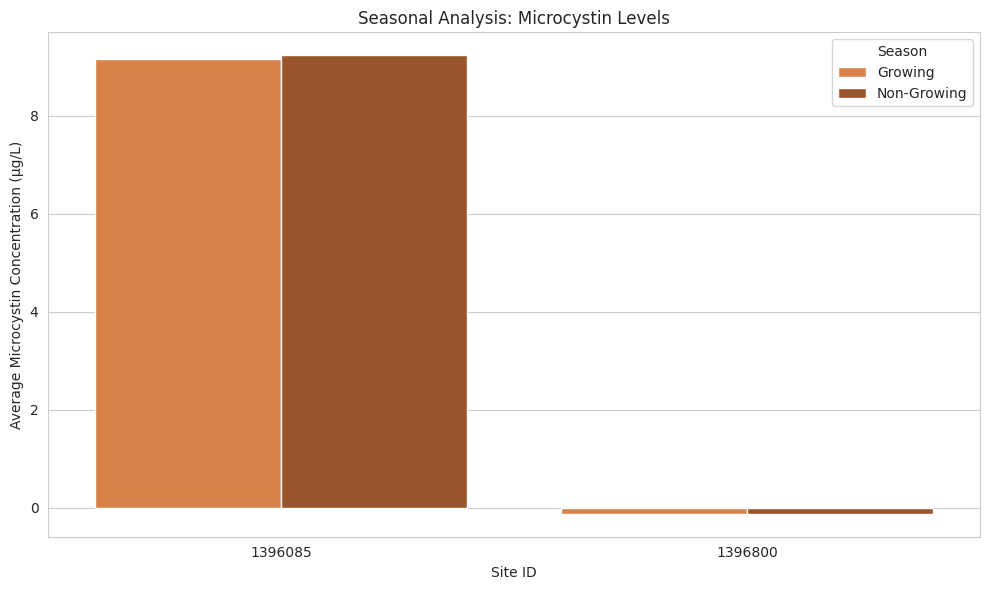

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Assuming you have already loaded the dataset (df) and performed necessary preprocessing

# Filter the sites of interest for seasonal analysis (Total Cyanobacteria and Microcystin)
sites_cyano = [1396085, 1396790, 1396800, 1401000, 1402000]
sites_microcystin = [1396085, 1396800]

# Create seasonal labels for growing and non-growing season (example: months, adjust as needed)
df['month'] = df['dateTime'].dt.month
df['season'] = np.where(df['month'].isin([3,4,5,6,7,8]), 'Growing', 'Non-Growing')

# Filter the dataframe for the selected sites
df_cyano = df[df['site_no'].isin(sites_cyano)]
df_microcystin = df[df['site_no'].isin(sites_microcystin)]

# Seasonal analysis for Total Cyanobacteria
cyano_seasonal = df_cyano.groupby(['site_no', 'season'])['Total_Cyanobacteria'].mean().reset_index()

# Seasonal analysis for Microcystin
microcystin_seasonal = df_microcystin.groupby(['site_no', 'season'])['microcystin_total_abraxis_ugL'].mean().reset_index()

# Set up the plot for Total Cyanobacteria
plt.figure(figsize=(10, 6))
sns.barplot(x='site_no', y='Total_Cyanobacteria', hue='season', data=cyano_seasonal, palette="Blues_d")
plt.title('Seasonal Analysis: Total Cyanobacteria')
plt.xlabel('Site ID')
plt.ylabel('Average Cyanobacteria Abundance')
plt.legend(title='Season')
plt.tight_layout()
plt.show()

# Set up the plot for Microcystin
plt.figure(figsize=(10, 6))
sns.barplot(x='site_no', y='microcystin_total_abraxis_ugL', hue='season', data=microcystin_seasonal, palette="Oranges_d")
plt.title('Seasonal Analysis: Microcystin Levels')
plt.xlabel('Site ID')
plt.ylabel('Average Microcystin Concentration (µg/L)')
plt.legend(title='Season')
plt.tight_layout()
plt.show()
